In [1]:
import pandas as pd
import seaborn as sns
import gpplot
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats
from scipy.stats import ttest_ind
import math
from functools import reduce


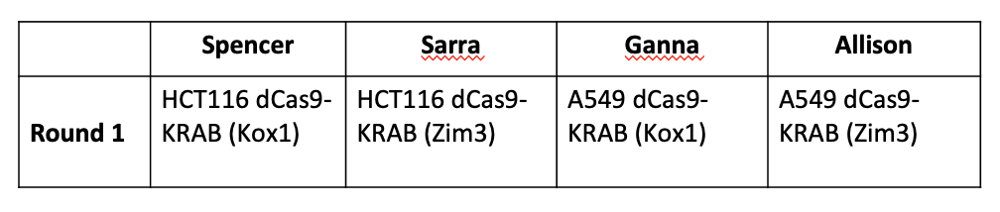

In [2]:

path_out = '../Data/PrimaryLibrary/processed_z_score/'
merged_df = pd.read_csv(path_out + 'inHouseDatasetsCombined.csv')
ess_noness = pd.read_csv('../Data/PrimaryLibrary/design/essentials_nonessentials_CRISPRi_tiling_designs_v2.csv')


# sense vs antisense

In [3]:
# add guide's orientation
merged_df_guide_orientation = pd.merge( ess_noness[[ 'Target Gene Symbol','Orientation', 'sgRNA Context Sequence']],
                                       merged_df, on = ['sgRNA Context Sequence','Target Gene Symbol'])


In [4]:
ess_merged_df_guide_orientation = merged_df_guide_orientation[merged_df_guide_orientation.Category == 'Essential']

In [5]:
ess_merged_df_guide_orientation

,Target Gene Symbol,Orientation,sgRNA Context Sequence,Category,TSS Position,sgRNA Sequence,On-Target Efficacy Score,sgRNA 'Cut' Site TSS Offset,TSS Bucket,avg_lfc_A549_Zim3,z_scored_avg_lfc_A549_Zim3,avg_lfc_A549_Kox1,z_scored_avg_lfc_A549_Kox1,avg_lfc_HCT116_Zim3,z_scored_avg_lfc_HCT116_Zim3,avg_lfc_HCT116_Kox1,z_scored_avg_lfc_HCT116_Kox1
0,ATP5F1B,antisense,GATCATAGCGACGTCCGTTGGACAGGGTAA,Essential,56645984.0,ATAGCGACGTCCGTTGGACA,0.9257,-255.0,"[-300, -200)",-1.552191,-4.689379,-0.850093,-2.539853,0.095688,-0.411864,0.004899,-0.690930
1,ATP5F1B,sense,CTCCACCCGGACTACGCCATGTTGGGGTTT,Essential,56645984.0,ACCCGGACTACGCCATGTTG,0.7588,24.0,"[0, 50)",-2.194723,-6.401185,-1.855996,-4.982472,-2.350955,-6.334629,-1.639065,-5.022683
2,ATP5F1B,antisense,GTTCAGTACCCCTATTCAACCGGAAGGTCA,Essential,56645984.0,AGTACCCCTATTCAACCGGA,0.7492,396.0,"[300, 400)",-0.540876,-1.995076,-0.411454,-1.474711,0.071676,-0.469992,0.123095,-0.379490
3,ATP5F1B,antisense,AGGGTAATCAGAGGAACTACGTTTAGGAAA,Essential,56645984.0,TAATCAGAGGAACTACGTTT,0.7506,-278.0,"[-300, -200)",-1.074078,-3.415610,-0.336583,-1.292904,-0.417191,-1.653428,-0.095713,-0.956038
4,ATP5F1B,sense,CCCCTATGGCTGTCACCTAGATCAAGGACC,Essential,56645984.0,TATGGCTGTCACCTAGATCA,0.9978,-362.0,"[-400, -300)",-2.011519,-5.913101,-1.470424,-4.046195,0.039804,-0.547147,-1.056271,-3.487054
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62150,COPS3,antisense,GAAGGGGCCCAGGCCGGGGGGAGGGGGCTC,Essential,17281246.0,GGGCCCAGGCCGGGGGGAGG,-0.9013,357.0,"[300, 400)",-1.423555,-4.346672,-0.917362,-2.703201,-0.425655,-1.673917,-0.109359,-0.991995
62151,COPS3,antisense,CGCCCGGTGGAAGGGGCCCAGGCCGGGGGG,Essential,17281246.0,CGGTGGAAGGGGCCCAGGCC,-1.1830,366.0,"[300, 400)",1.115102,2.416711,1.024884,2.013131,0.122867,-0.346070,0.075267,-0.505514
62152,COPS3,antisense,GGGGAGGGGGCTCCCGGCGGCCCGAGGGAG,Essential,17281246.0,AGGGGGCTCCCGGCGGCCCG,-1.0860,340.0,"[300, 400)",0.324349,0.310019,-0.064259,-0.631621,0.373991,0.261845,0.616093,0.919531
62153,COPS3,antisense,GGAAGGGGCCCAGGCCGGGGGGAGGGGGCT,Essential,17281246.0,GGGGCCCAGGCCGGGGGGAG,-1.7290,358.0,"[300, 400)",0.199097,-0.023672,-0.443350,-1.552163,0.184817,-0.196103,1.040089,2.036738


ess_merged_df_guide_orientation

in a df there are three columns, they are category A, category B, phenotype C. iterate through Category A, plot a boxplot comparing phenotype C respective to category B.

In [7]:
def orientation_comparison(df, phenotype_col):
    unique_gene = df['Target Gene Symbol'].unique()
    # Creating a DataFrame to store p-values
    pvalues_df = pd.DataFrame(columns=['gene', 'P-value'])

    # Plotting
    for gene in unique_gene:
        subset_df = df[df['Target Gene Symbol'] == gene]
        
        # Performing t-test between sense and antisense in each Orientation
        group_sense = subset_df[subset_df['Orientation'] == 'sense'][phenotype_col]
        group_antisense = subset_df[subset_df['Orientation'] == 'antisense'][phenotype_col]
        if len(group_sense) >= 10 and len(group_antisense) >= 10:
            #Plotting
            plt.figure(figsize=(4, 4))
            sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})
            plt.title(f'Boxplot of Z-score for {gene}')

            # Performing ttest
            t_stat, p_val = stats.ttest_ind(group_sense, group_antisense, nan_policy='omit', alternative="two-sided")
            # Annotating the p-value
            plt.annotate(f'p = {p_val:.2f}', xy=(0.5, 0.95), xycoords='axes fraction', ha='center')
            # Saving p-value in DataFrame
            new_row = pd.DataFrame({'gene': [gene], 'P-value': [p_val]})
            pvalues_df = pd.concat([pvalues_df, new_row], ignore_index=True)
            
            plt.show()
    
   # Calculate -log10(p-value)
    pvalues_df['P-value'] = pd.to_numeric(pvalues_df['P-value'], errors='coerce')

    pvalues_df['-log10(P-value)'] = -np.log10(pvalues_df['P-value'])

    max_log_value = int(pvalues_df['-log10(P-value)'].max()) + 1
    bins = np.arange(0, max_log_value + 1, 1)
    labels = [f"({i},{i+1}]" for i in range(max_log_value)]

    pvalues_df['Category'] = pd.cut(pvalues_df['-log10(P-value)'],
                                             bins=bins,
                                             right=False,
                                             labels=labels)
    return pvalues_df


/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


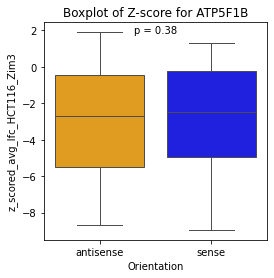

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


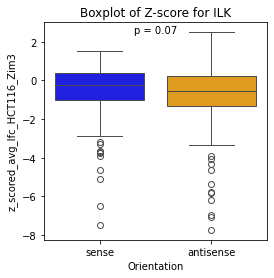

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


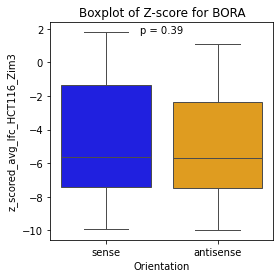

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


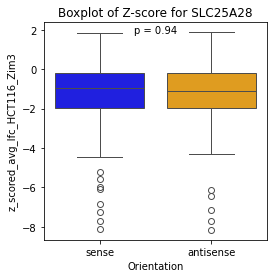

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


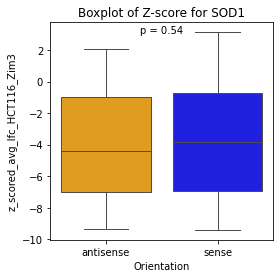

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


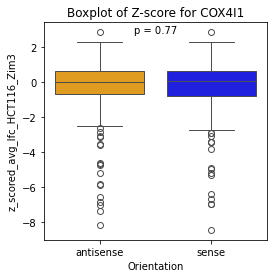

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


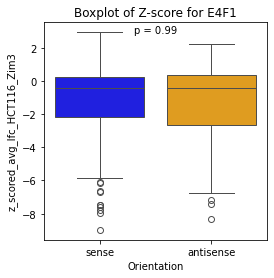

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


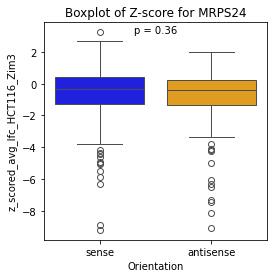

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


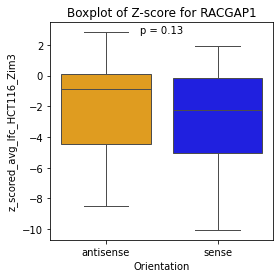

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


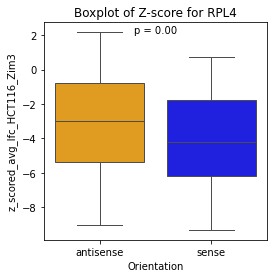

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


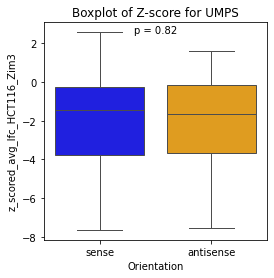

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


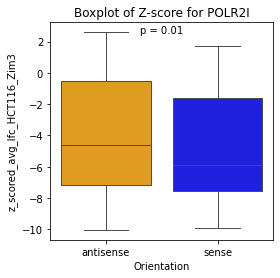

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


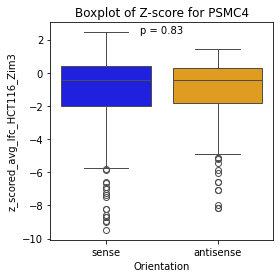

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


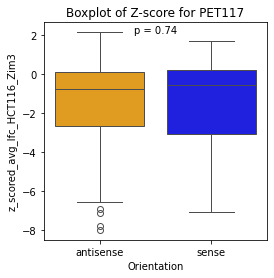

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


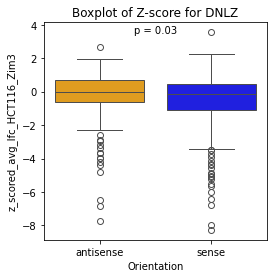

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


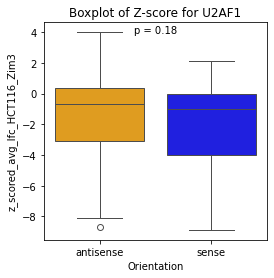

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


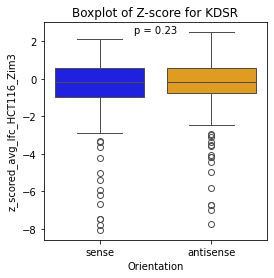

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


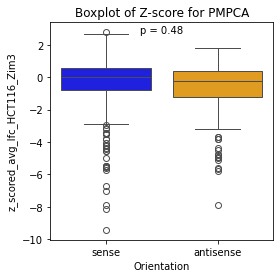

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


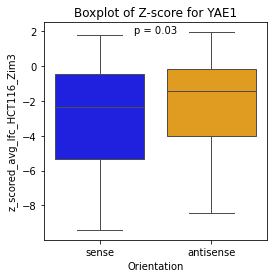

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


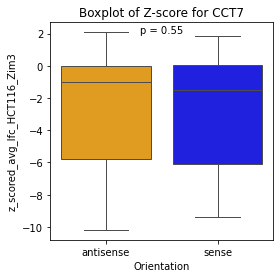

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


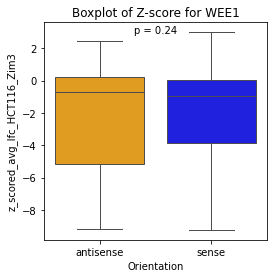

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


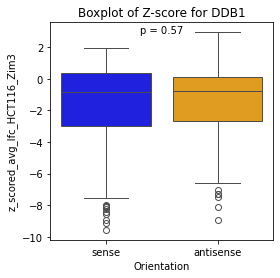

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


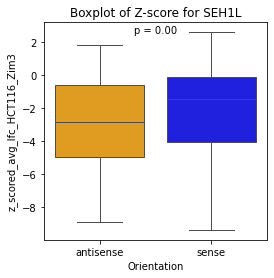

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


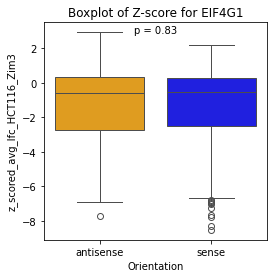

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


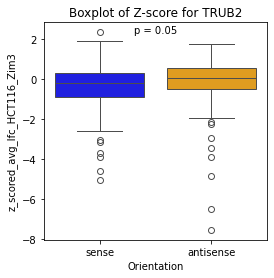

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


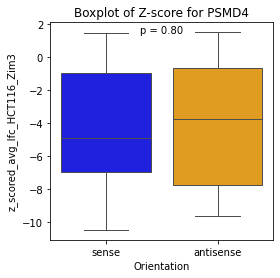

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


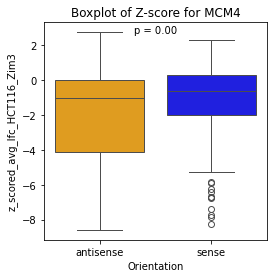

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


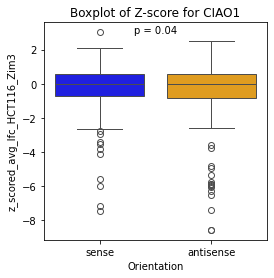

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


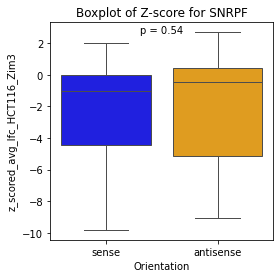

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


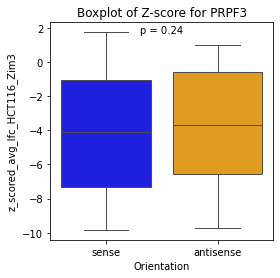

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


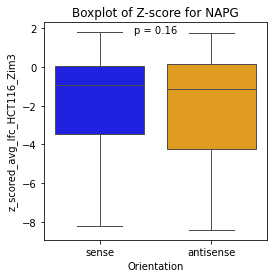

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


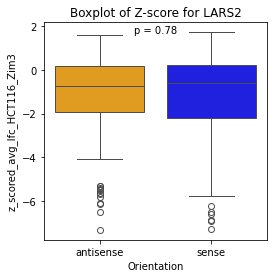

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


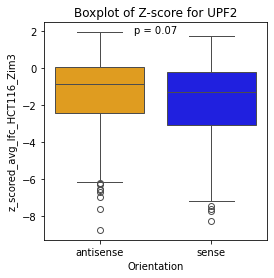

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


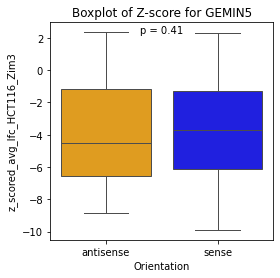

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


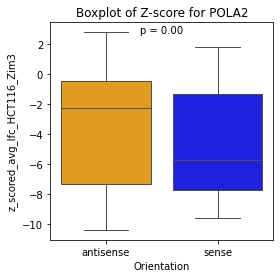

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


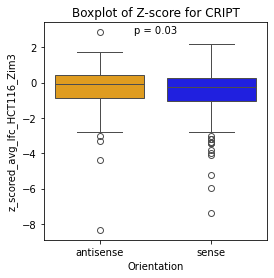

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


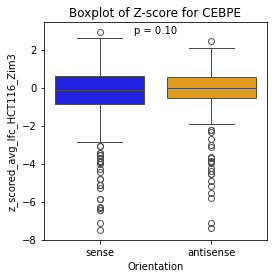

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


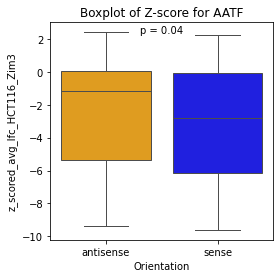

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


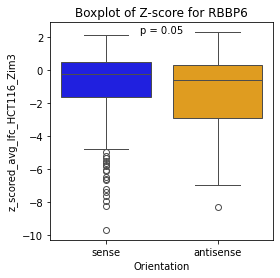

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


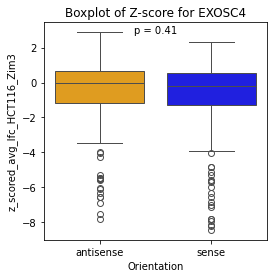

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


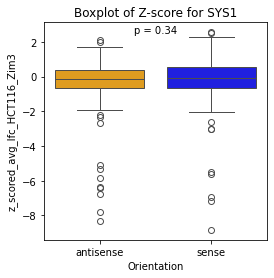

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


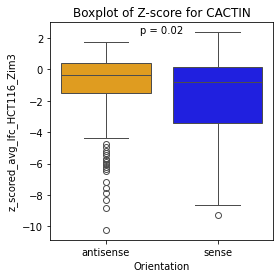

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


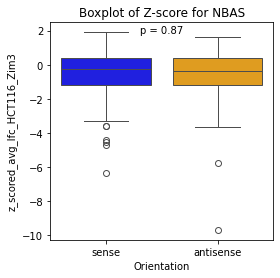

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


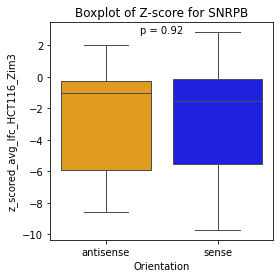

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


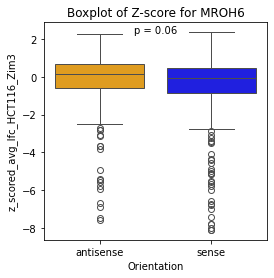

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


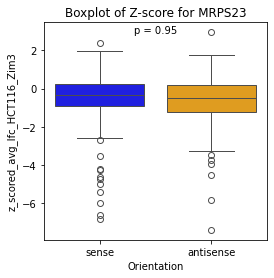

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


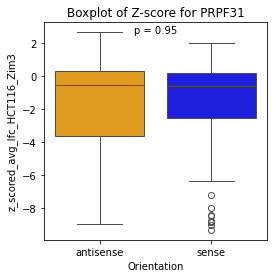

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


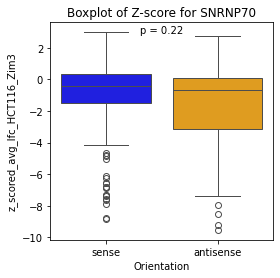

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


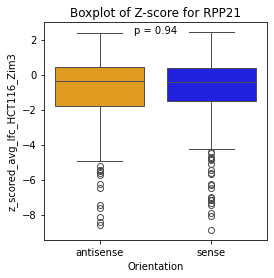

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


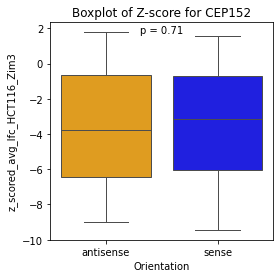

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


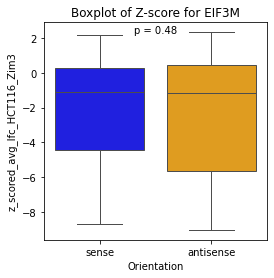

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


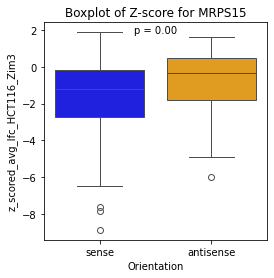

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


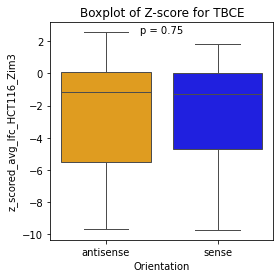

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


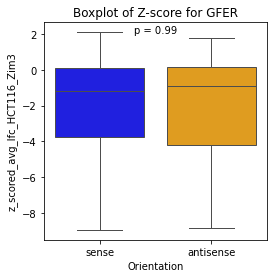

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


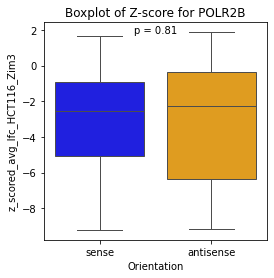

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


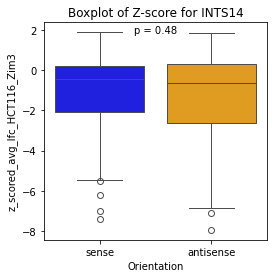

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


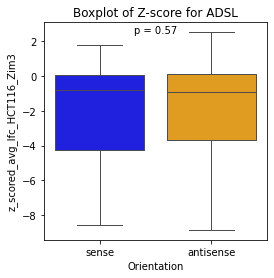

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


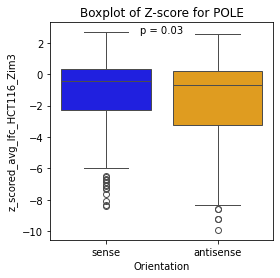

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


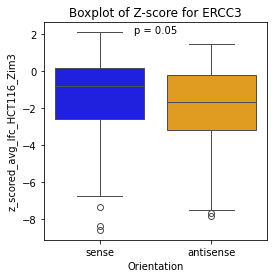

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


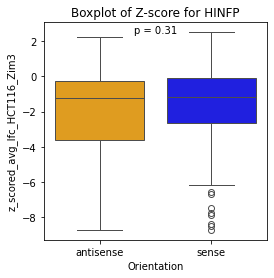

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


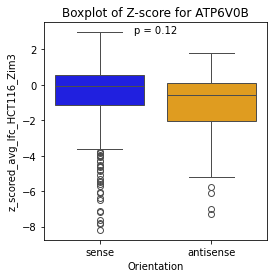

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


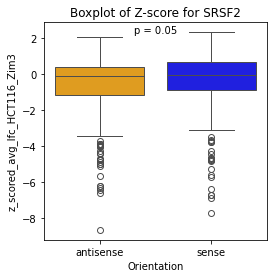

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


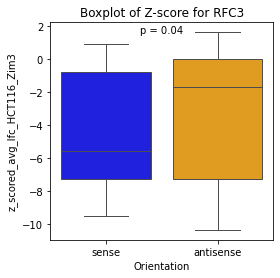

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


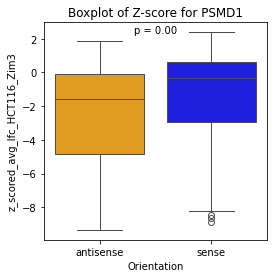

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


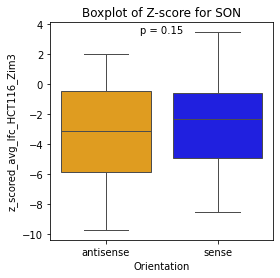

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


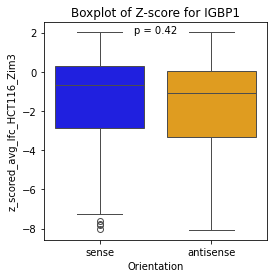

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


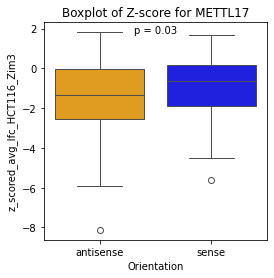

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


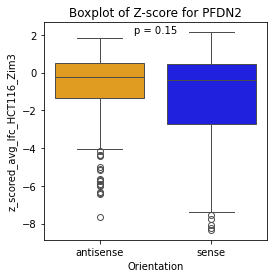

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


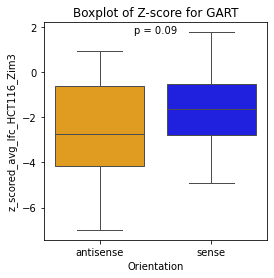

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


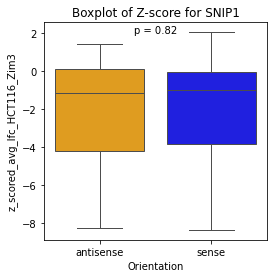

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


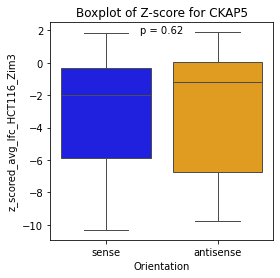

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


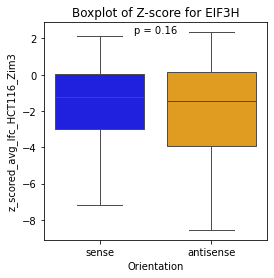

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


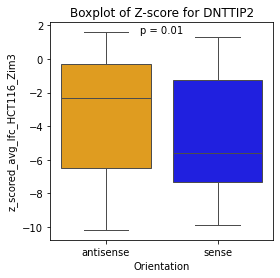

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


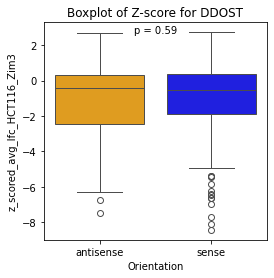

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


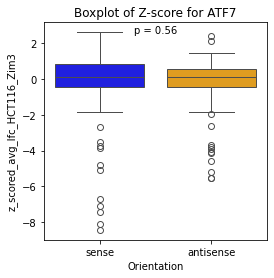

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


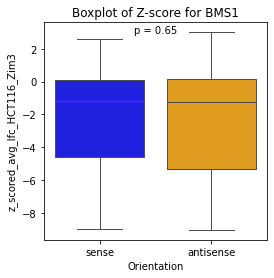

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


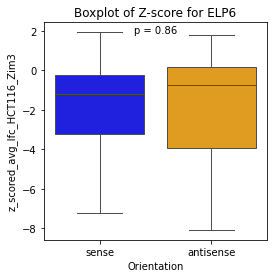

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


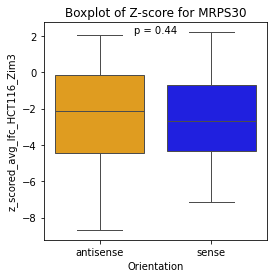

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


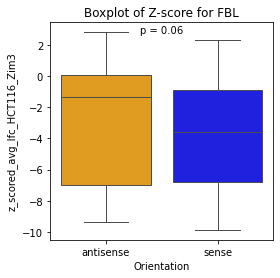

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


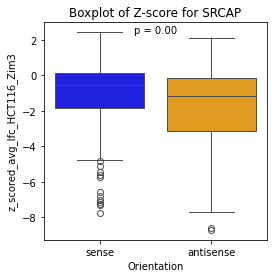

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


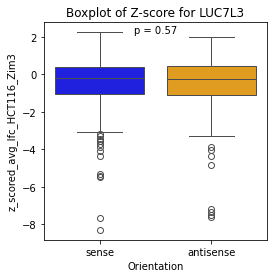

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


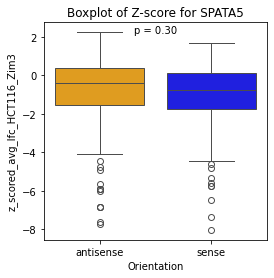

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


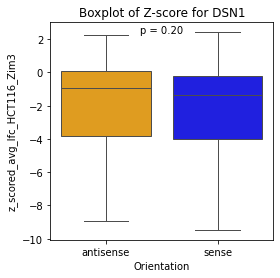

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


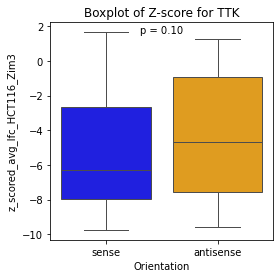

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


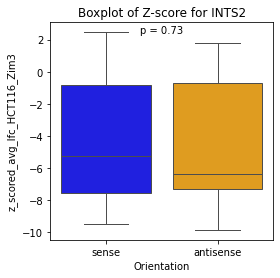

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


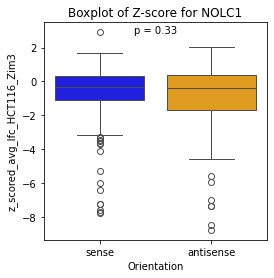

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


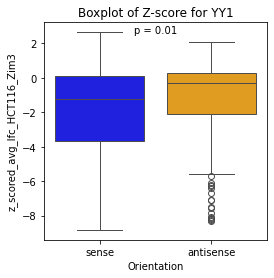

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


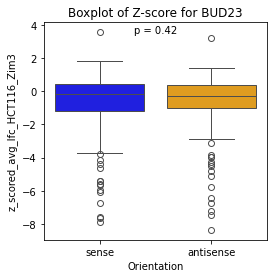

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


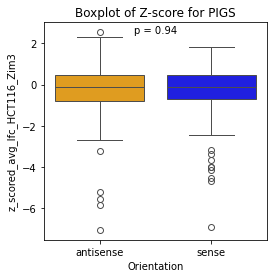

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


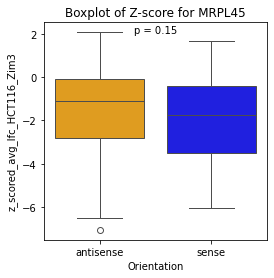

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


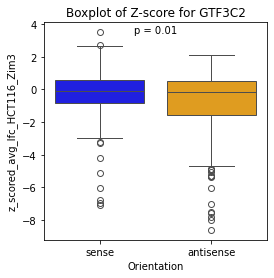

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


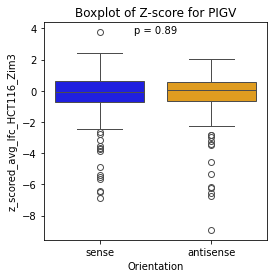

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


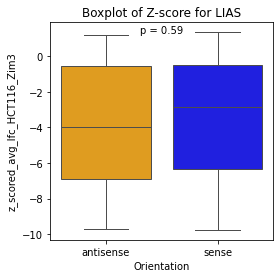

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


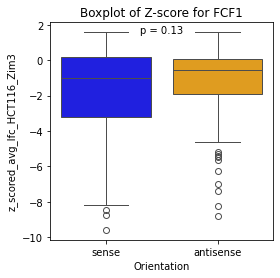

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


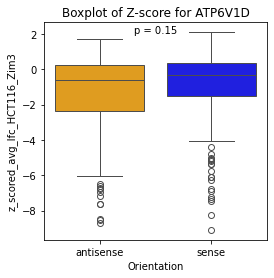

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


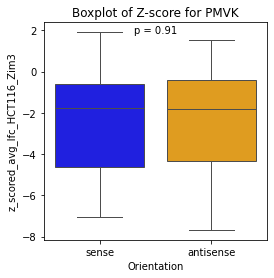

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


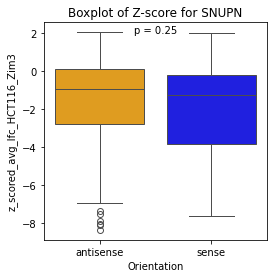

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


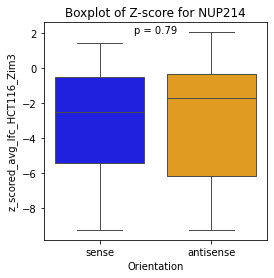

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


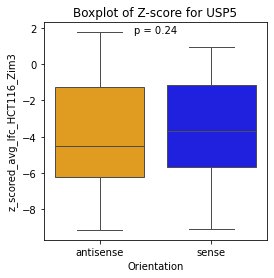

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


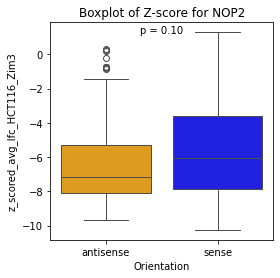

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


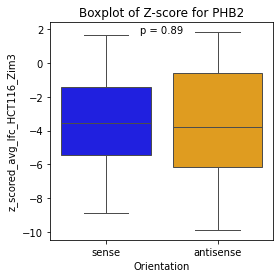

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


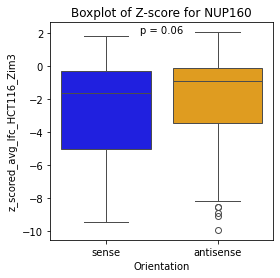

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


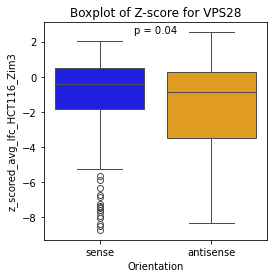

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


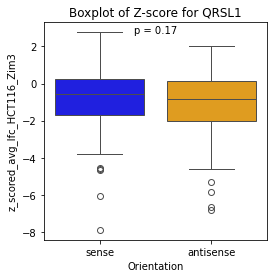

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


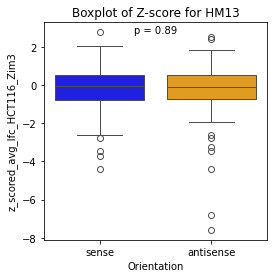

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


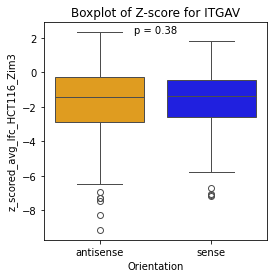

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


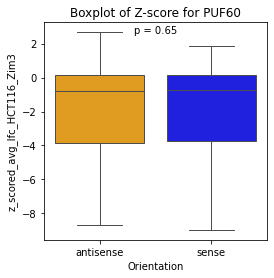

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


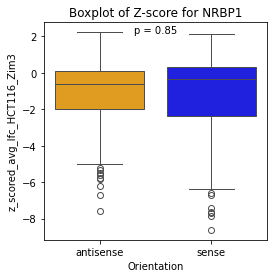

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


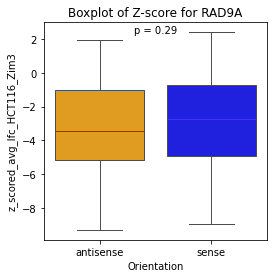

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


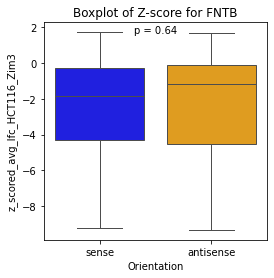

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


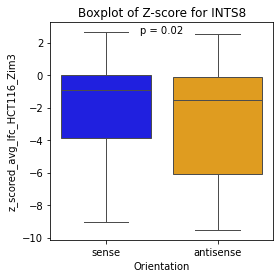

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


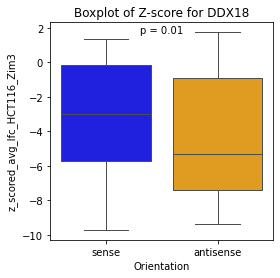

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


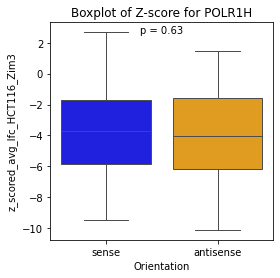

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


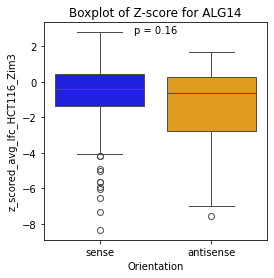

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


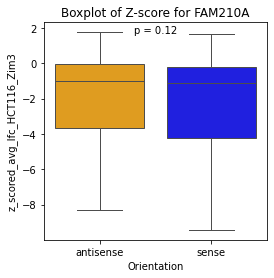

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


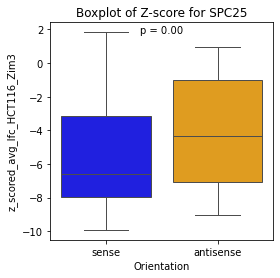

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


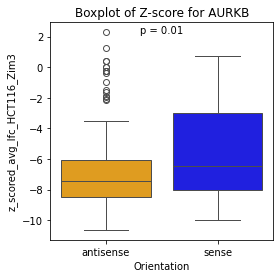

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


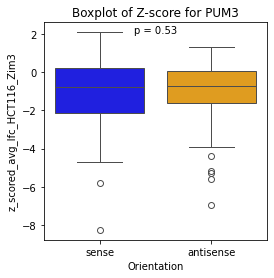

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


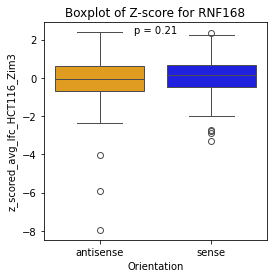

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


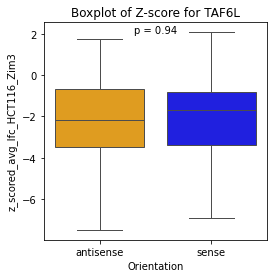

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


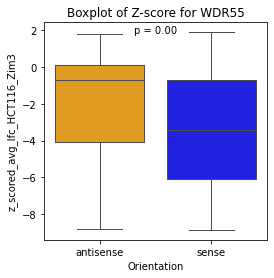

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


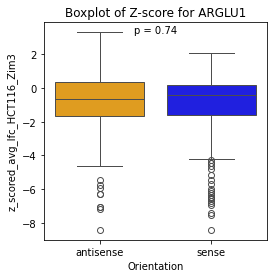

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


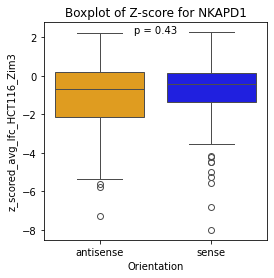

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


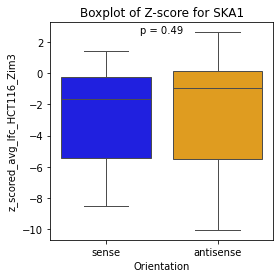

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


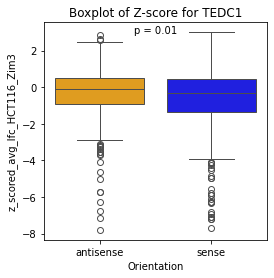

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


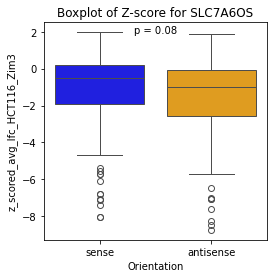

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


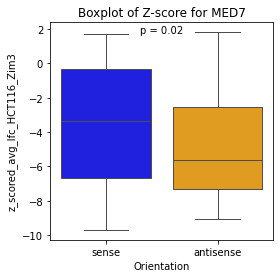

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


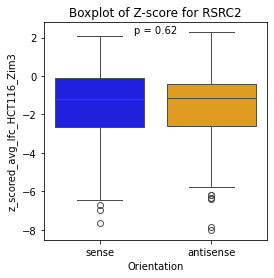

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


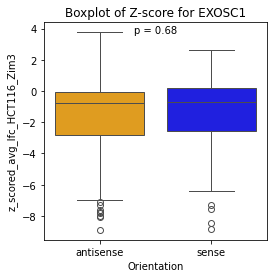

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


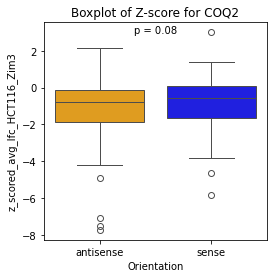

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


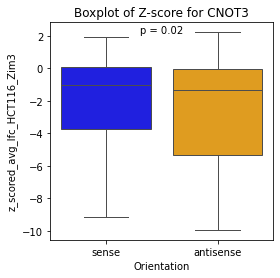

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


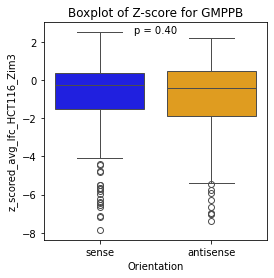

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


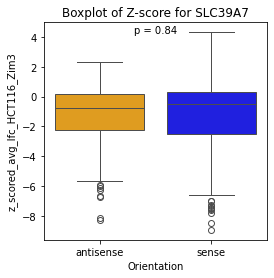

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


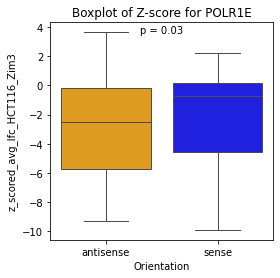

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


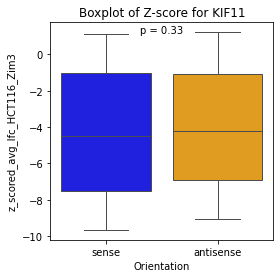

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


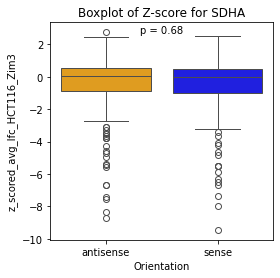

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


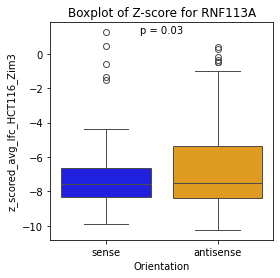

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


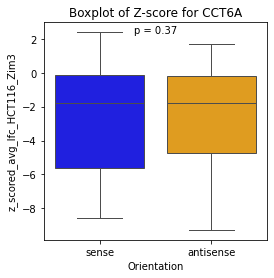

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


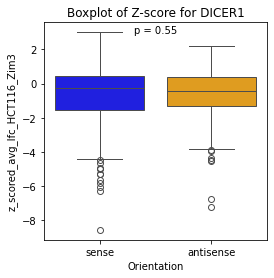

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


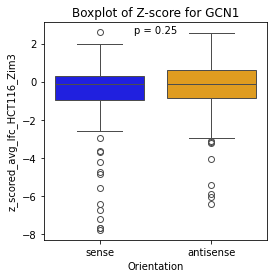

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


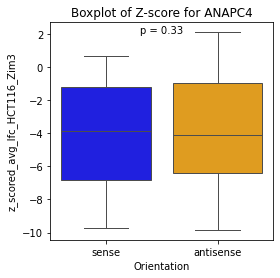

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


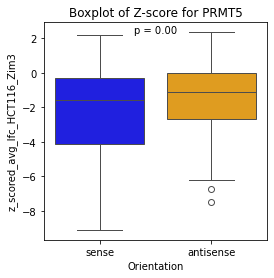

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


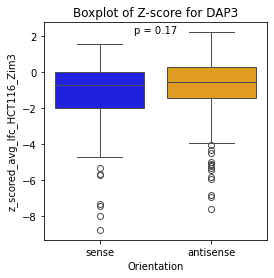

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


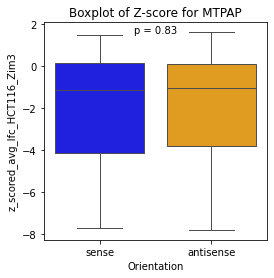

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


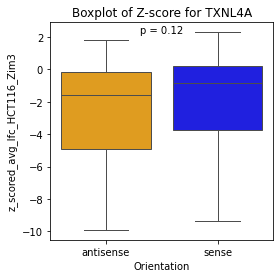

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


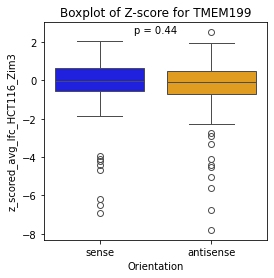

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


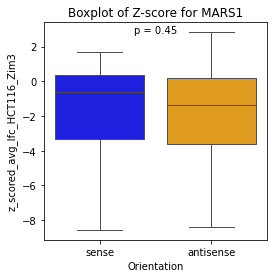

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


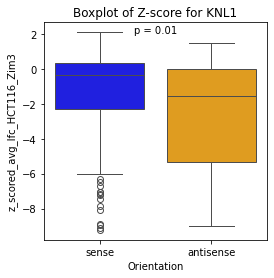

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


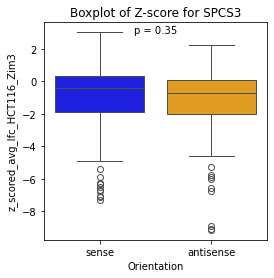

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


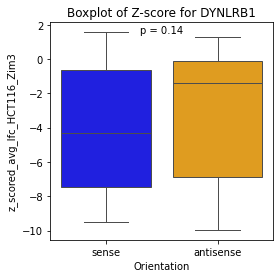

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


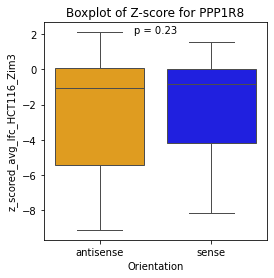

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


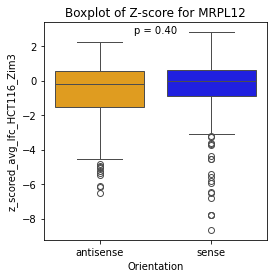

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


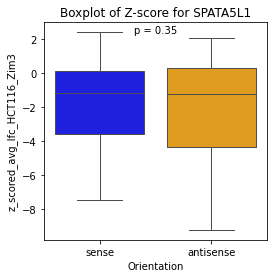

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


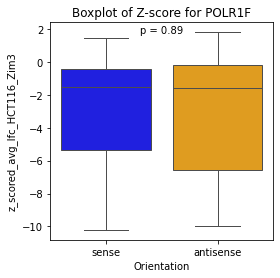

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


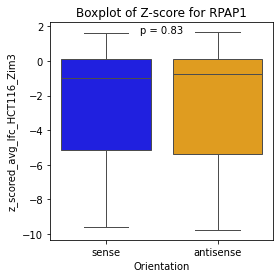

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


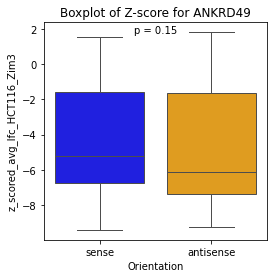

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


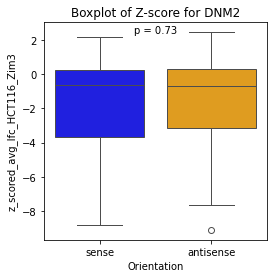

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


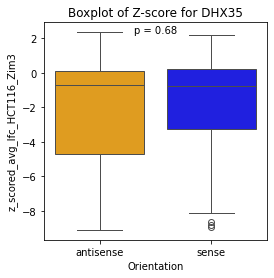

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


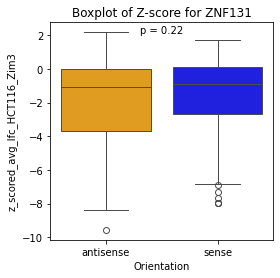

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


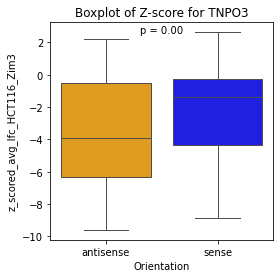

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


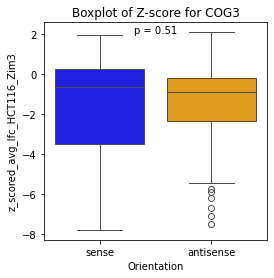

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


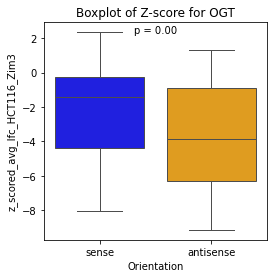

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


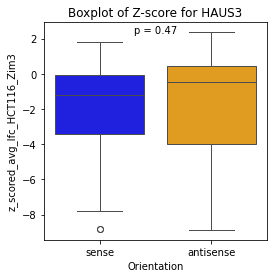

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


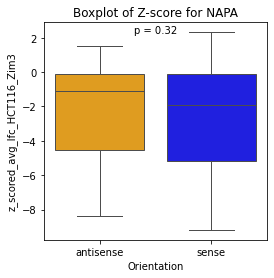

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


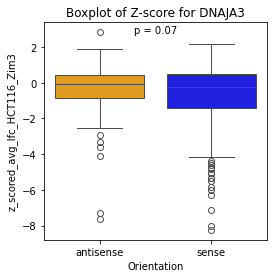

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


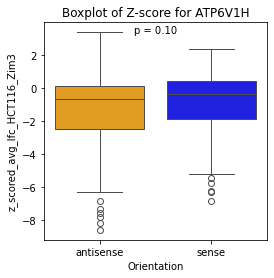

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


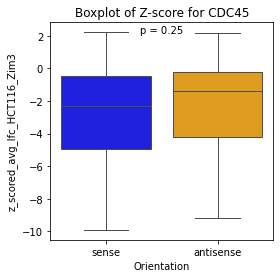

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


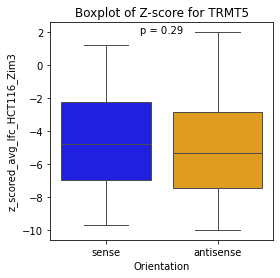

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


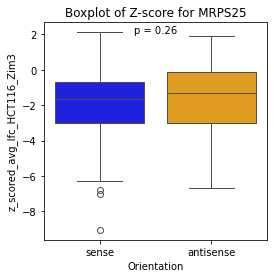

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


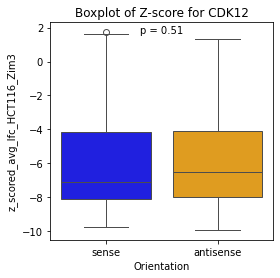

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


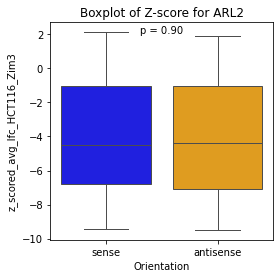

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


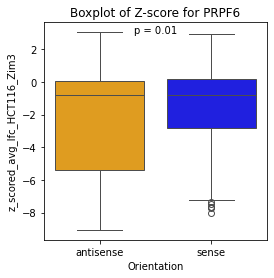

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


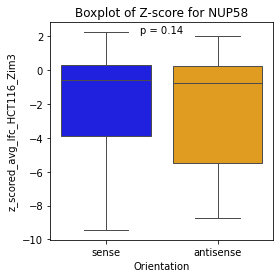

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


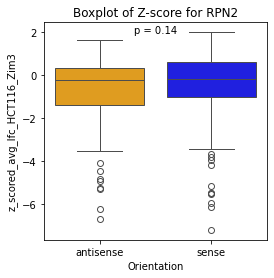

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


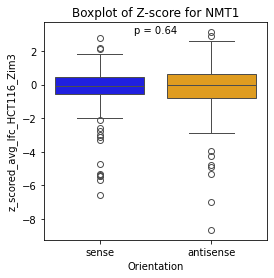

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


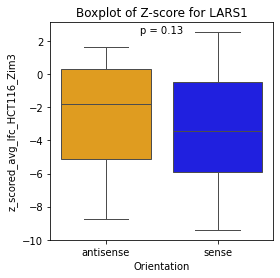

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


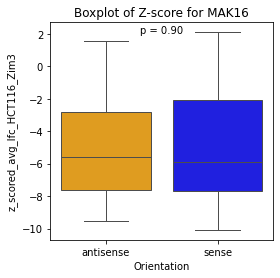

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


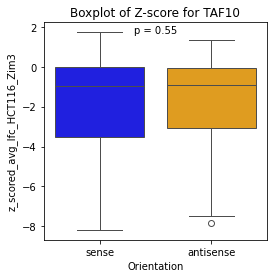

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


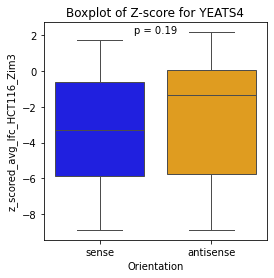

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


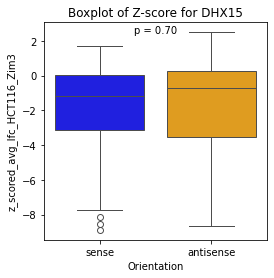

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


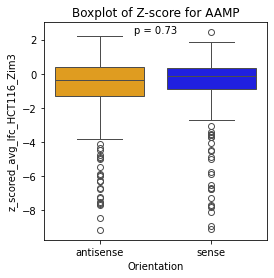

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


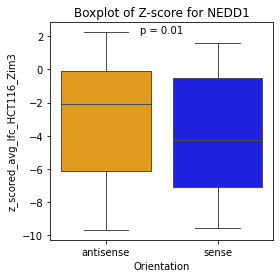

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


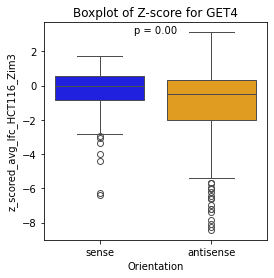

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


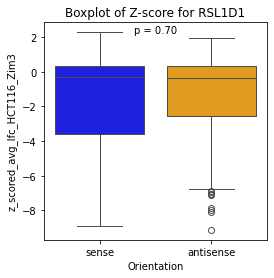

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


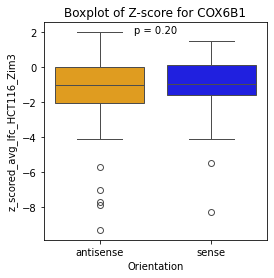

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


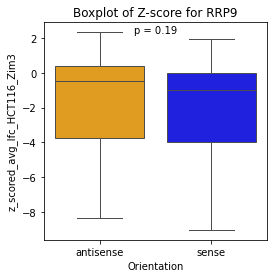

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


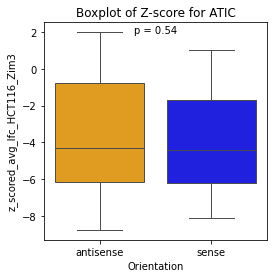

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


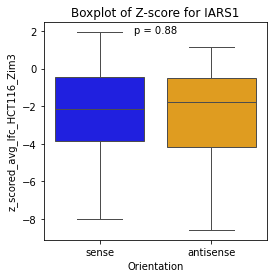

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


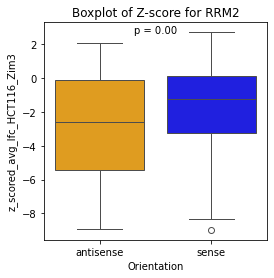

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


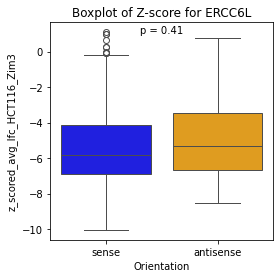

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


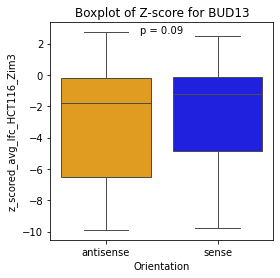

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


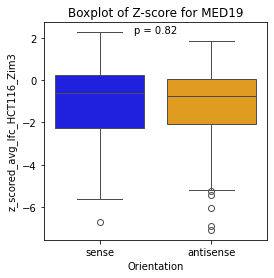

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


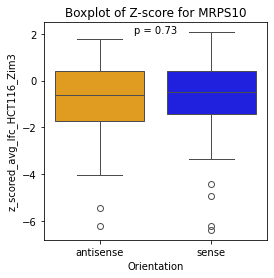

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


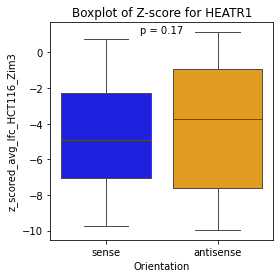

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


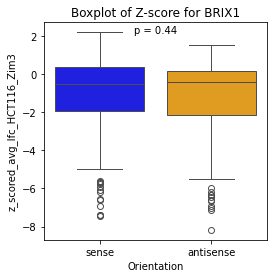

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


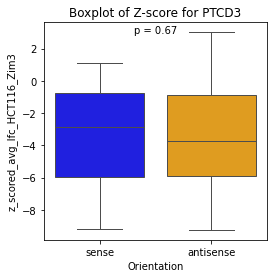

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


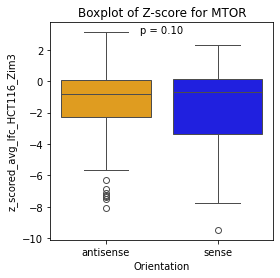

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


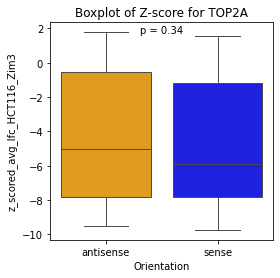

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


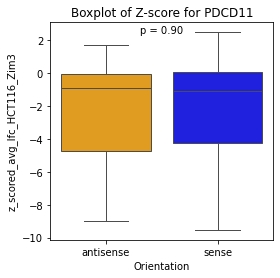

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


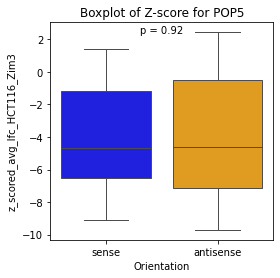

/var/folders/h4/ryygmkjj3m32xw7cjfk2gbvr0000gq/T/ipykernel_58282/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


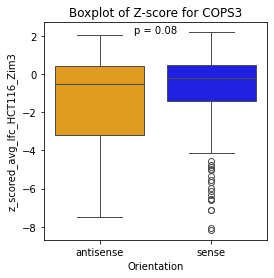

In [8]:

pvalue_HCT116_Zim3 = orientation_comparison(ess_merged_df_guide_orientation,'z_scored_avg_lfc_HCT116_Zim3')

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


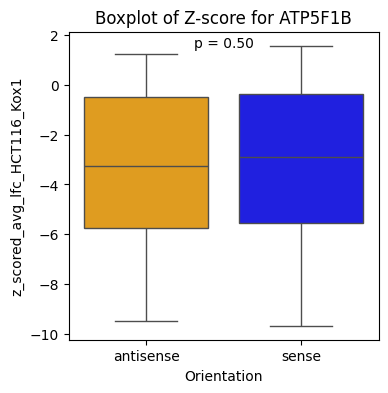

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


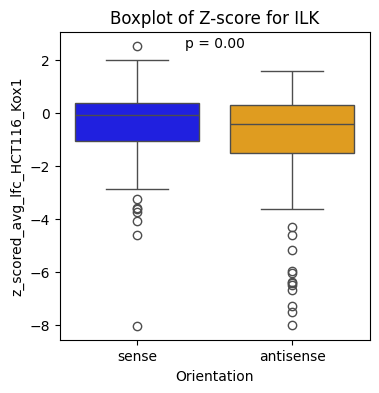

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


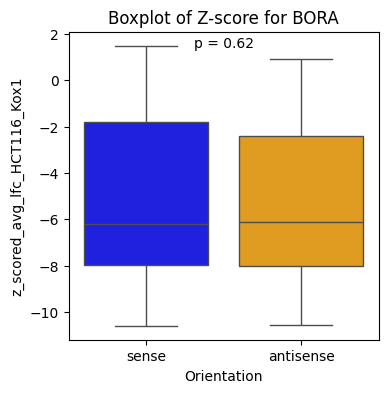

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


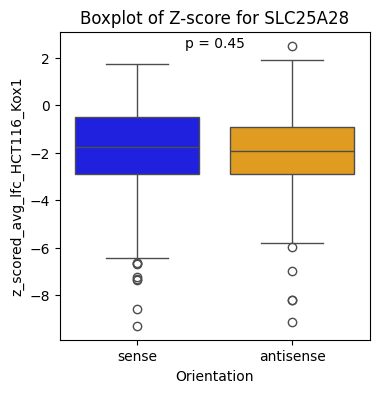

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


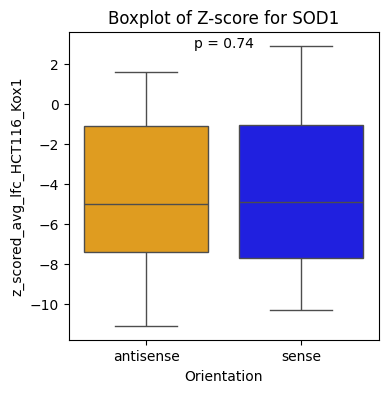

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


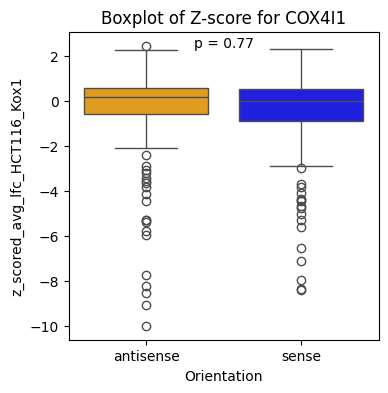

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


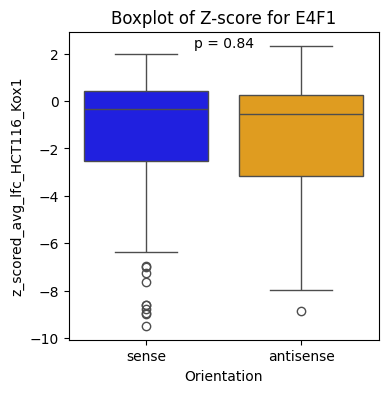

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


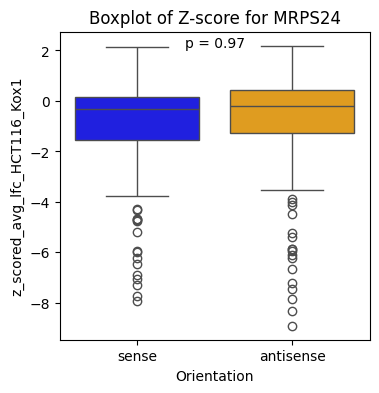

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


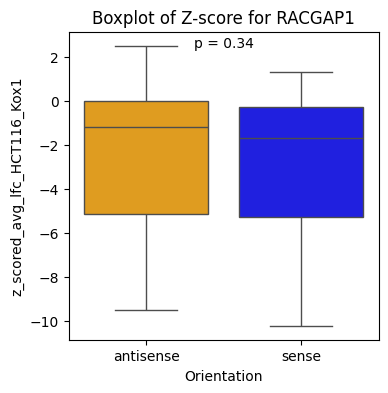

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


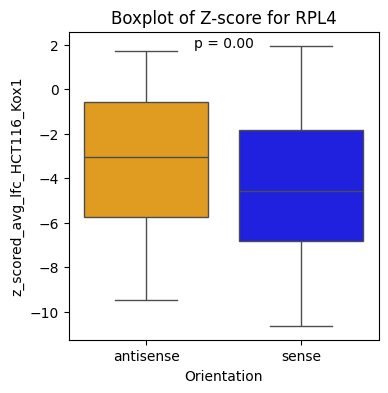

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


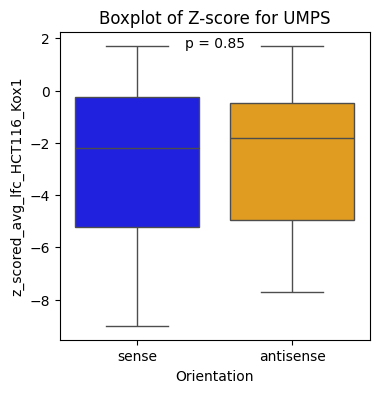

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


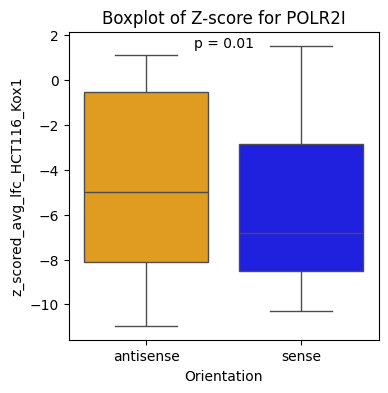

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


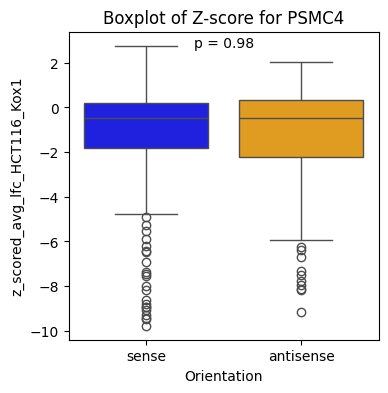

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


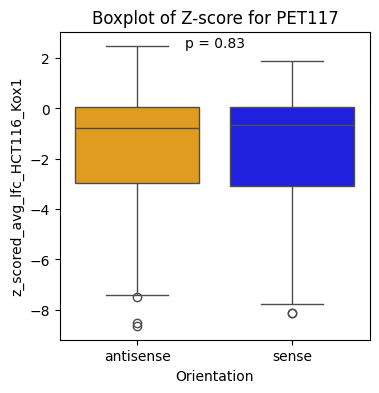

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


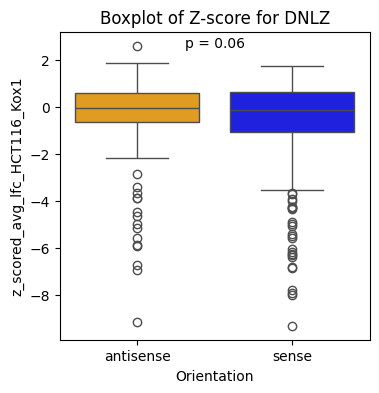

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


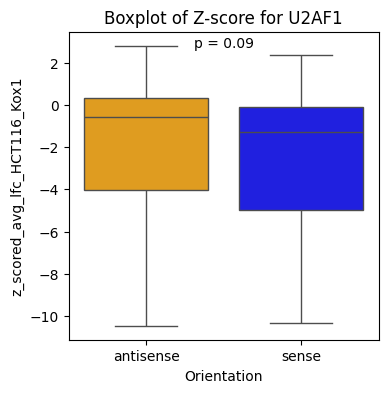

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


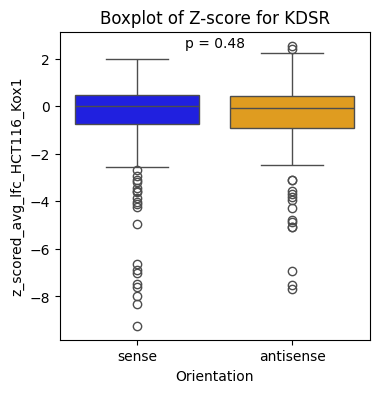

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


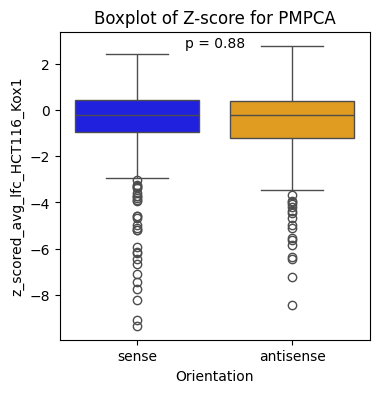

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


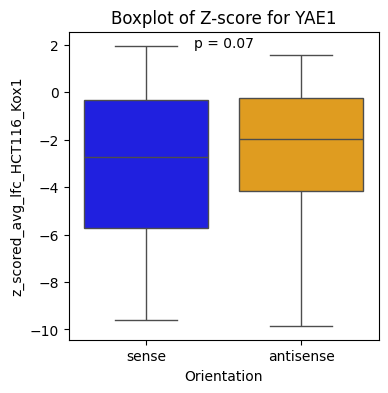

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


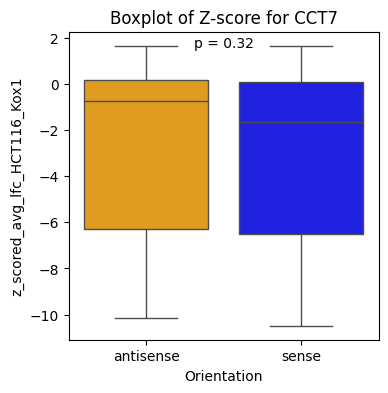

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


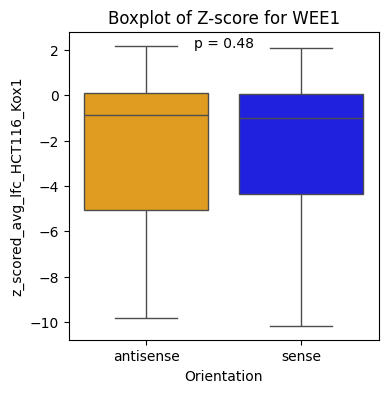

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


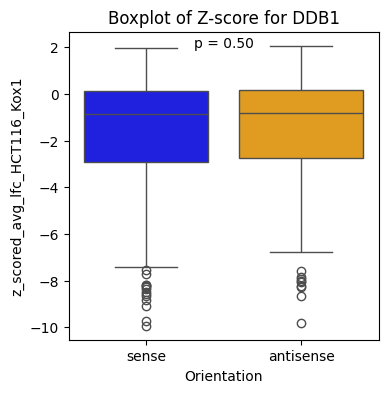

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


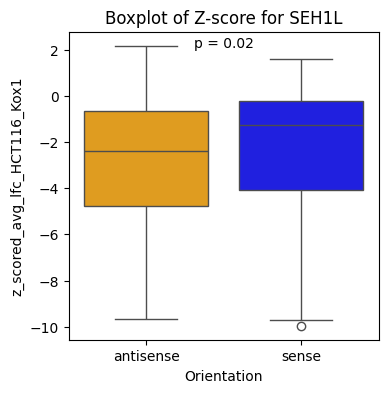

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


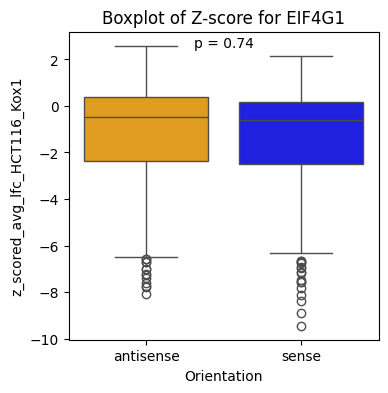

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


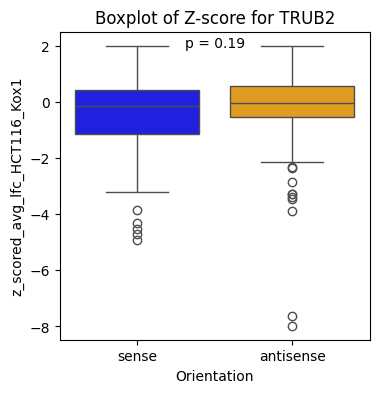

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


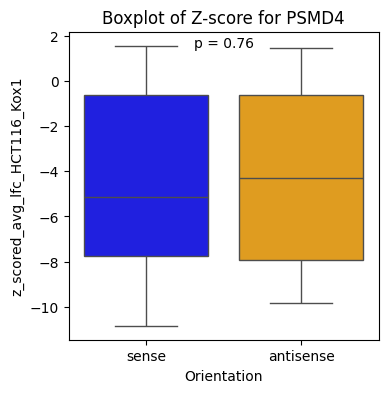

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


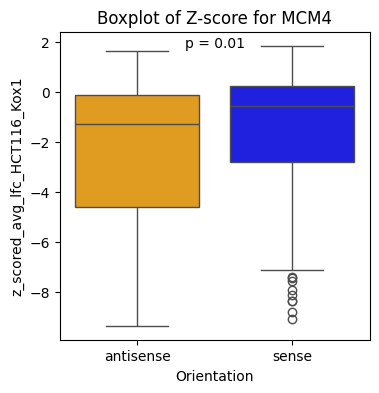

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


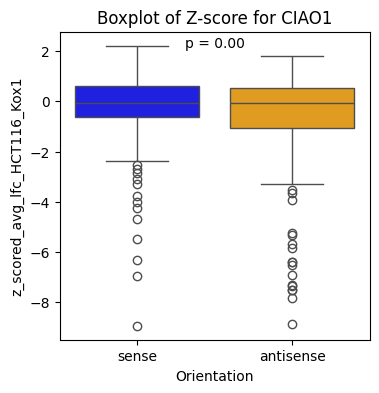

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


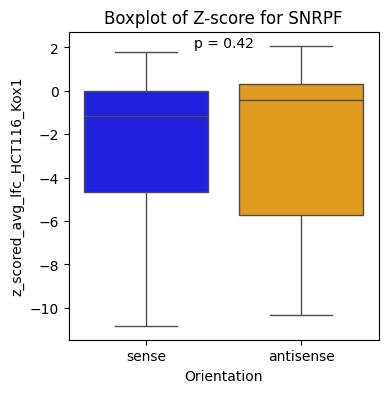

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


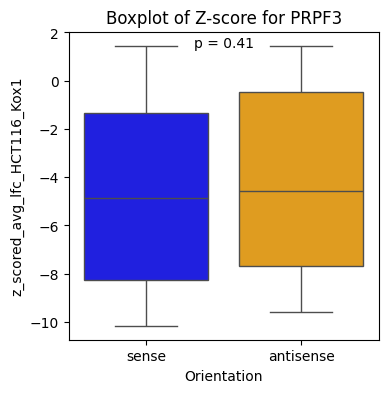

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


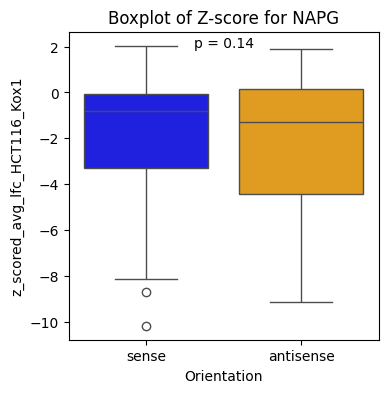

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


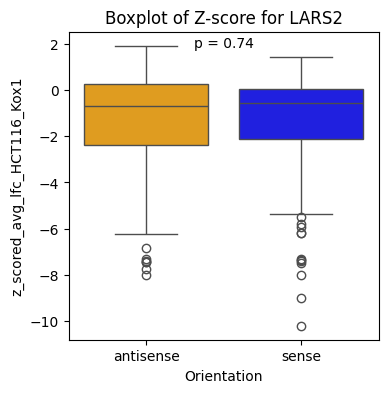

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


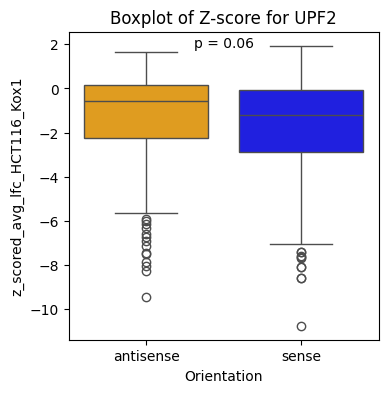

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


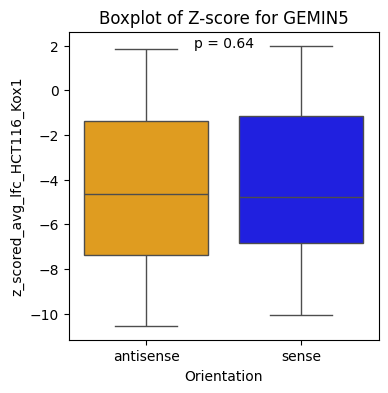

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


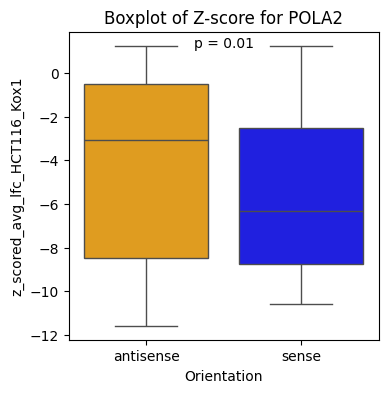

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


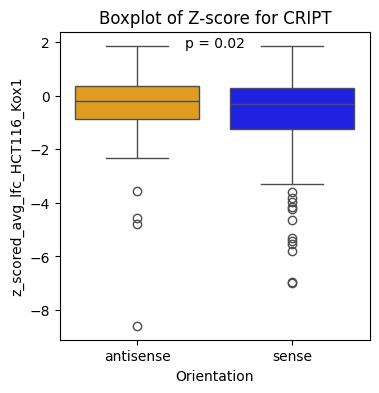

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


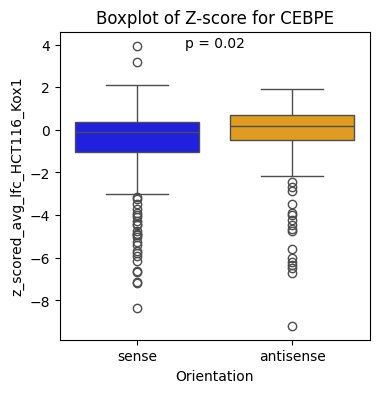

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


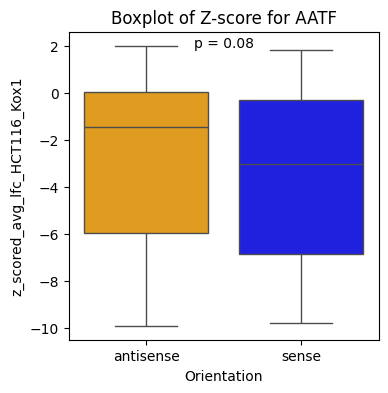

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


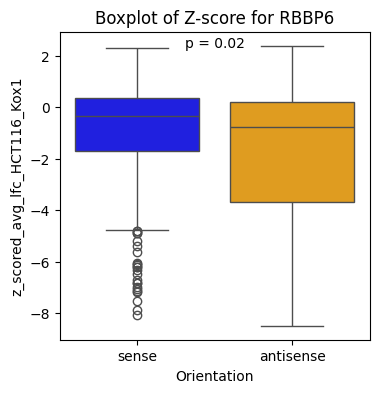

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


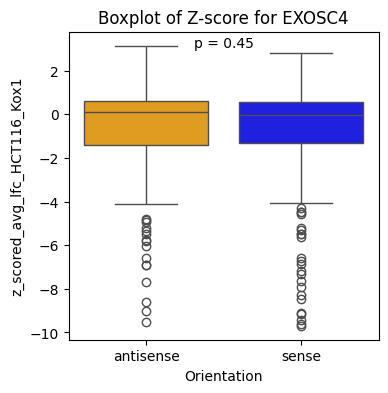

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


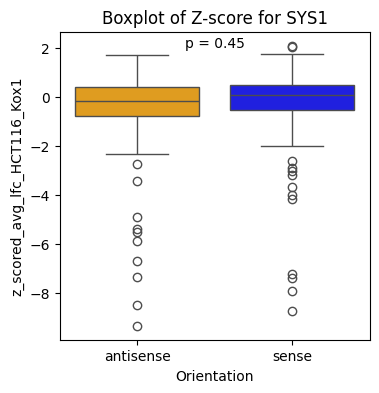

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


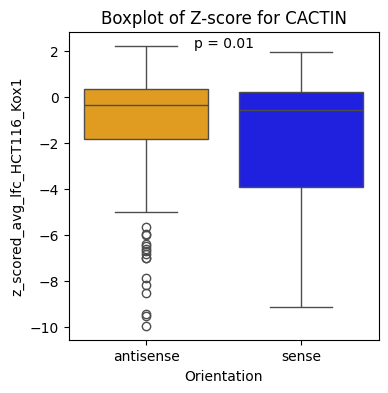

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


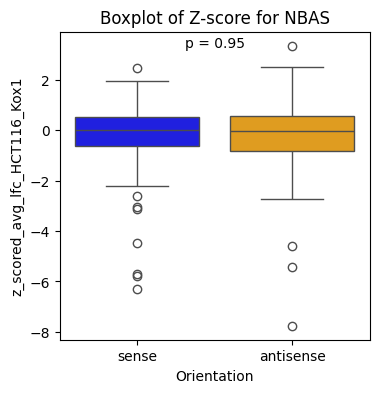

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


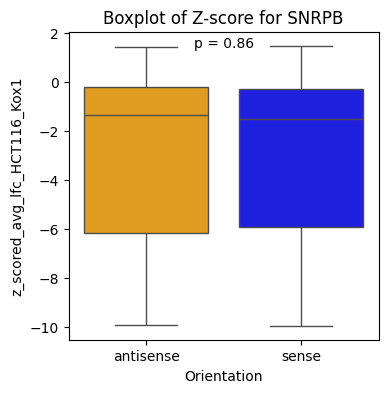

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


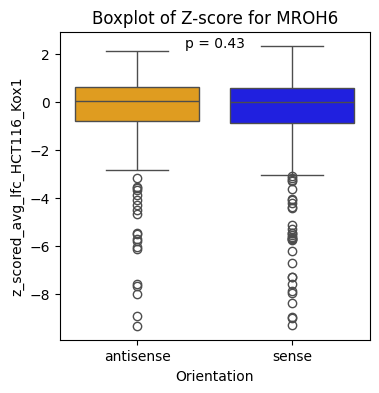

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


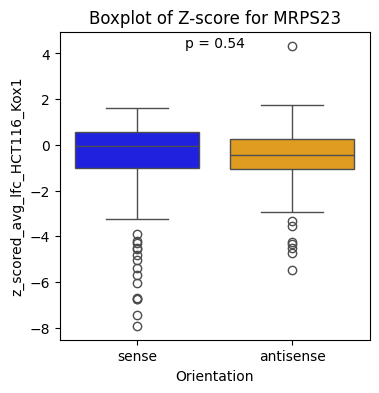

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


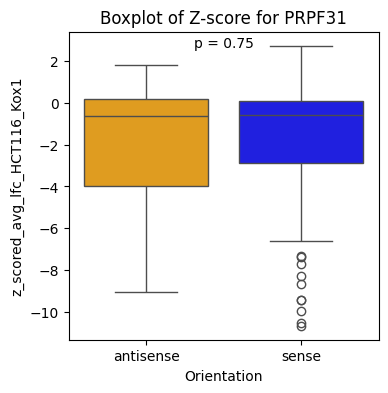

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


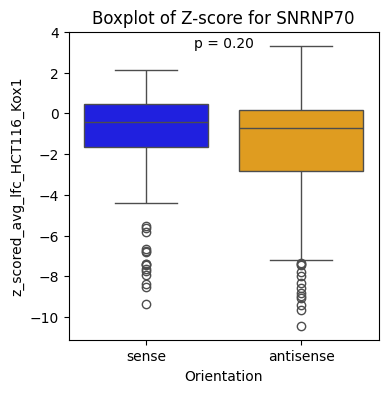

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


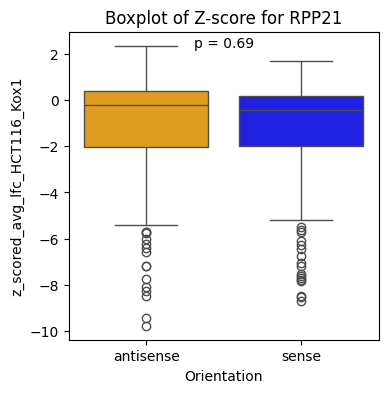

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


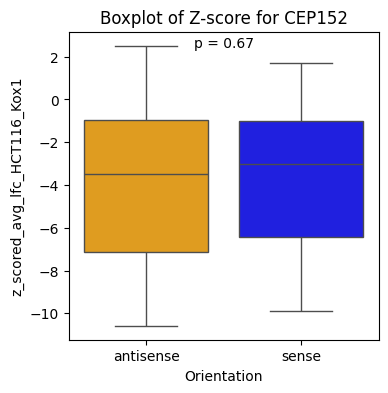

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


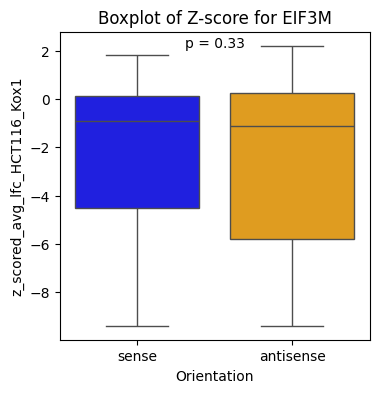

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


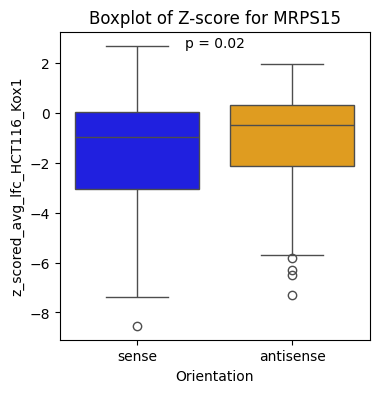

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


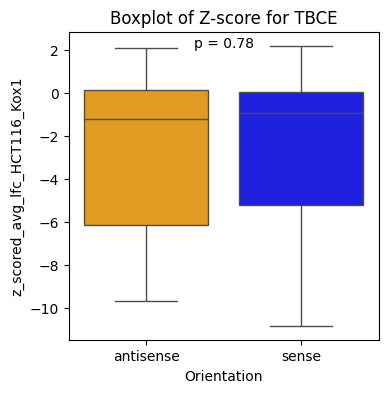

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


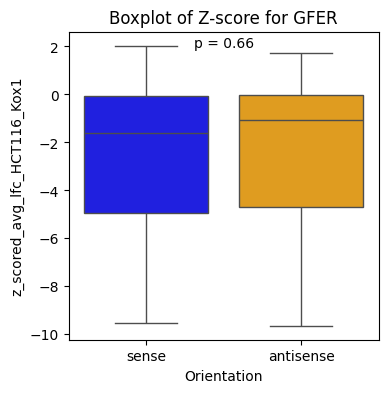

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


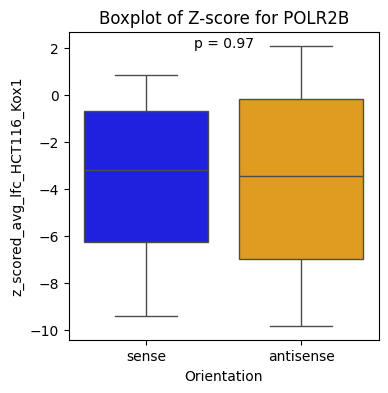

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


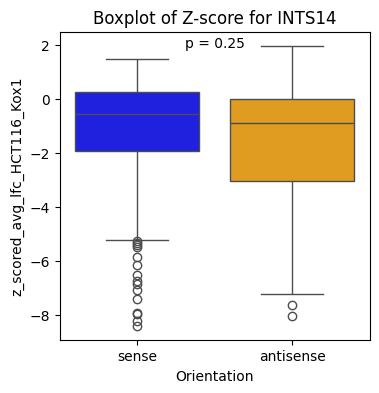

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


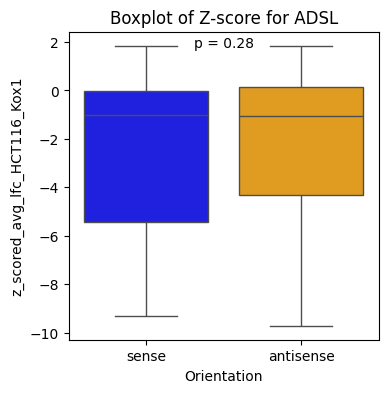

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


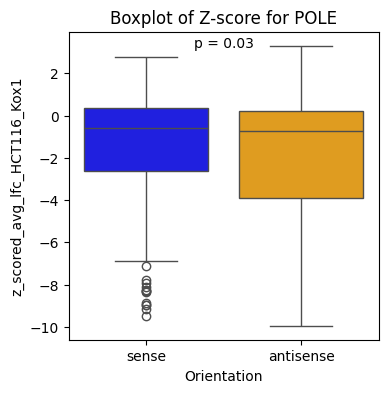

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


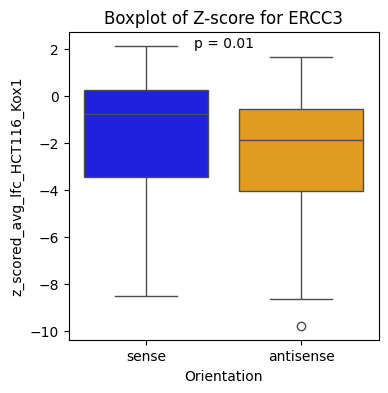

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


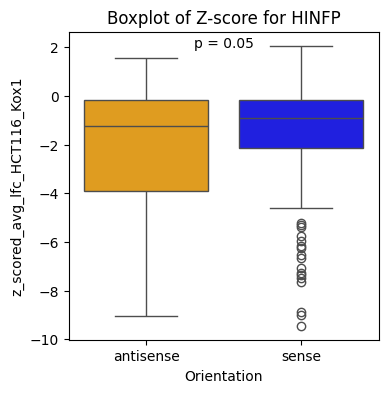

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


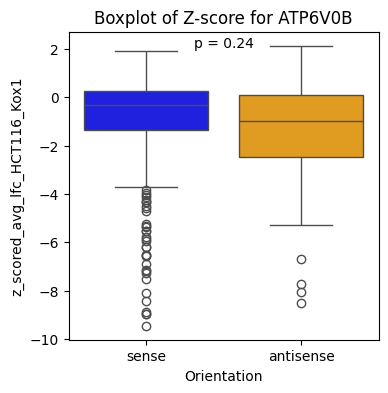

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


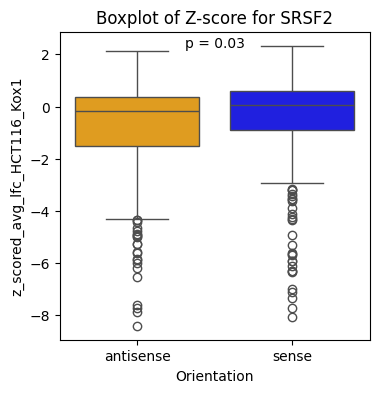

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


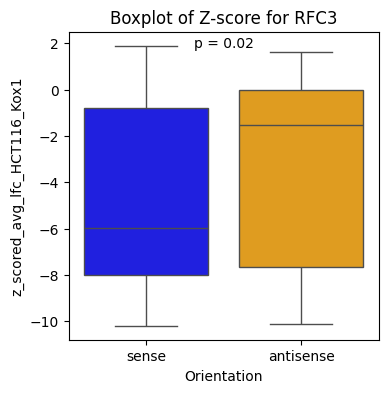

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


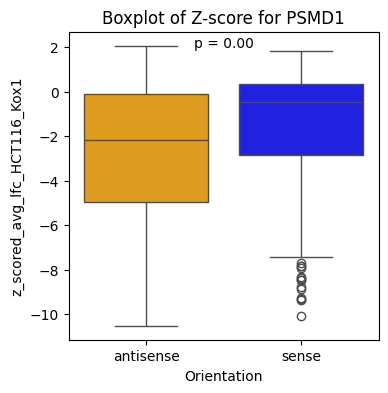

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


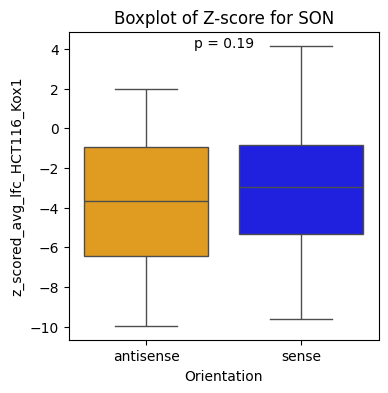

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


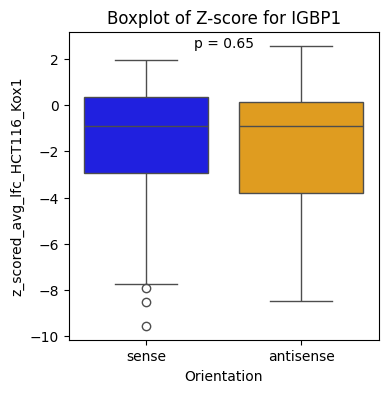

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


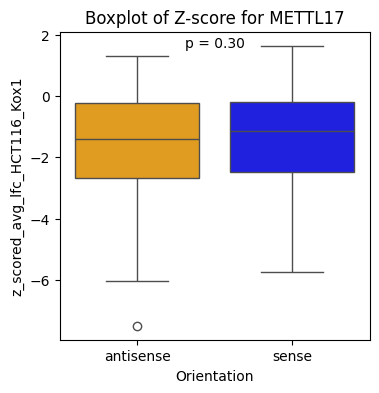

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


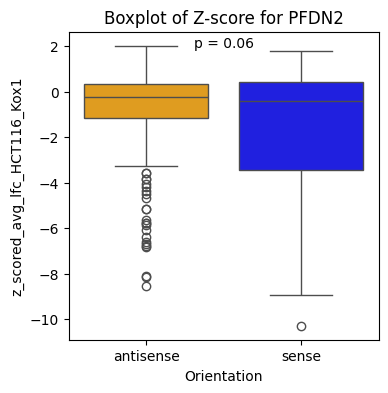

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


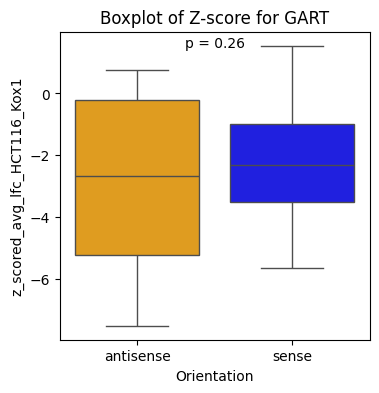

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


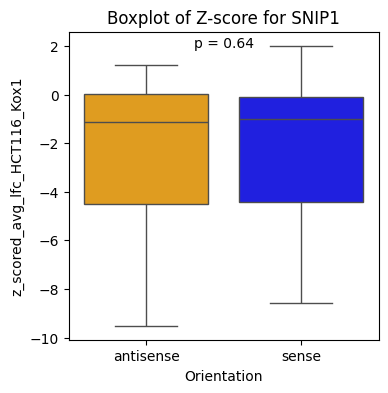

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


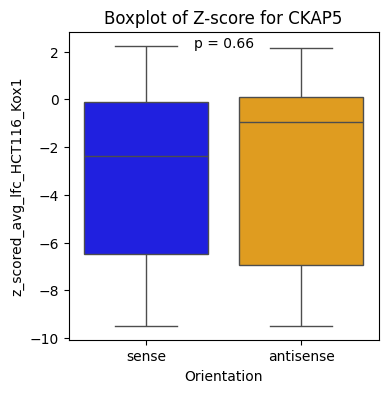

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


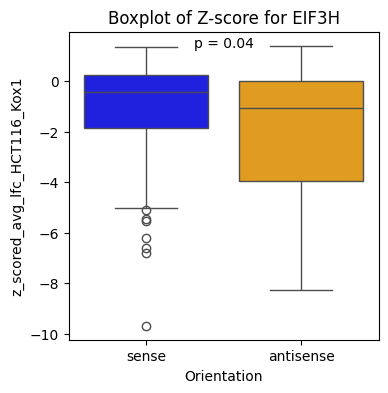

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


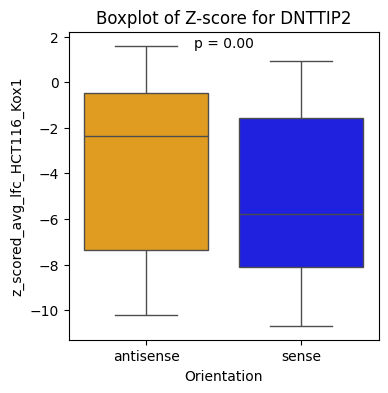

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


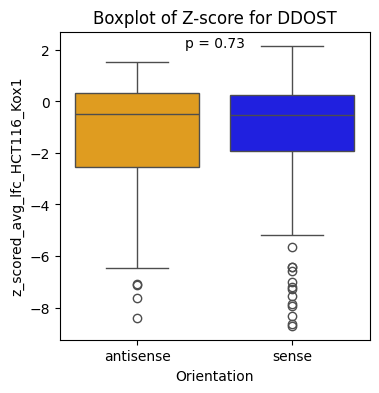

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


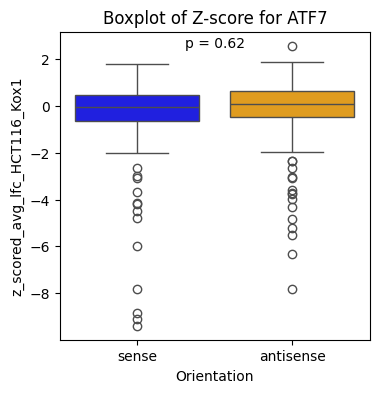

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


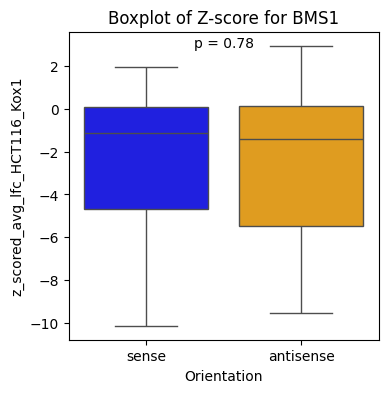

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


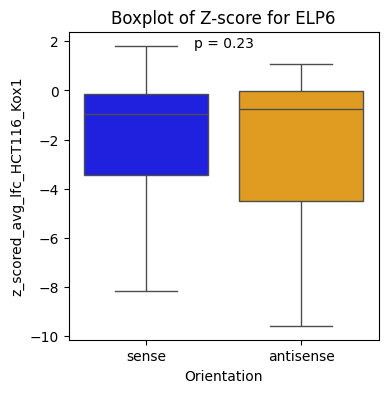

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


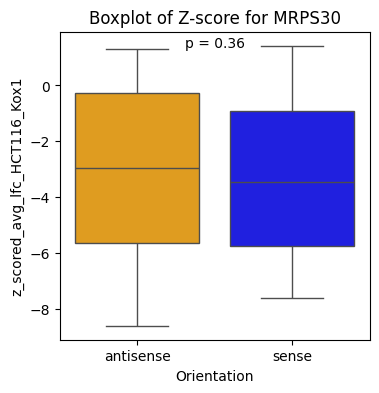

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


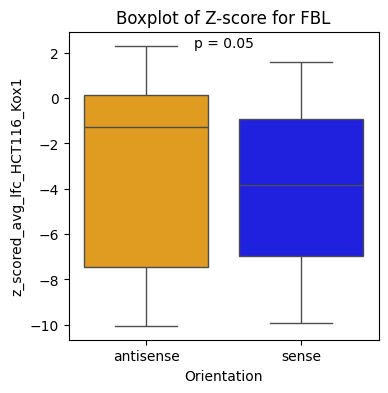

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


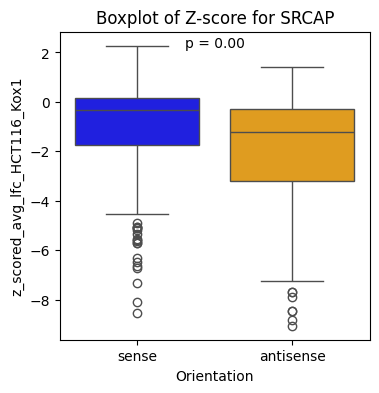

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


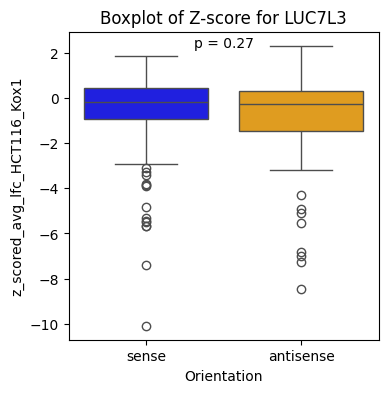

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


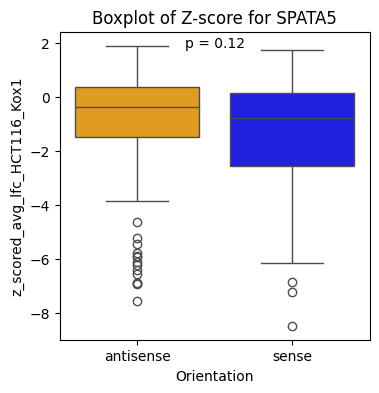

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


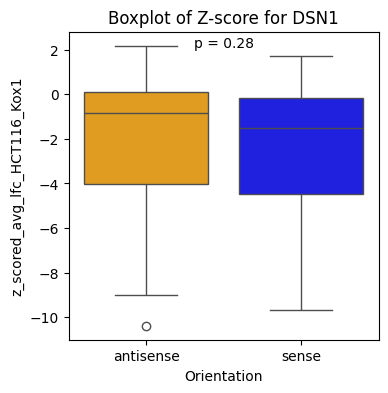

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


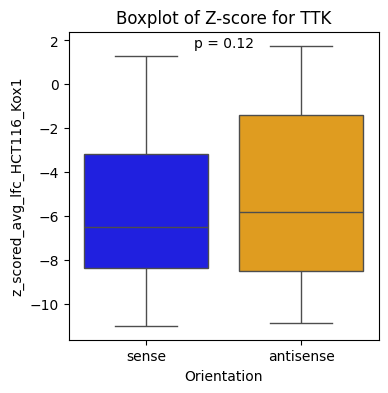

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


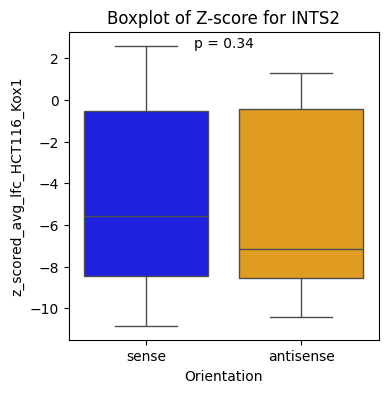

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


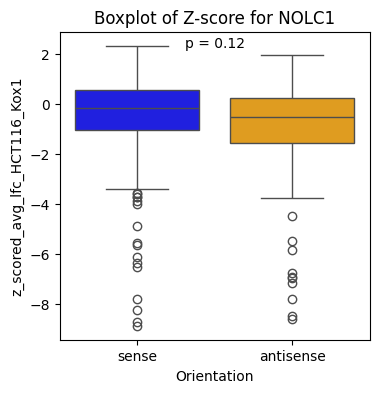

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


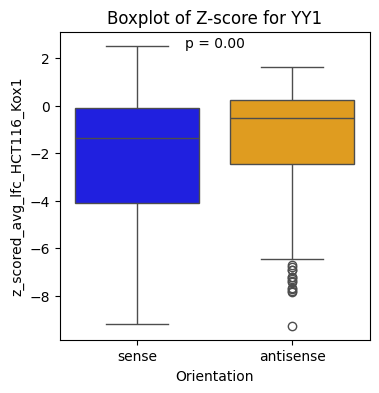

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


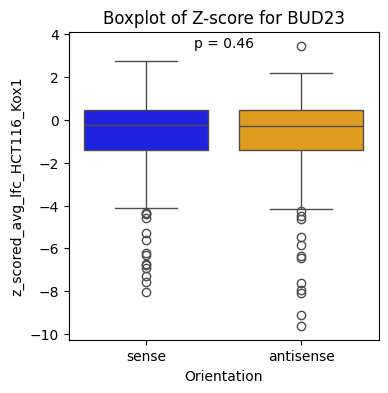

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


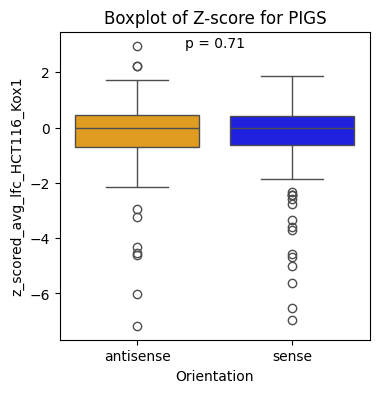

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


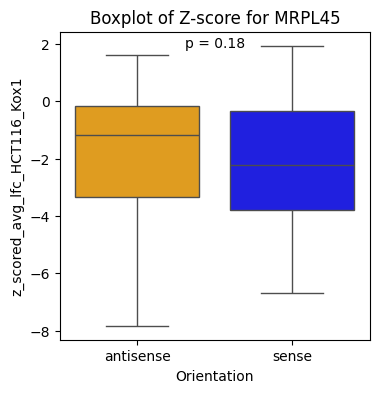

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


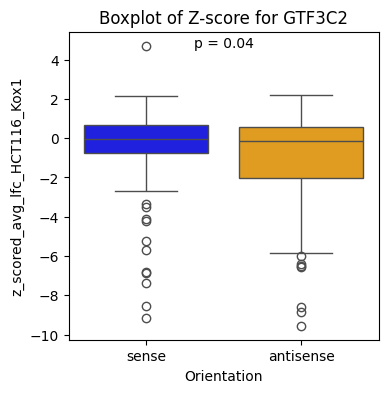

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


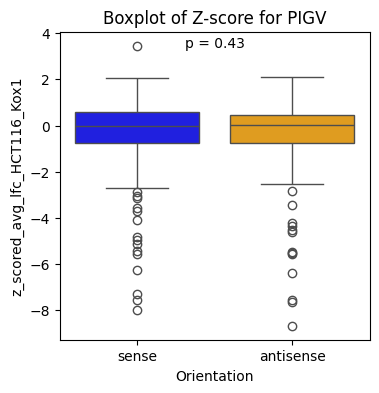

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


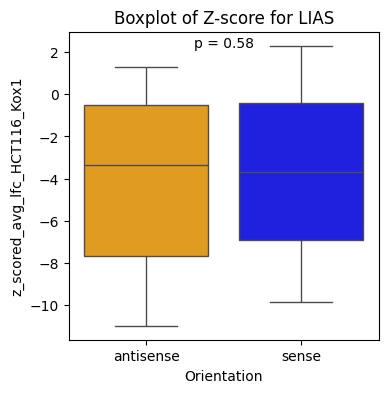

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


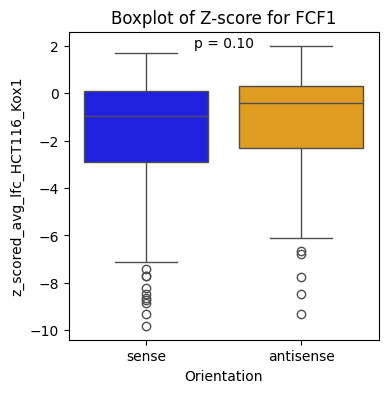

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


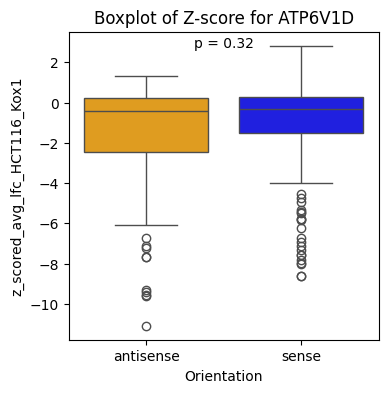

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


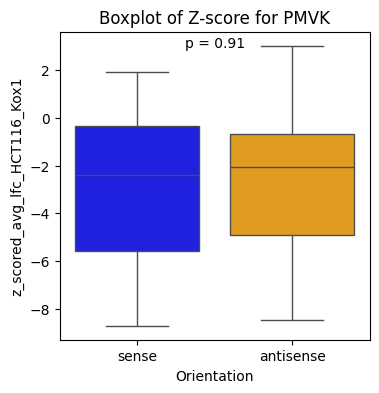

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


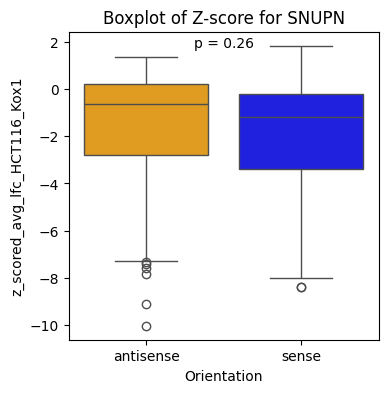

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


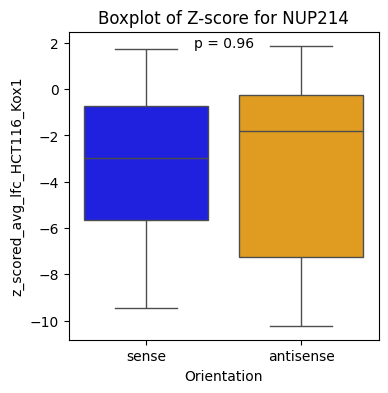

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


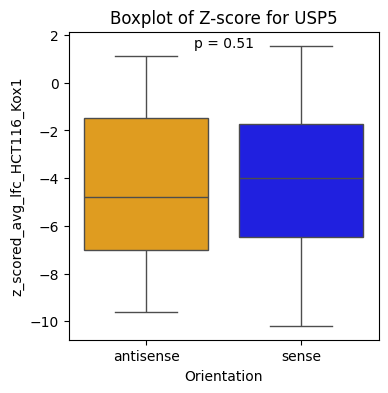

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


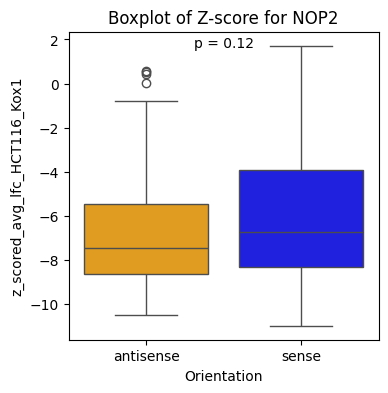

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


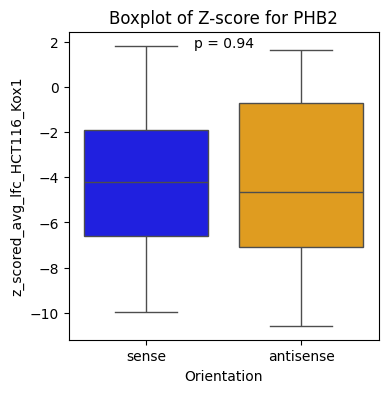

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


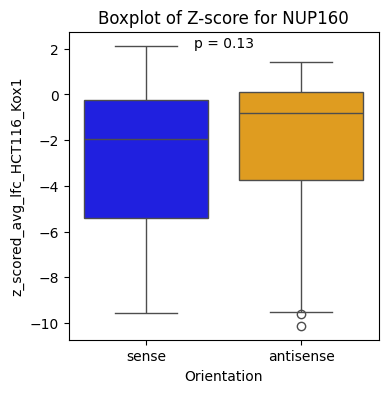

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


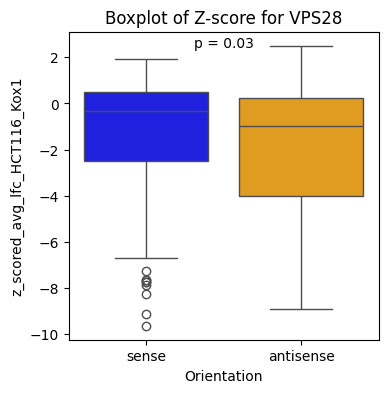

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


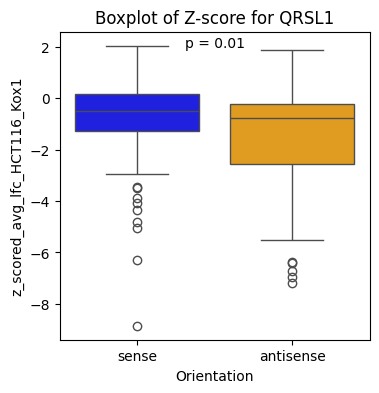

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


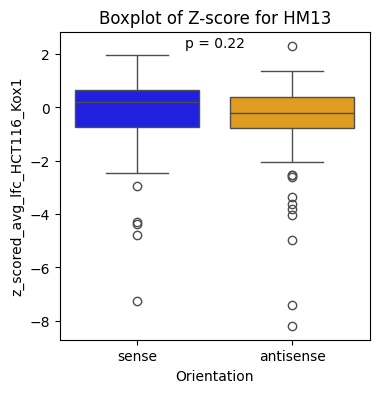

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


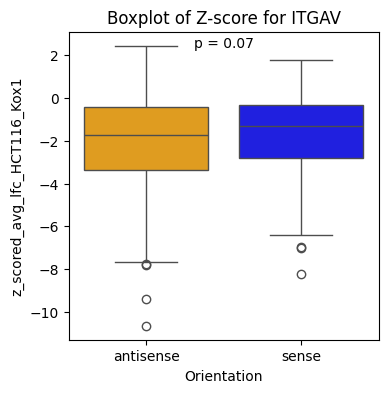

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


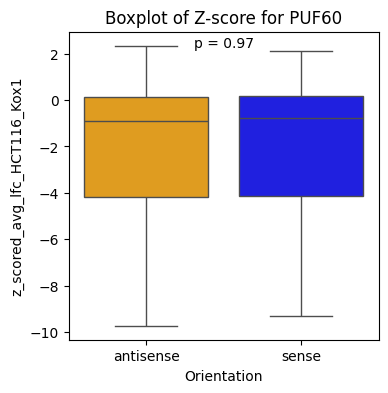

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


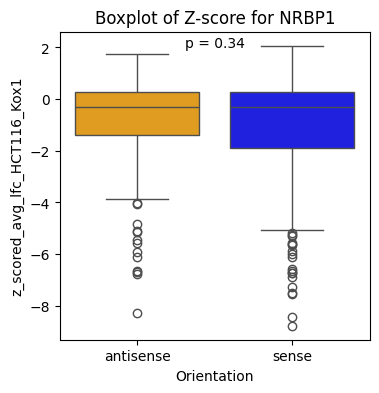

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


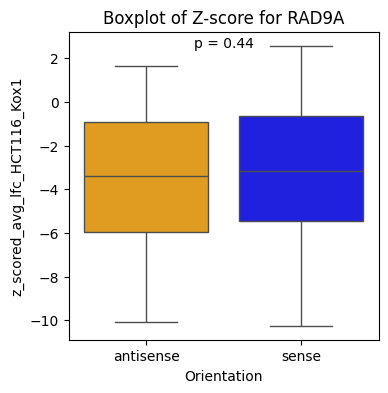

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


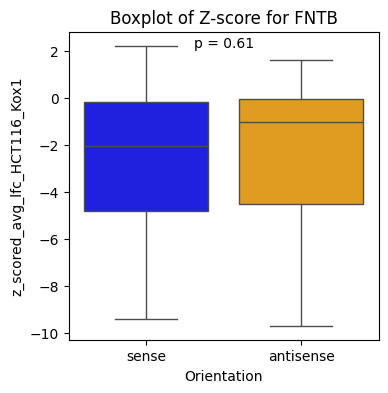

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


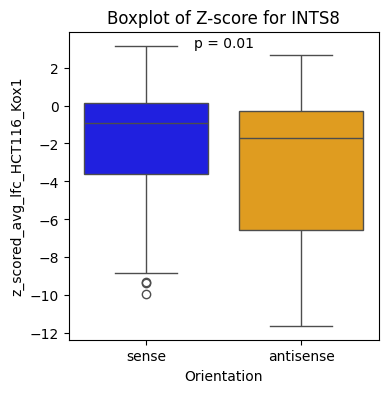

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


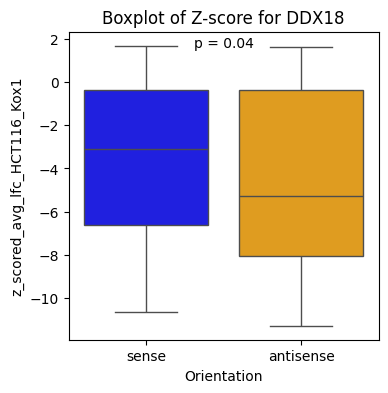

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


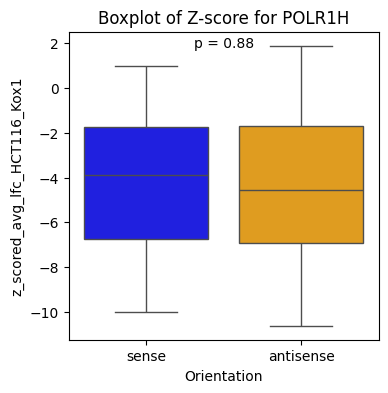

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


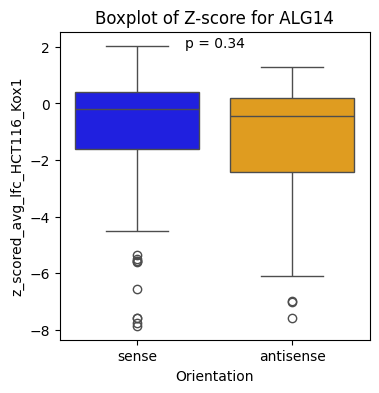

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


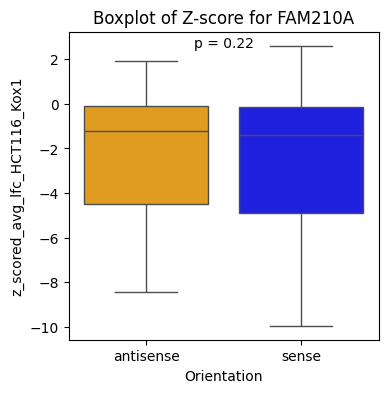

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


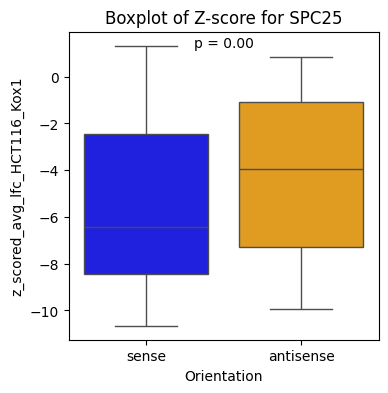

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


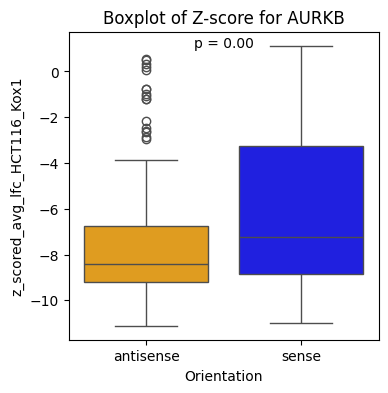

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


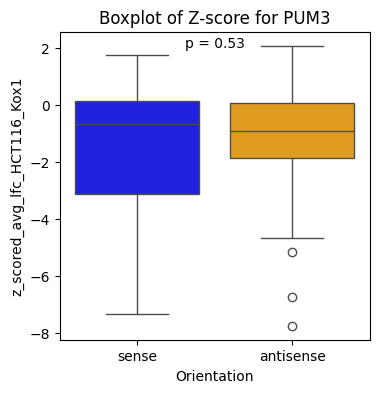

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


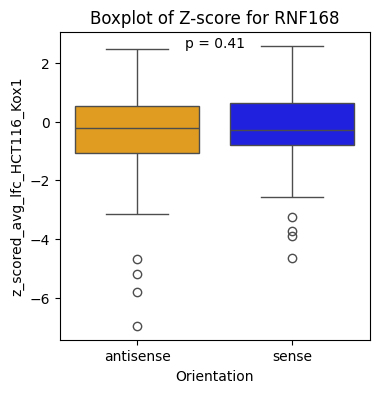

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


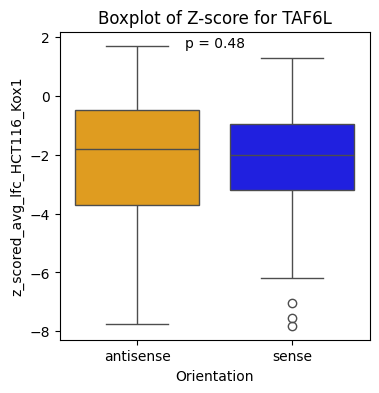

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


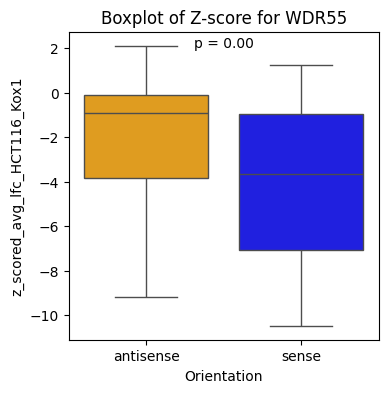

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


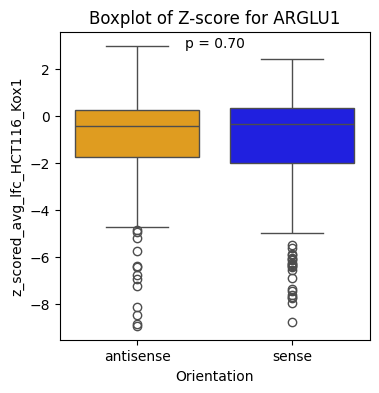

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


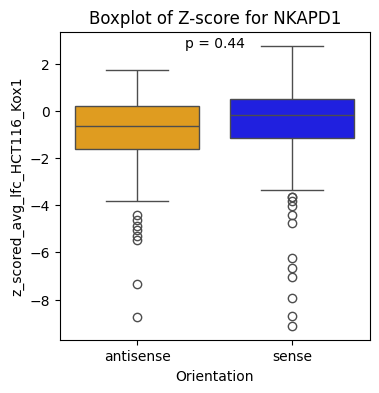

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


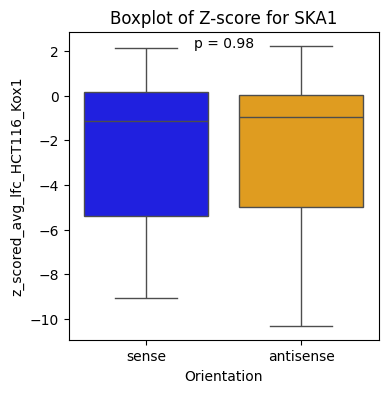

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


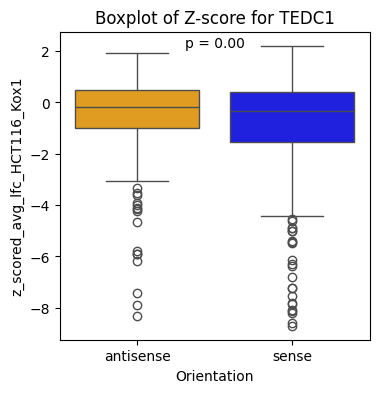

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


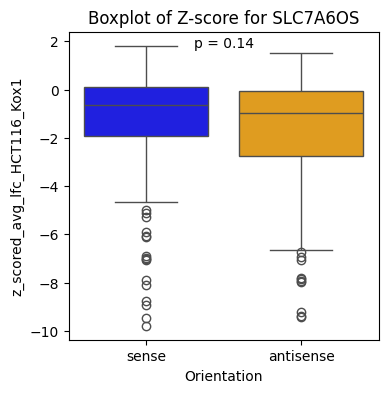

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


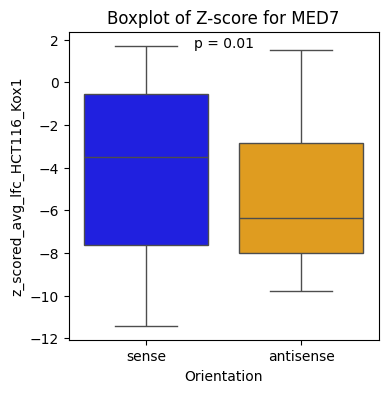

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


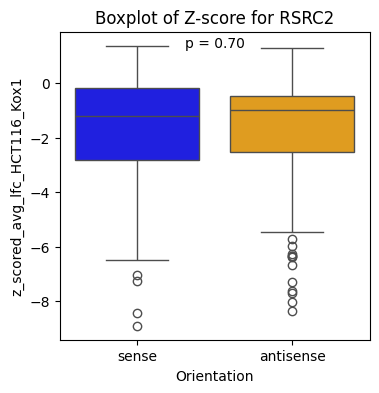

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


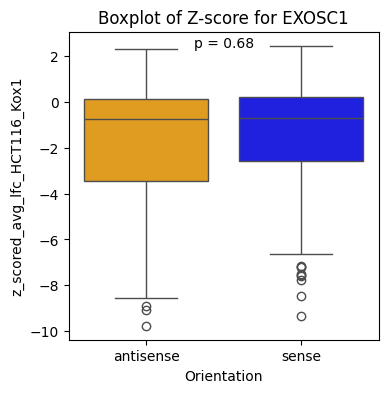

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


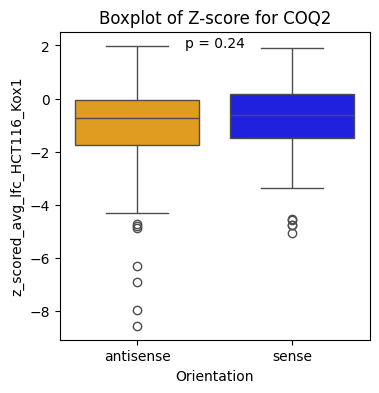

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


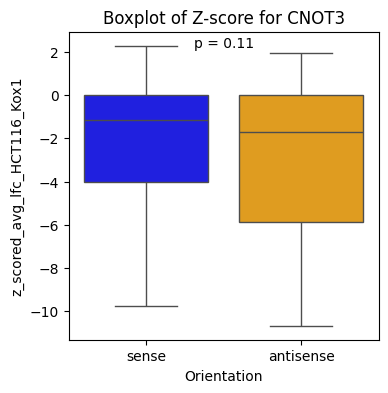

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


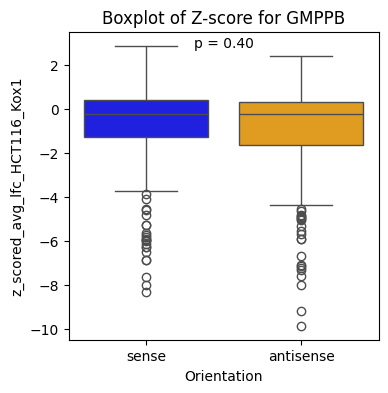

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


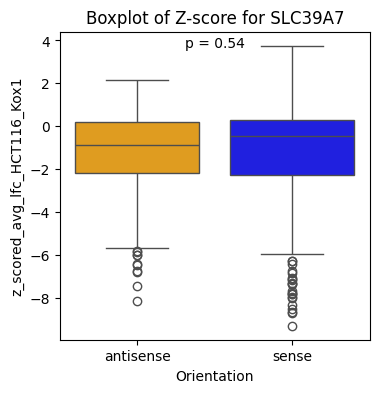

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


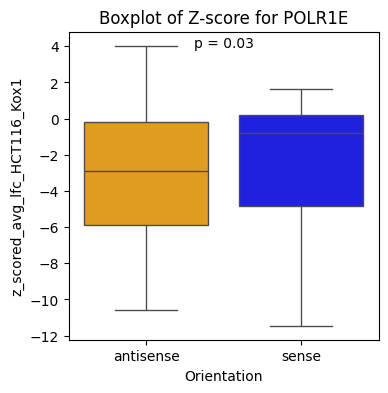

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


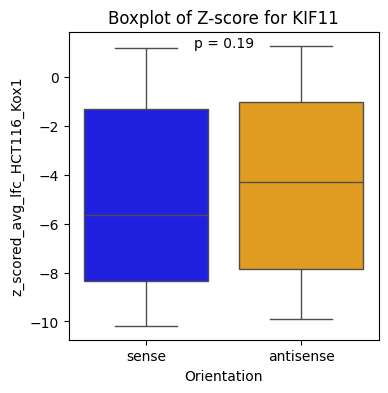

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


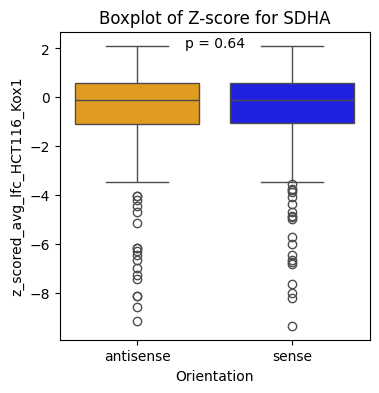

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


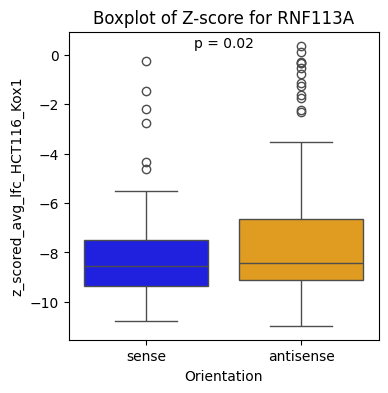

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


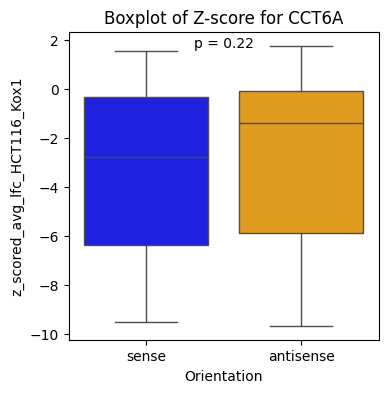

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


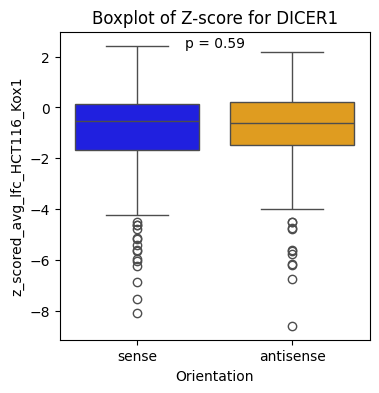

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


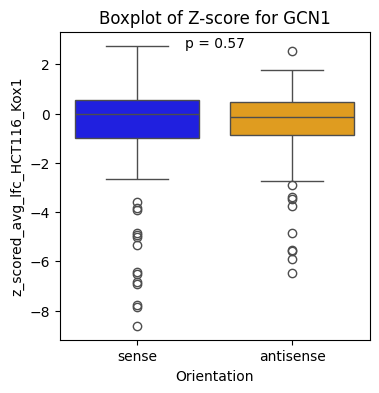

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


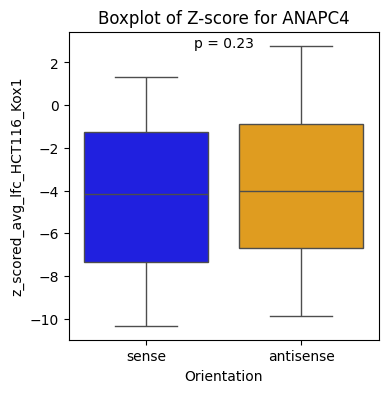

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


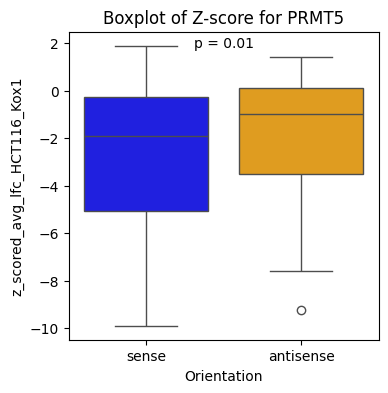

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


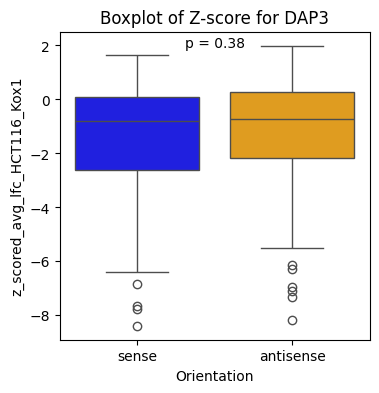

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


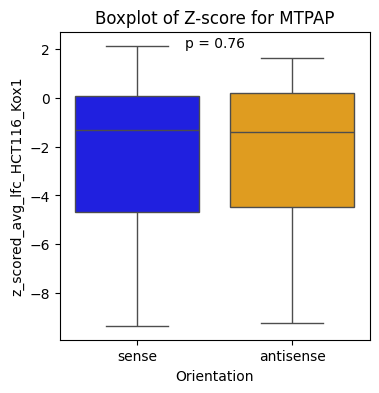

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


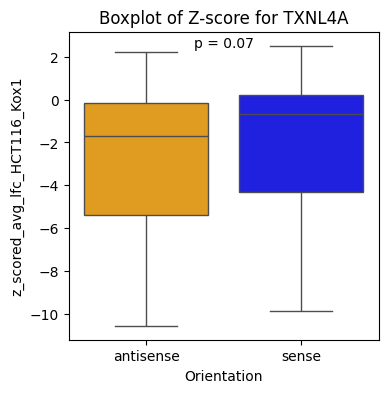

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


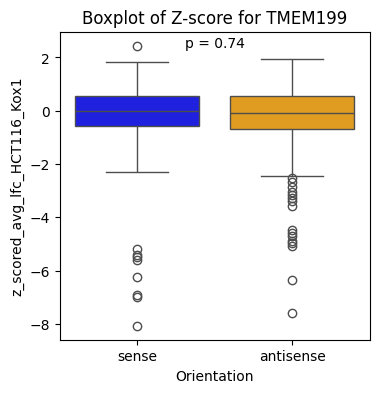

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


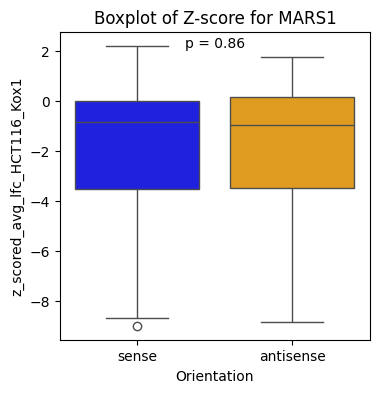

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


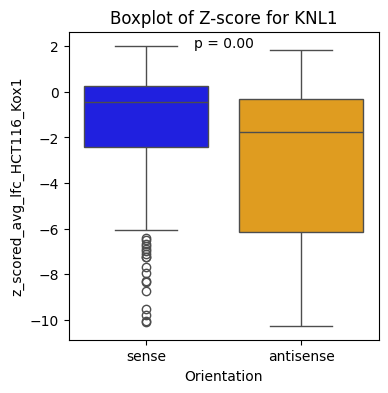

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


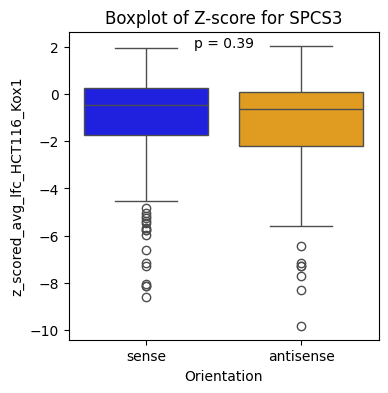

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


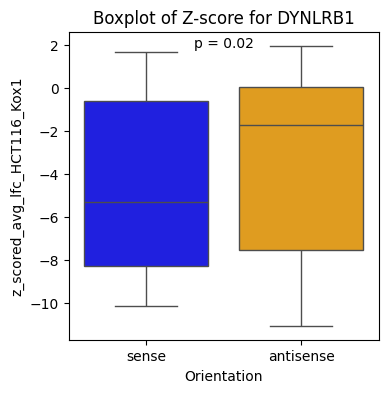

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


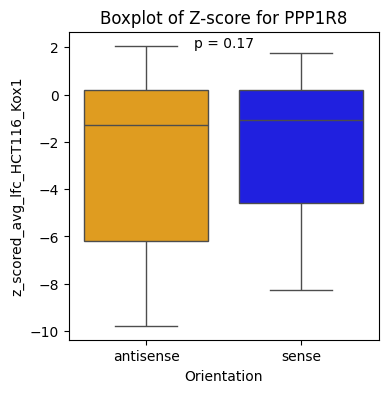

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


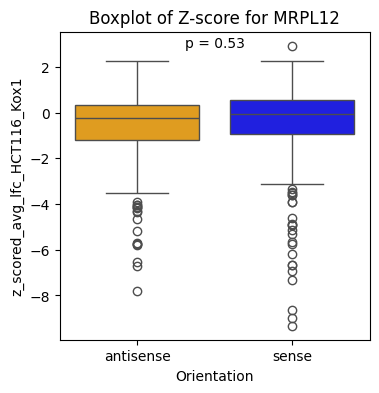

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


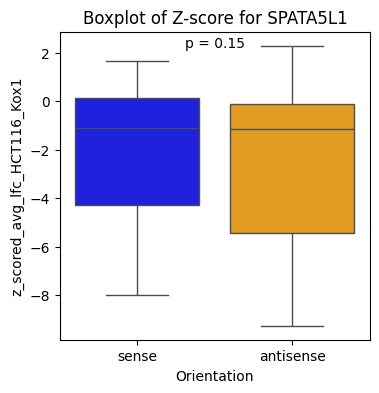

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


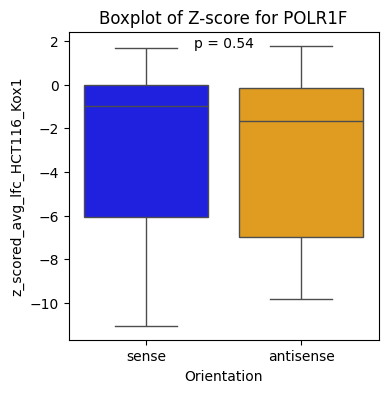

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


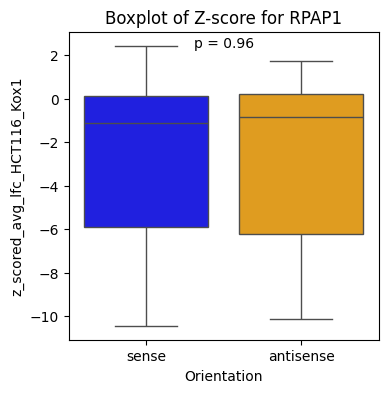

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


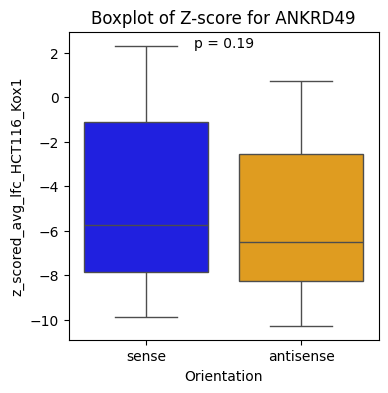

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


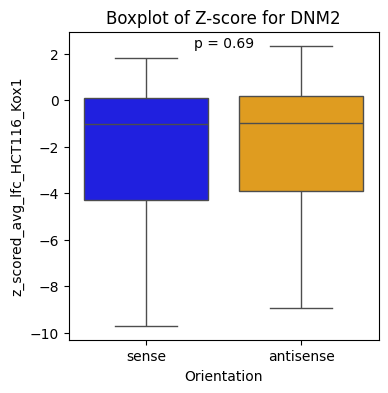

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


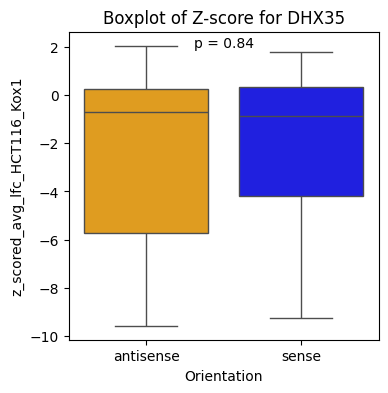

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


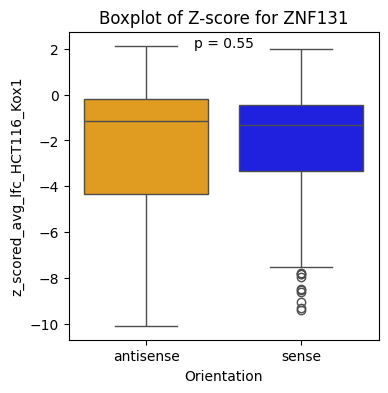

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


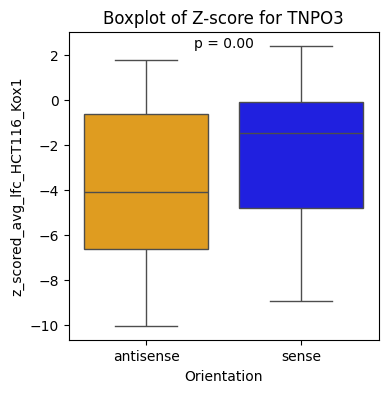

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


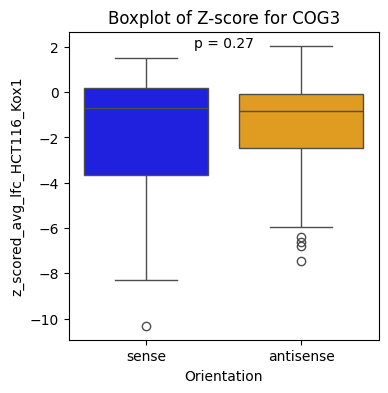

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


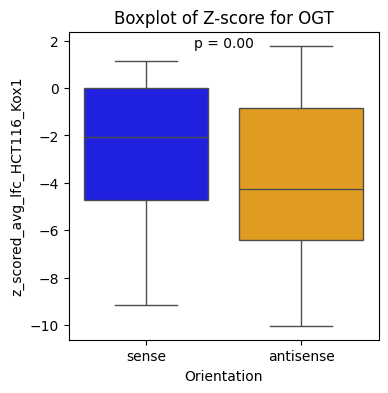

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


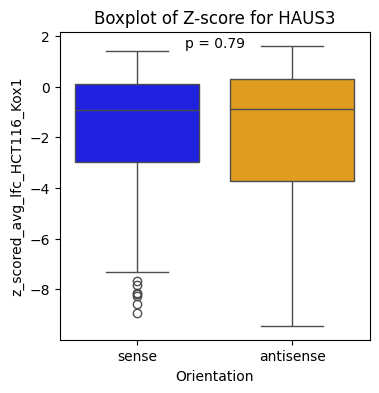

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


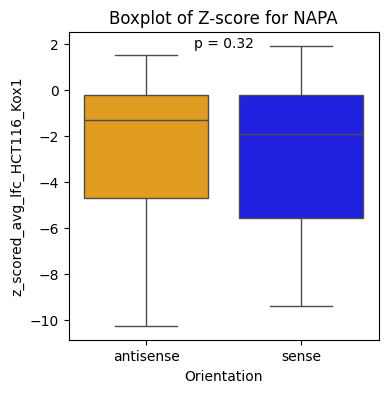

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


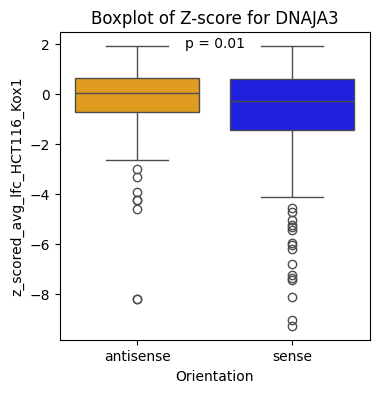

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


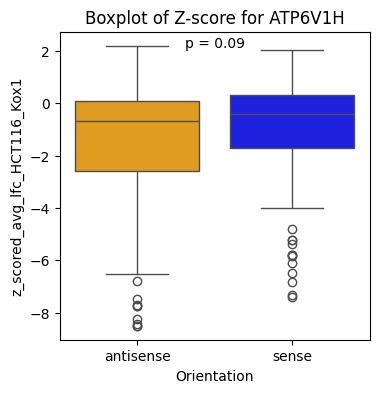

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


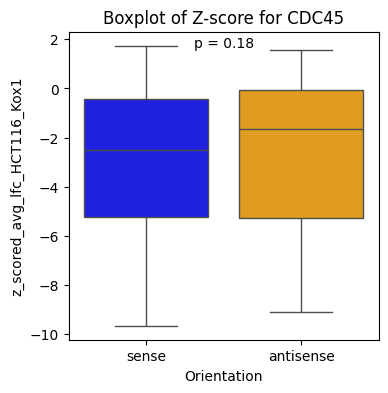

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


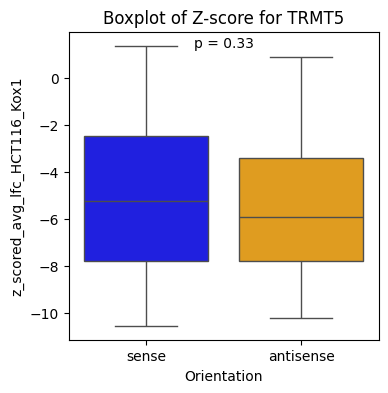

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


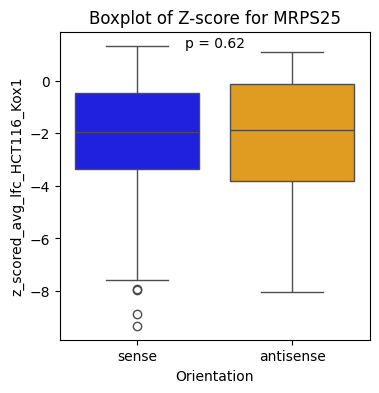

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


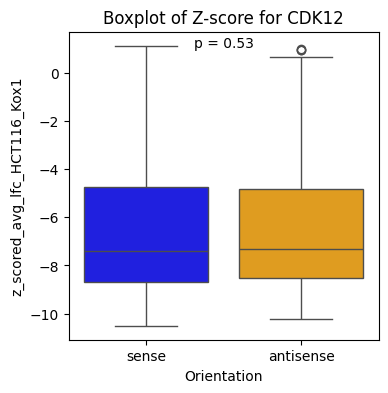

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


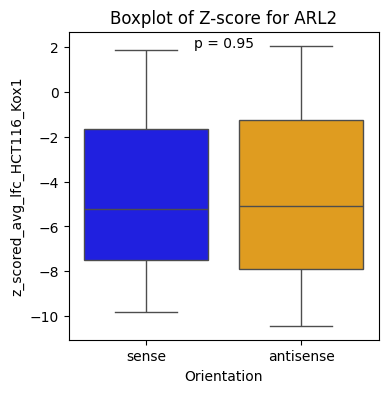

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


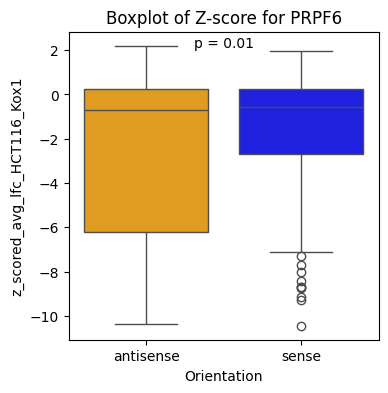

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


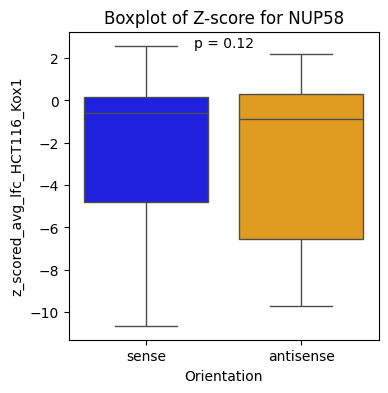

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


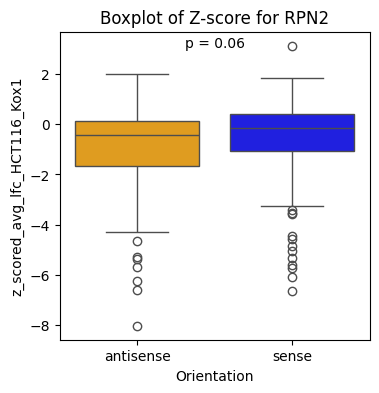

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


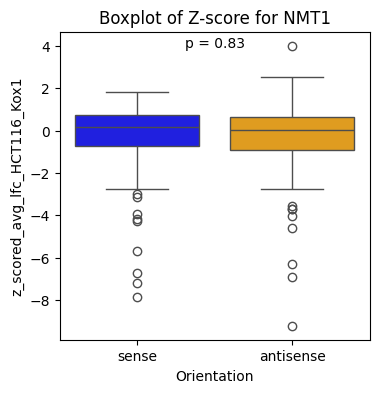

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


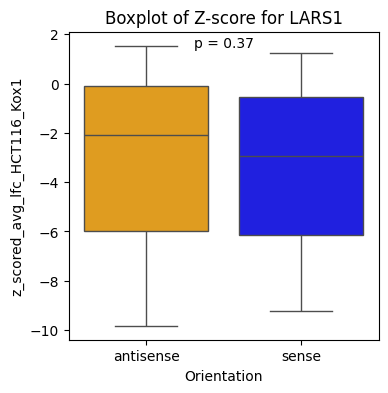

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


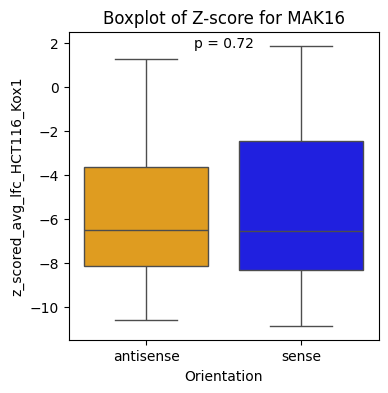

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


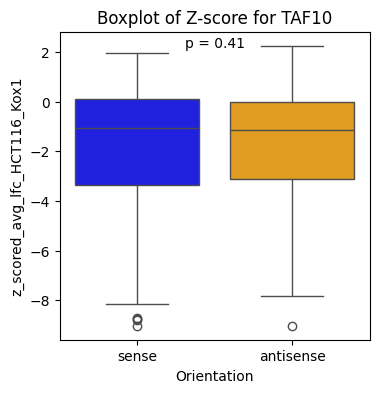

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


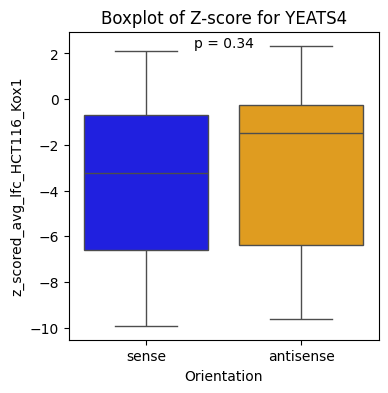

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


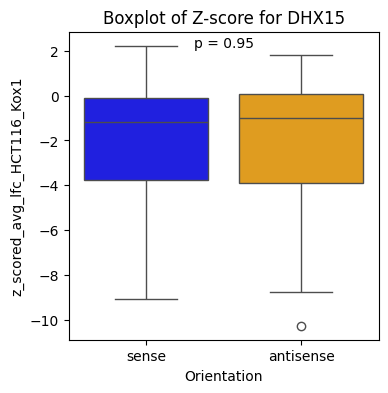

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


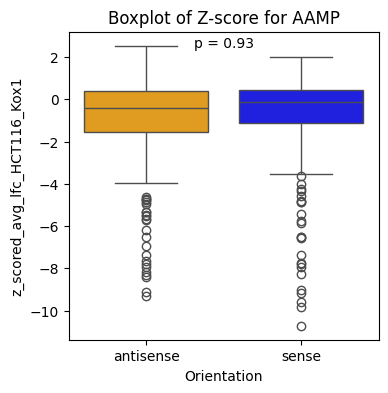

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


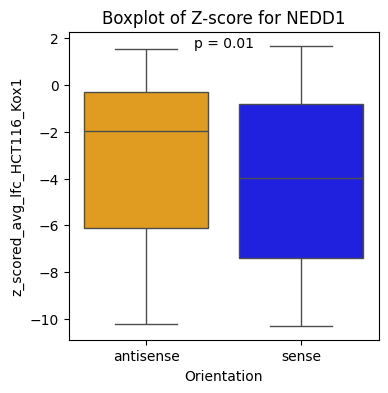

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


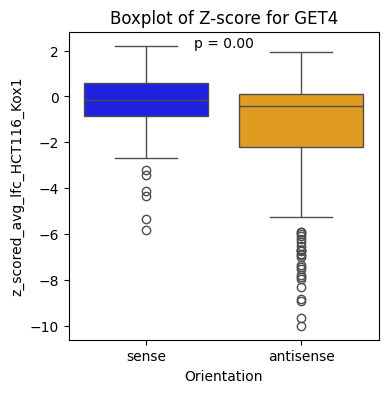

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


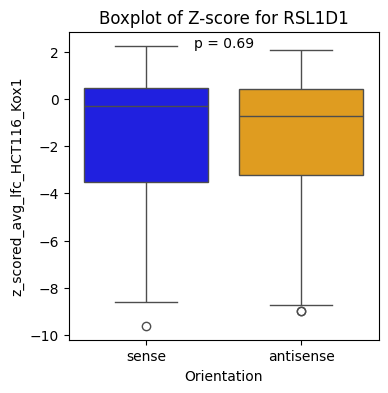

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


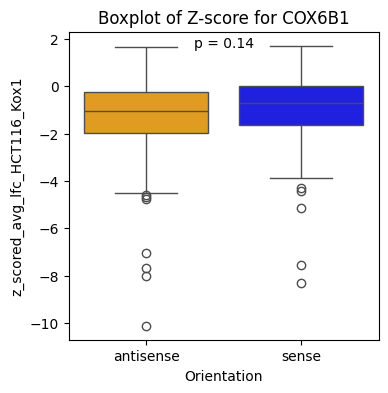

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


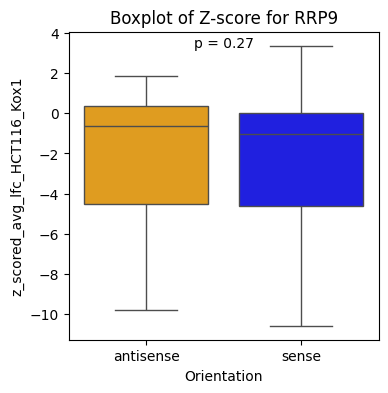

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


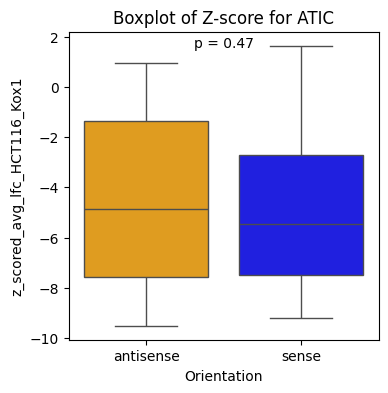

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


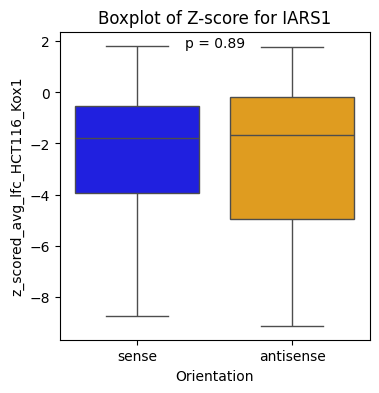

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


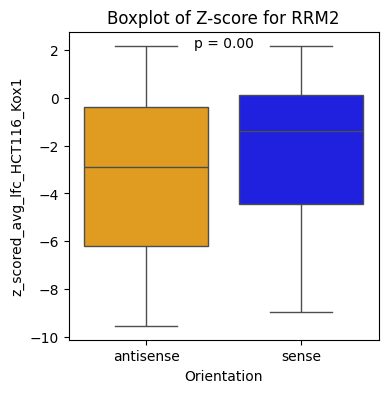

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


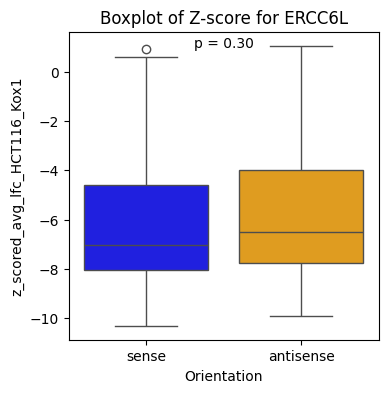

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


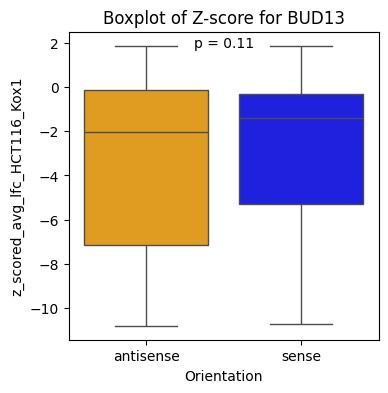

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


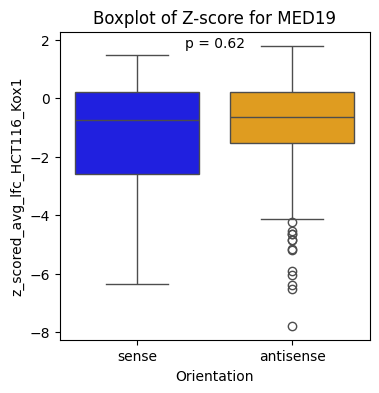

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


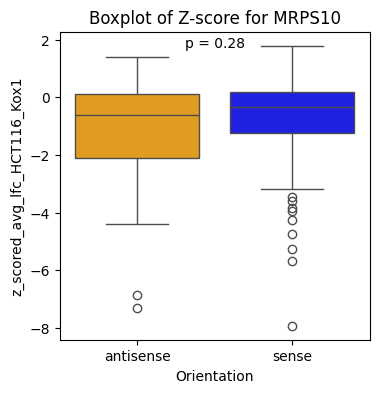

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


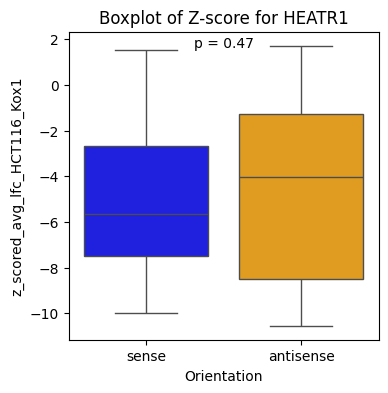

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


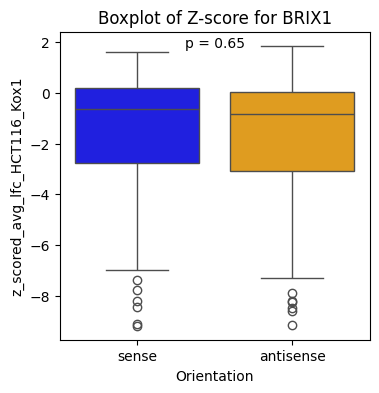

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


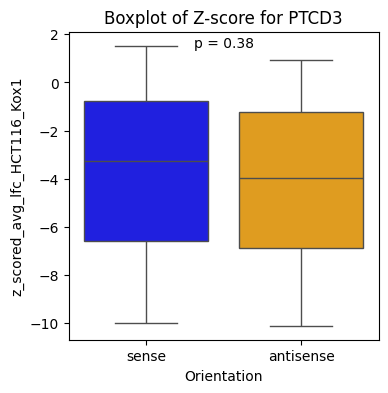

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


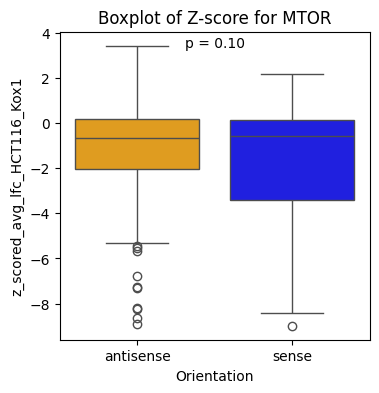

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


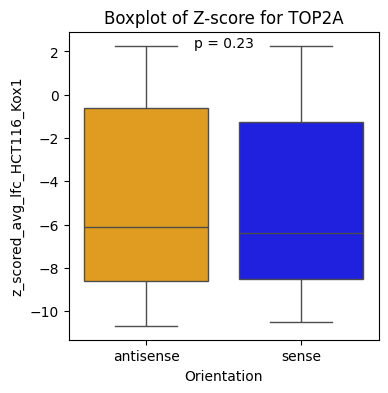

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


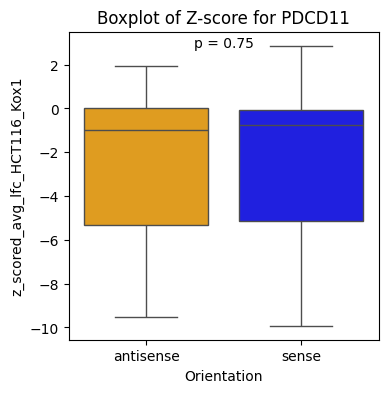

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


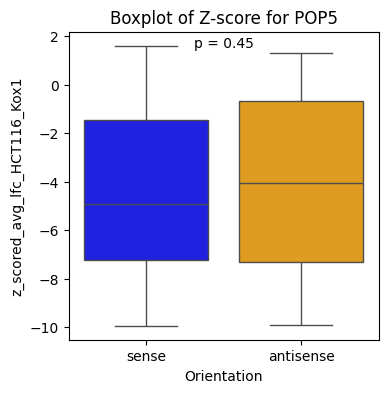

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


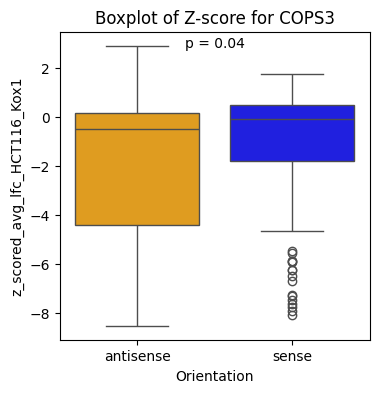

In [11]:
pvalue_HCT116_Kox1 = orientation_comparison(ess_merged_df_guide_orientation,'z_scored_avg_lfc_HCT116_Kox1')


/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


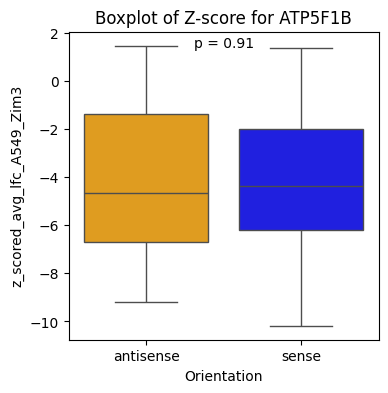

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


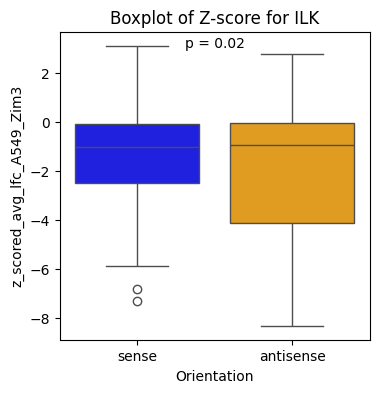

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


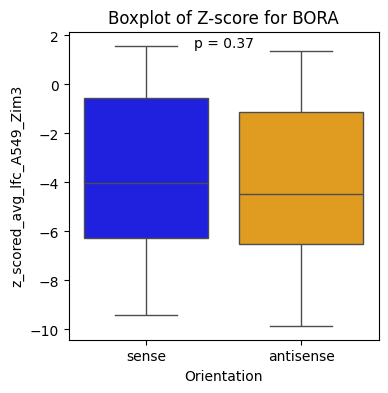

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


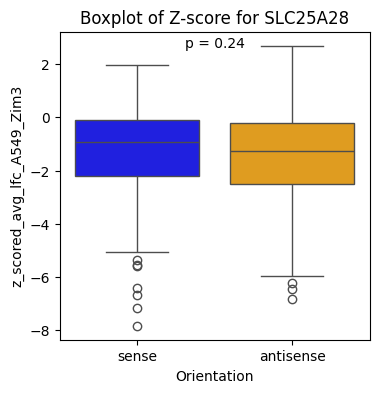

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


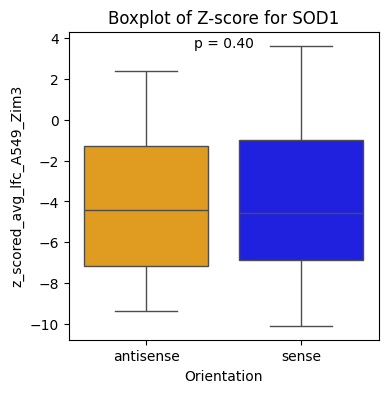

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


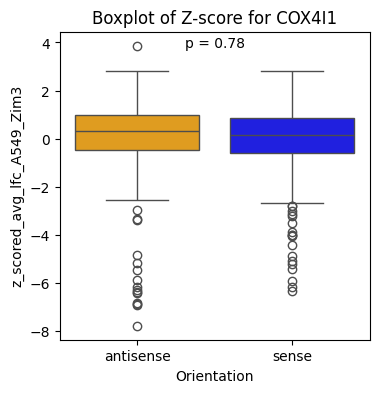

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


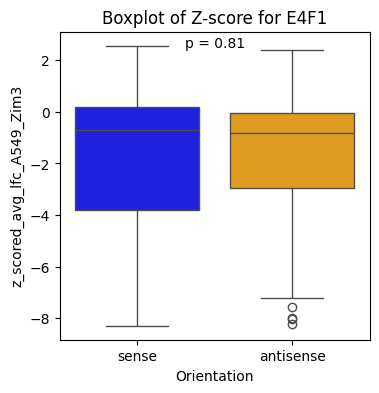

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


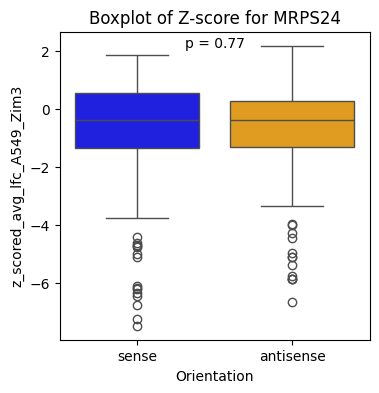

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


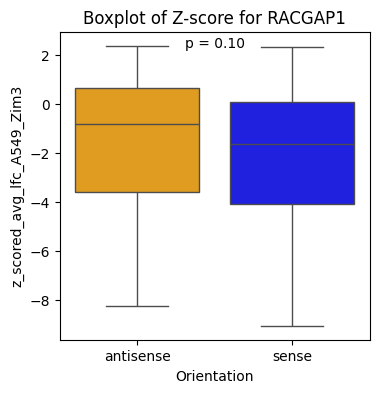

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


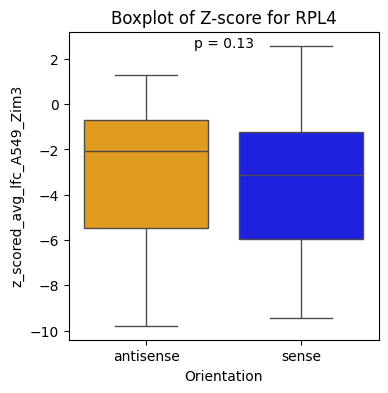

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


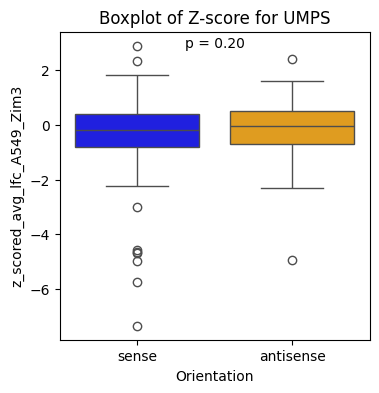

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


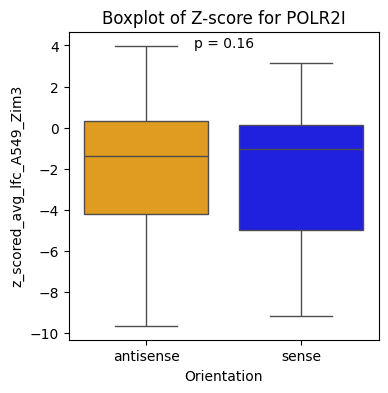

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


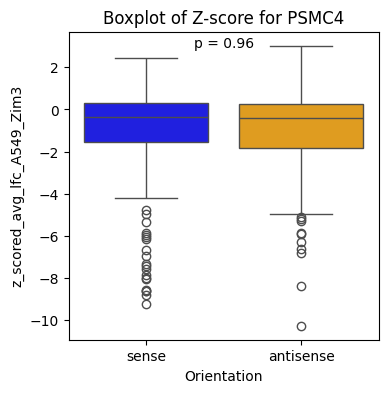

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


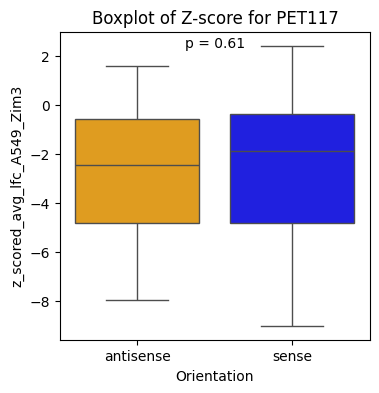

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


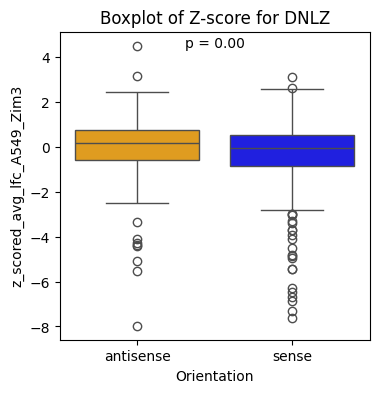

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


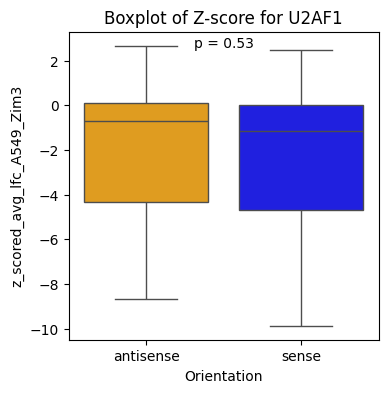

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


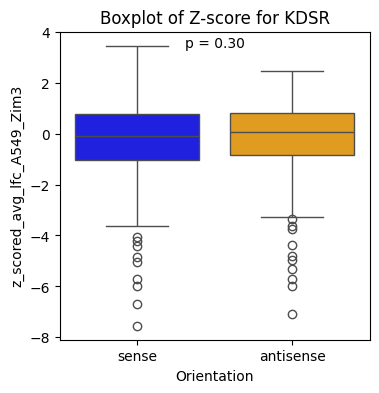

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


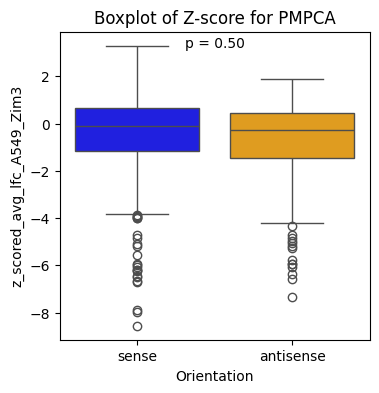

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


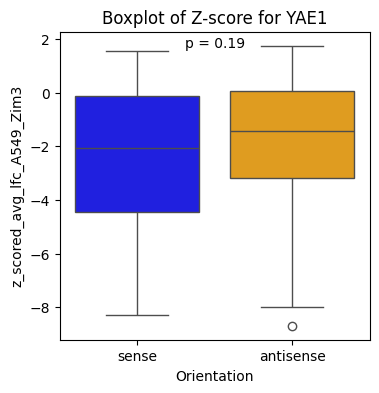

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


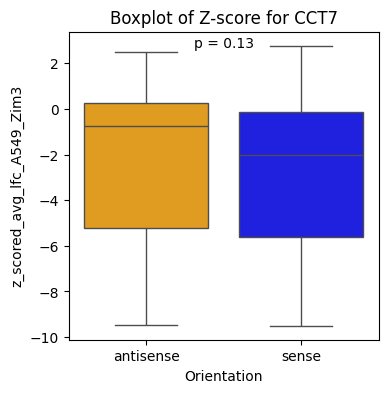

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


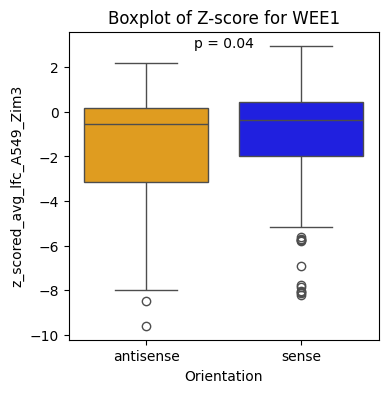

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


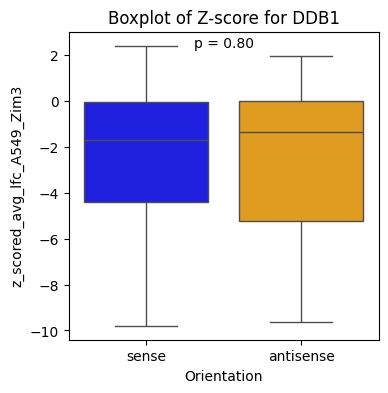

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


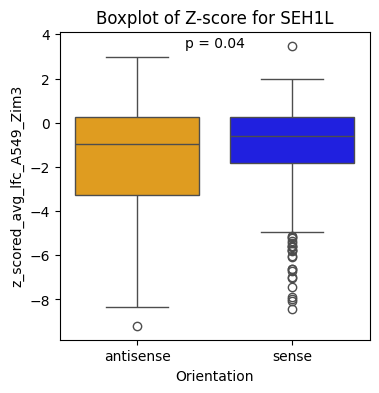

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


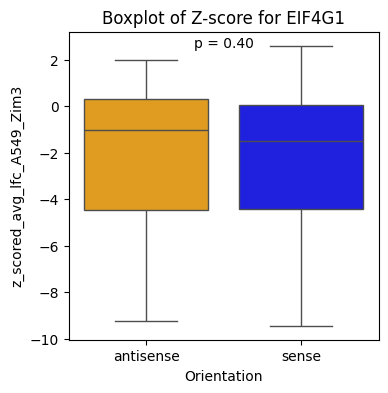

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


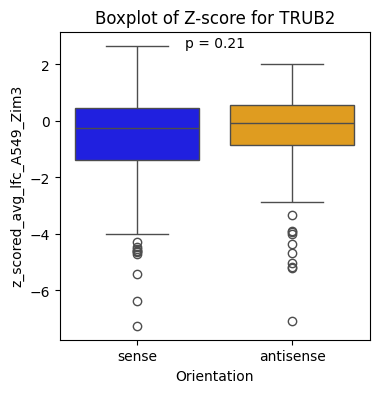

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


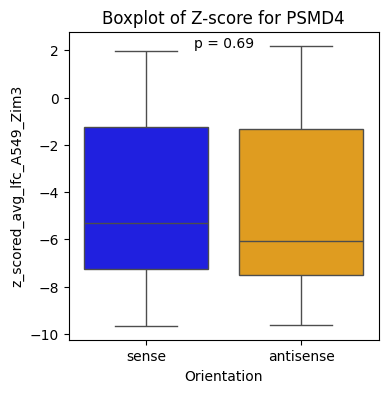

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


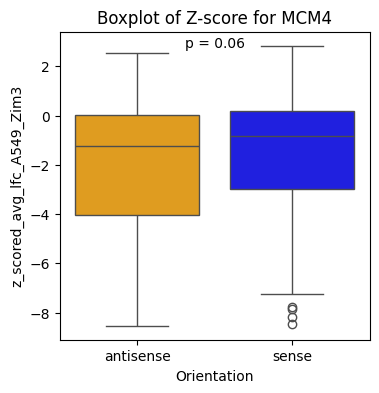

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


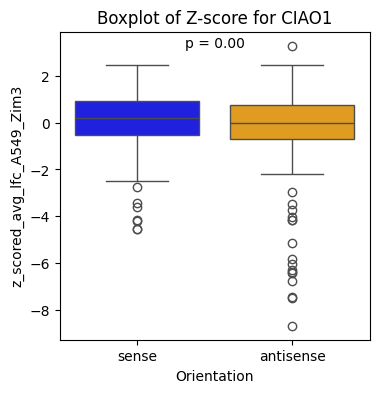

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


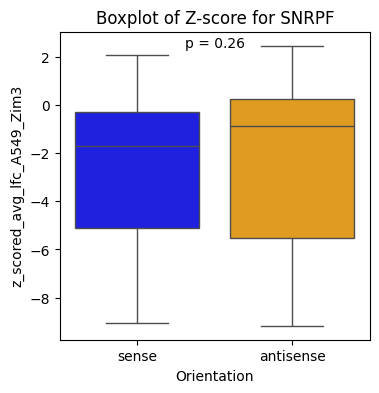

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


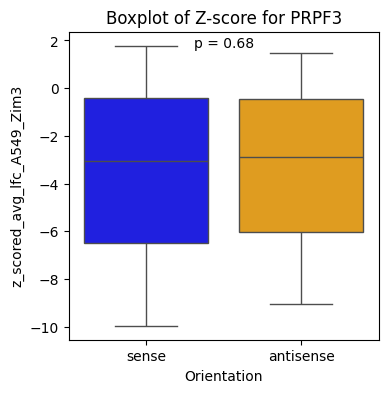

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


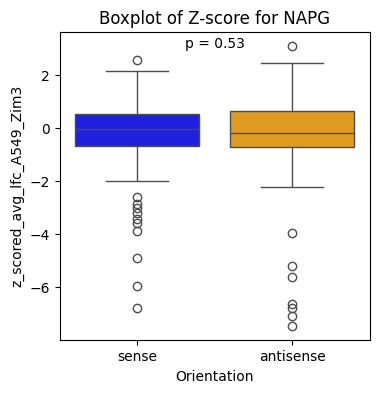

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


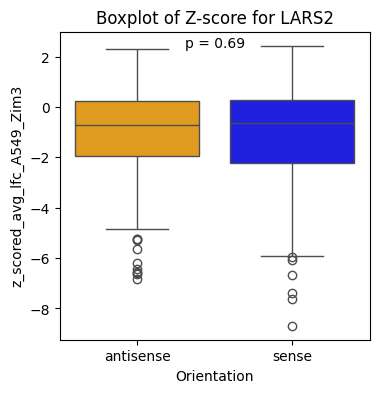

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


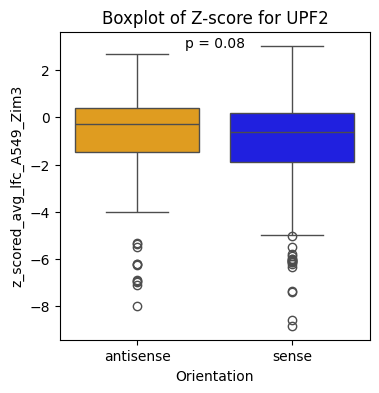

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


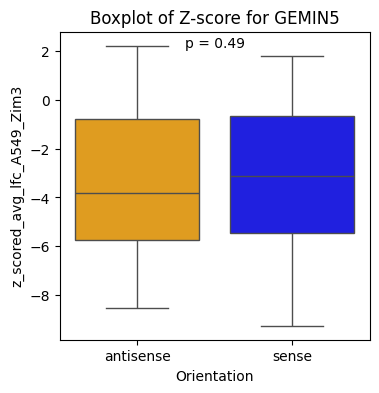

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


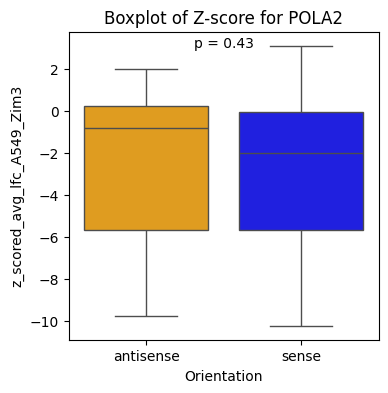

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


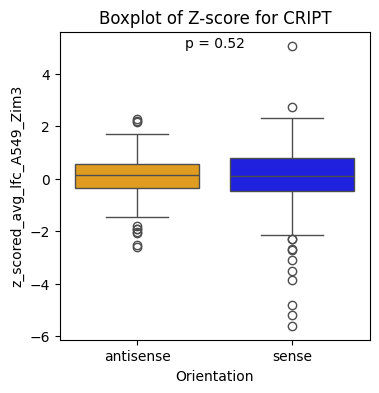

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


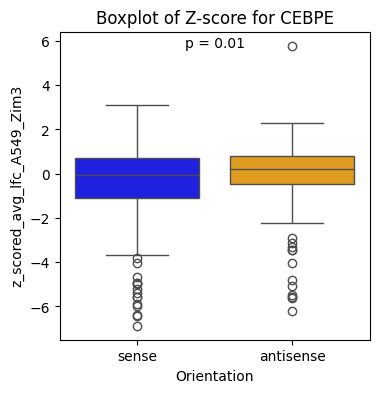

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


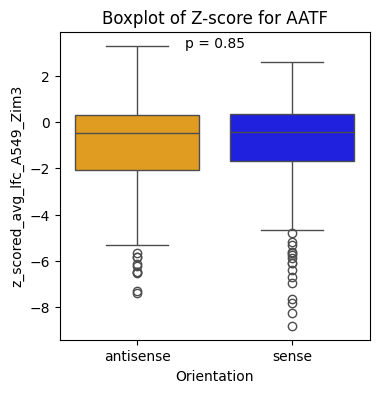

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


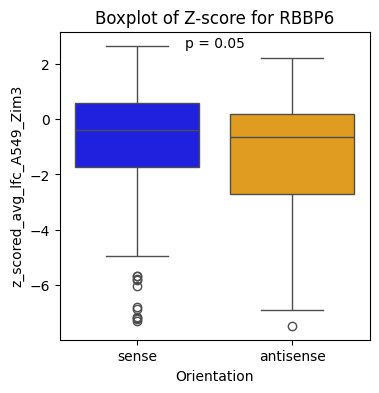

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


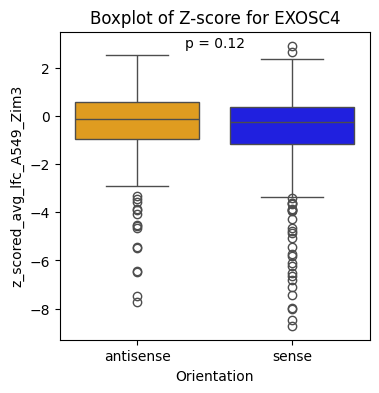

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


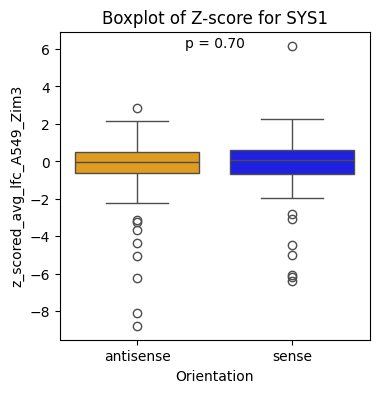

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


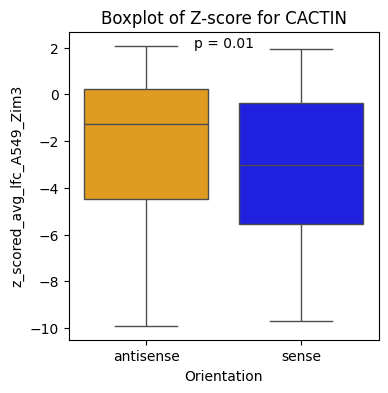

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


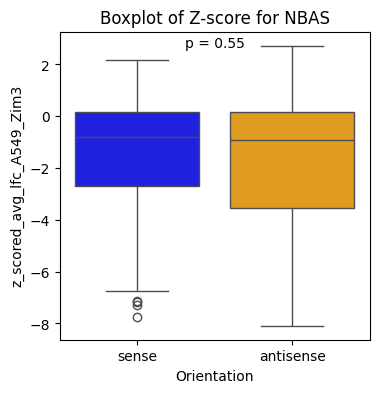

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


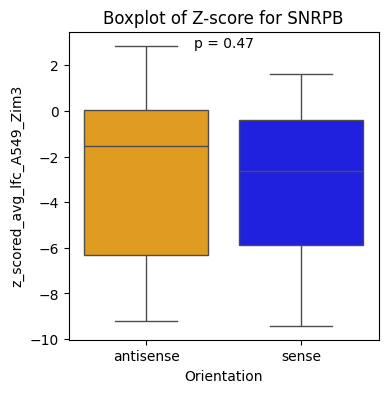

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


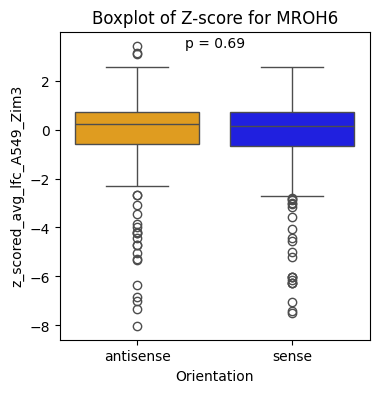

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


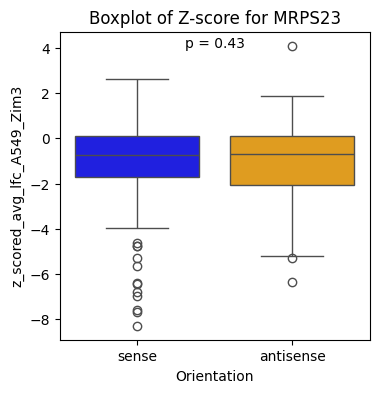

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


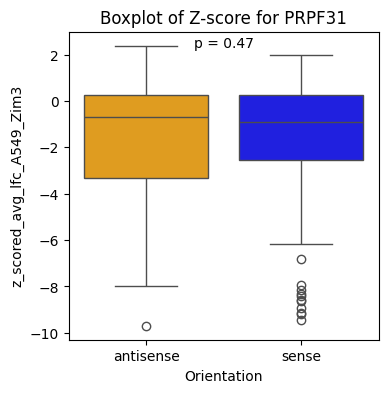

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


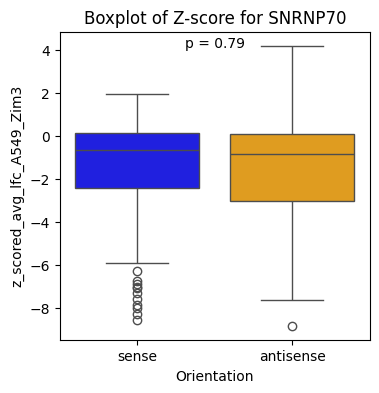

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


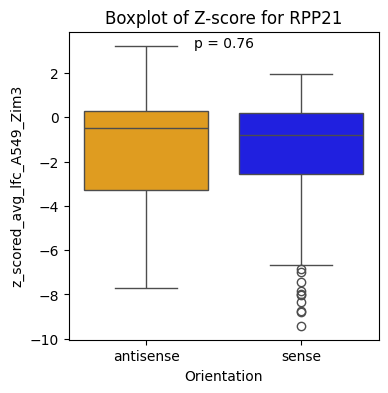

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


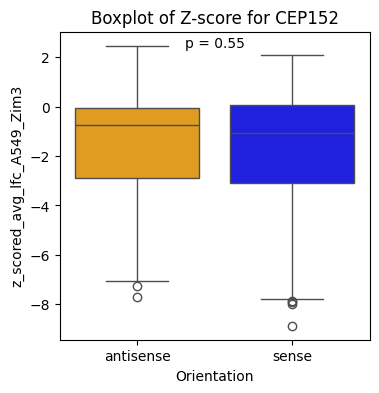

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


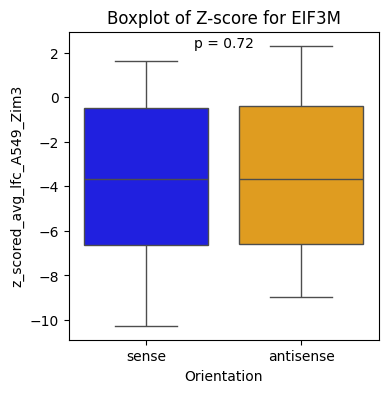

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


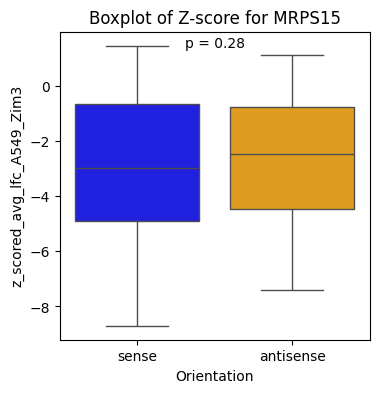

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


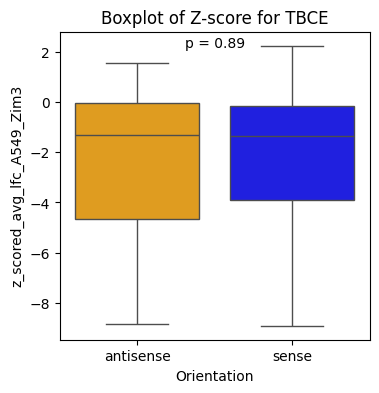

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


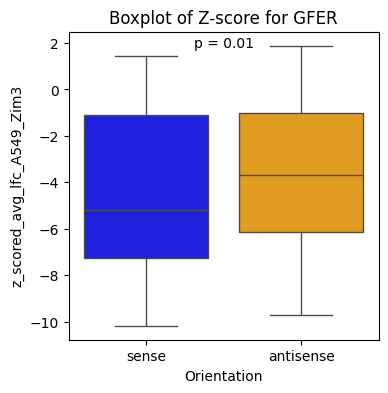

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


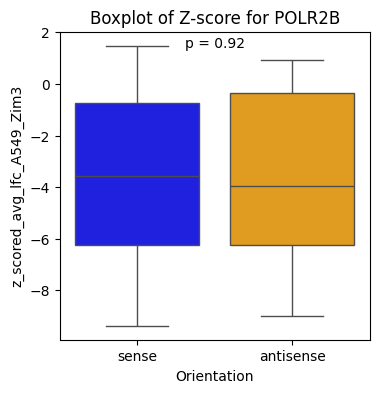

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


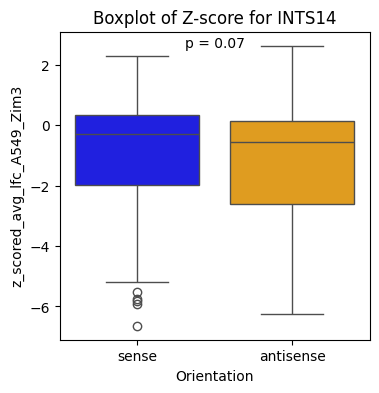

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


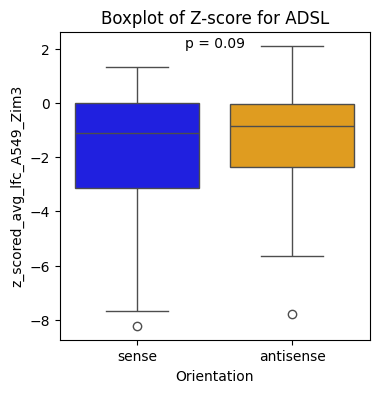

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


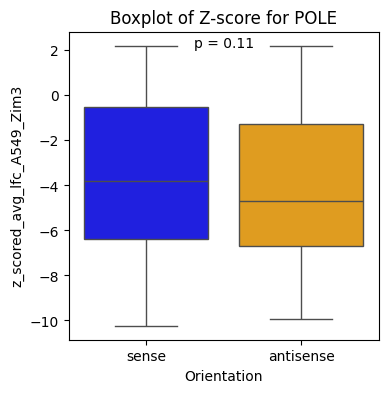

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


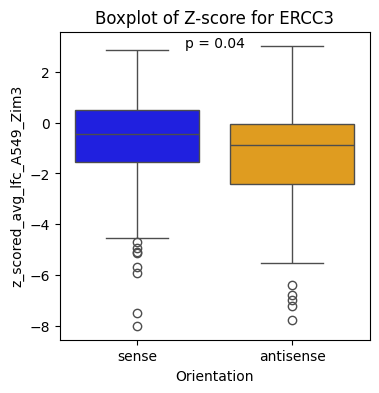

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


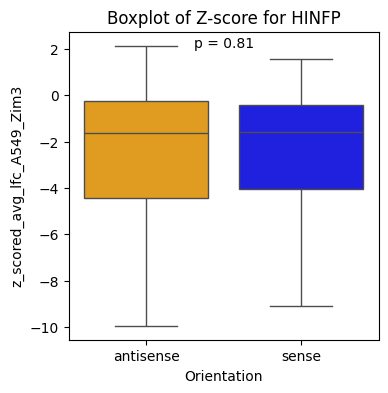

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


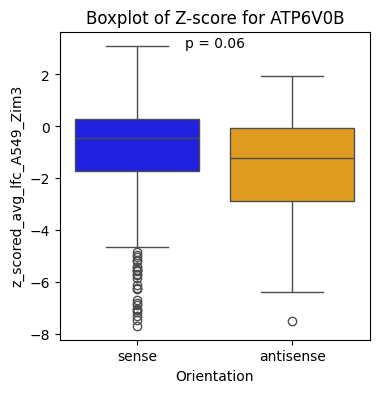

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


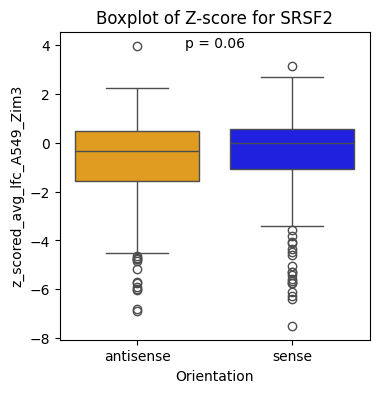

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


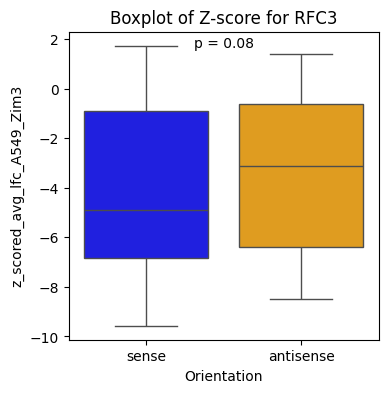

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


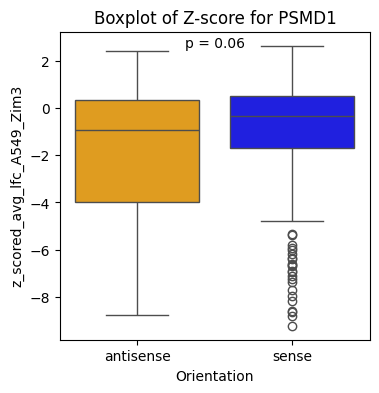

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


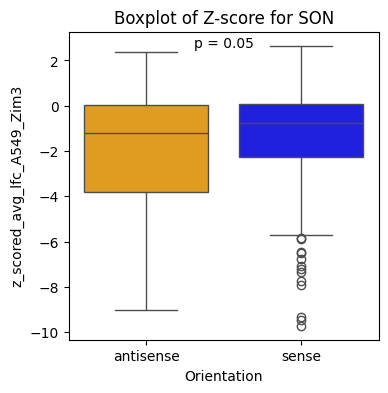

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


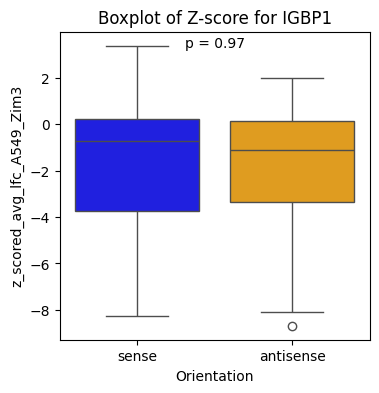

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


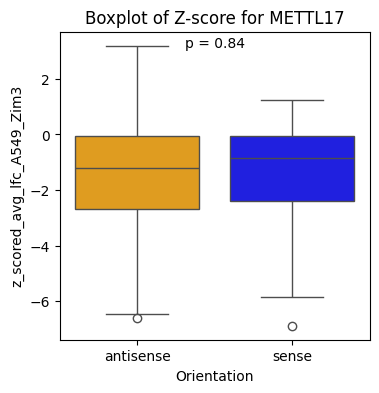

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


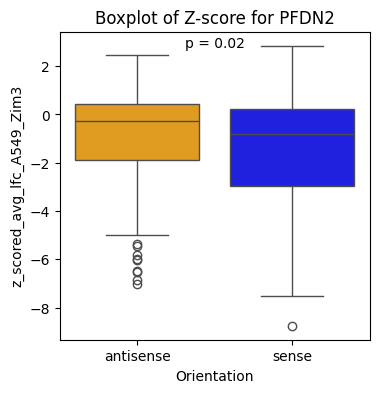

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


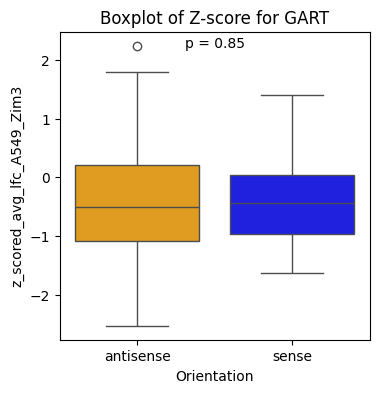

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


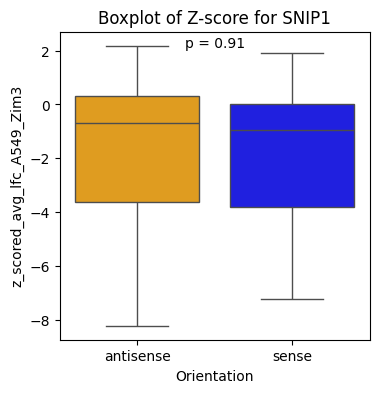

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


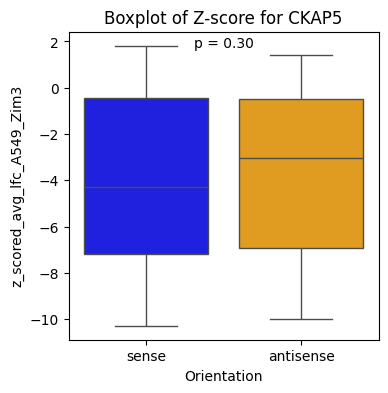

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


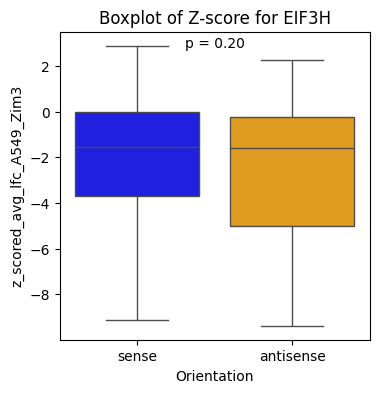

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


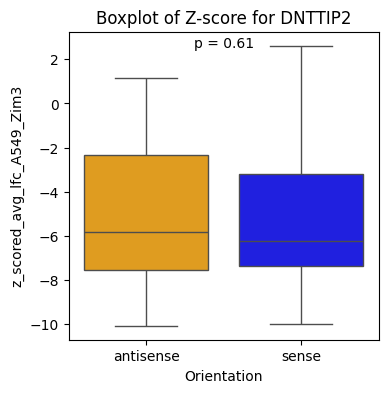

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


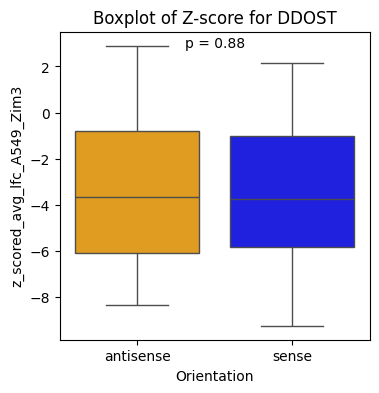

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


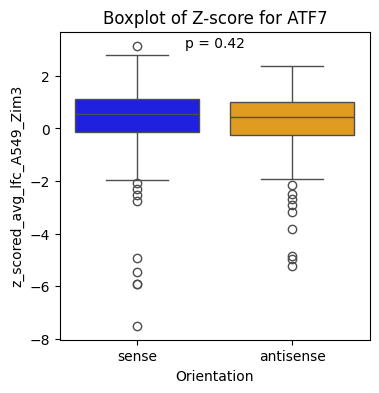

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


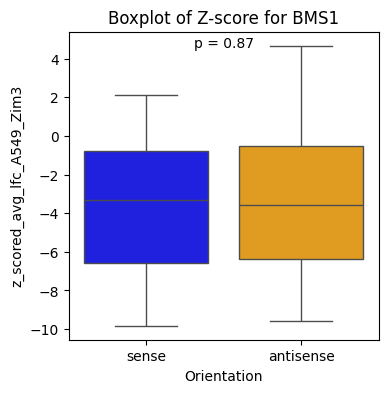

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


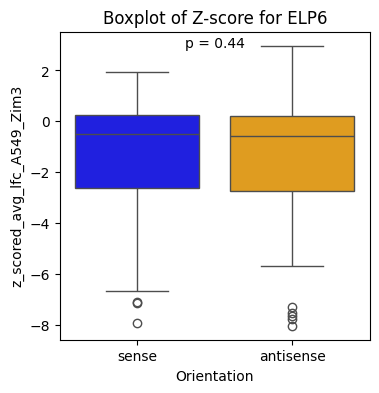

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


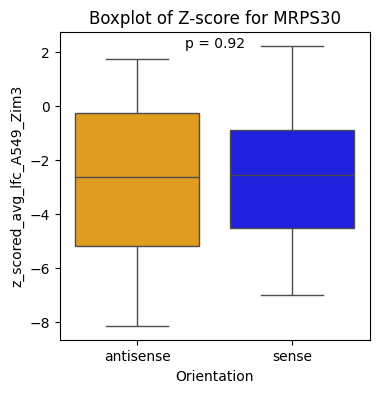

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


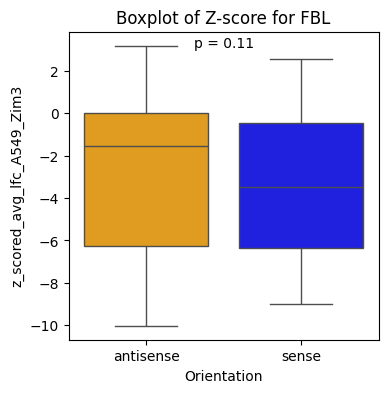

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


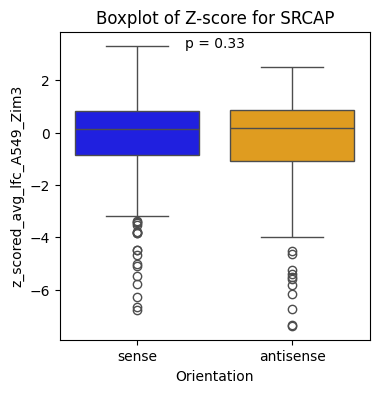

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


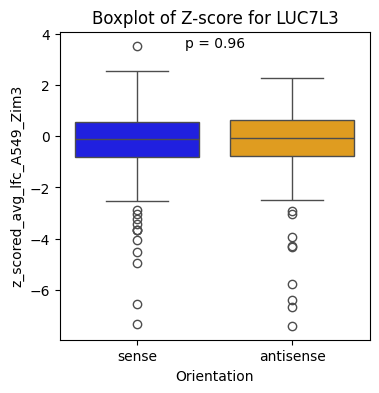

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


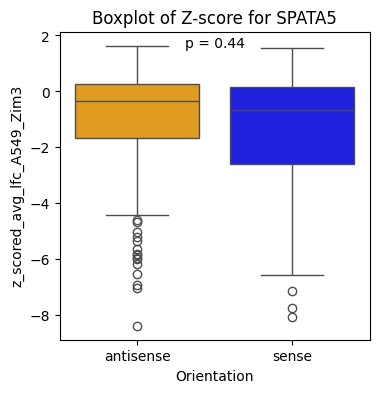

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


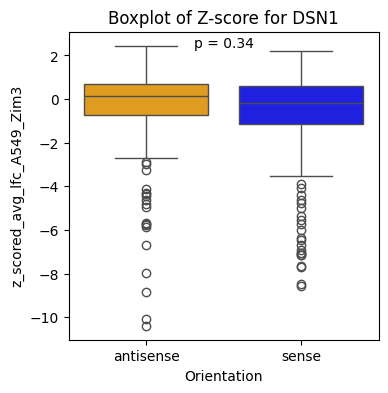

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


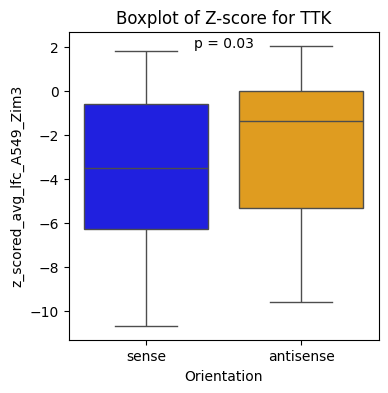

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


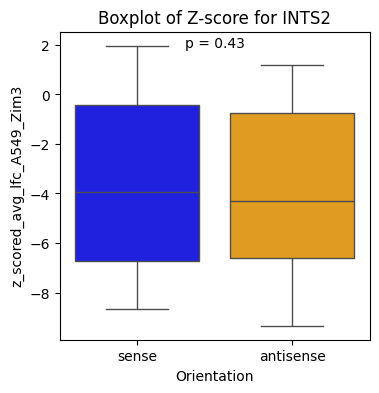

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


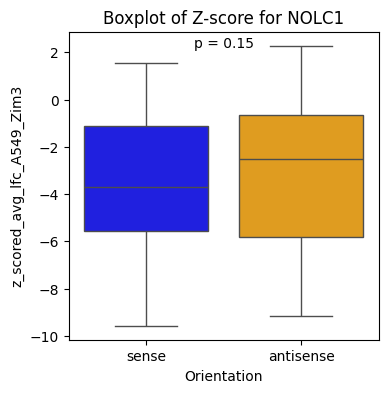

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


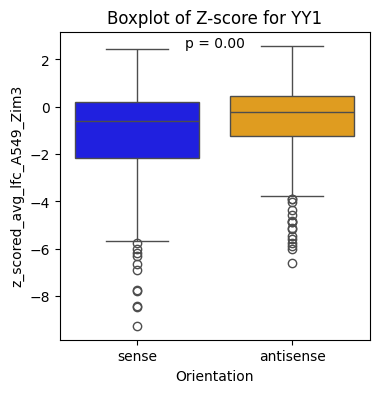

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


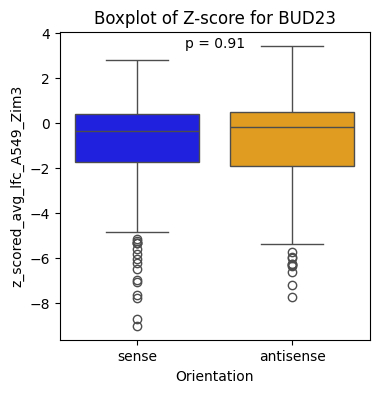

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


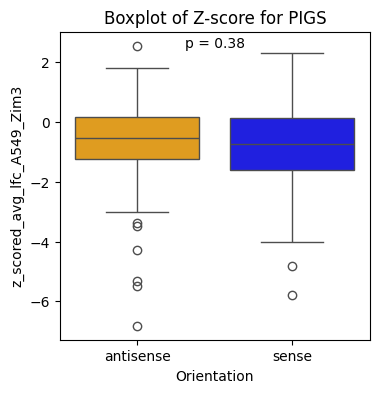

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


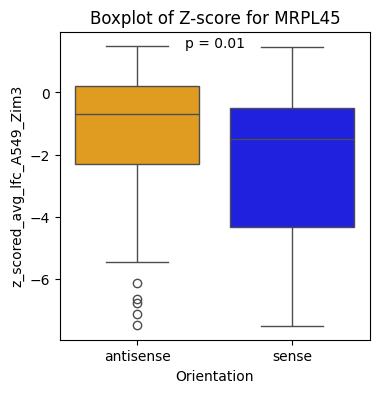

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


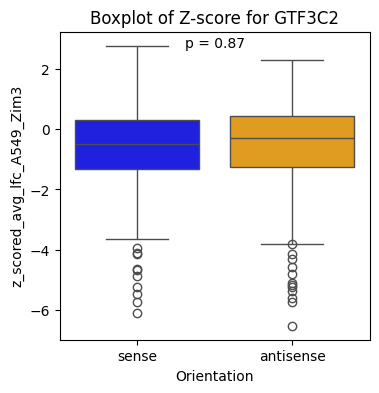

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


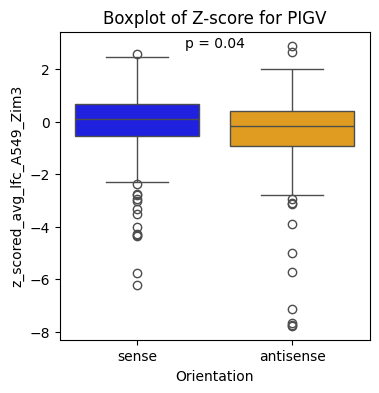

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


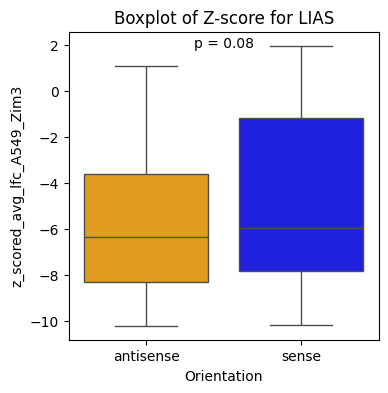

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


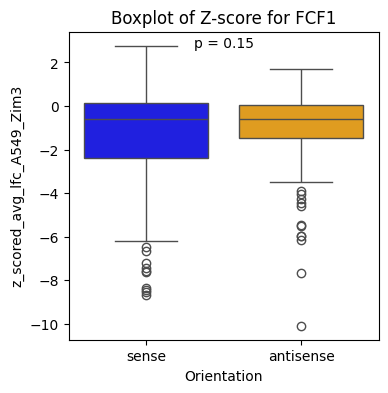

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


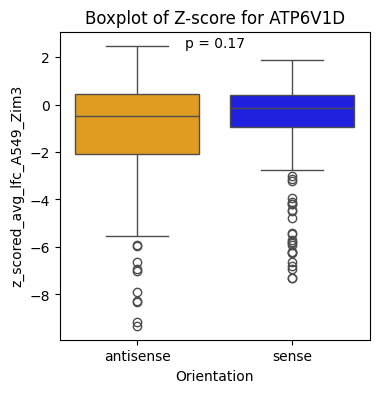

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


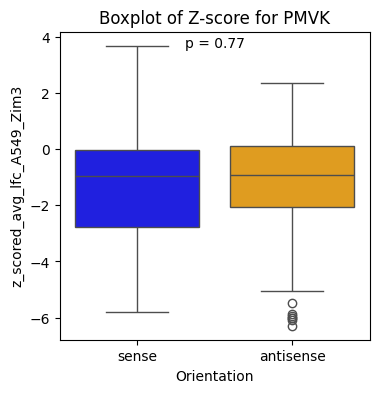

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


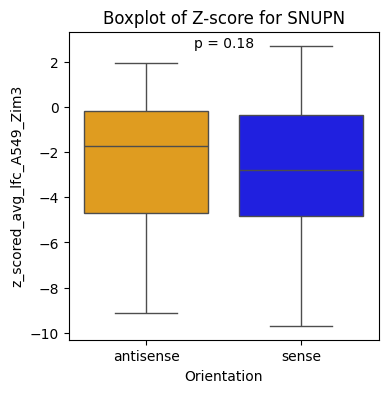

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


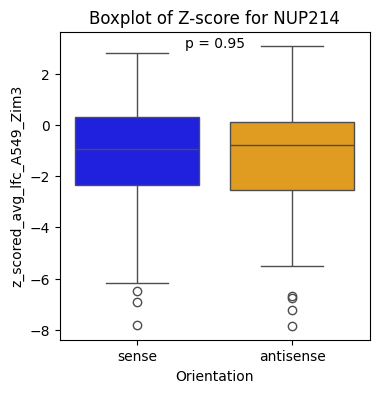

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


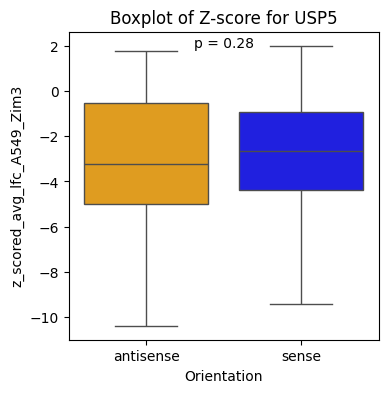

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


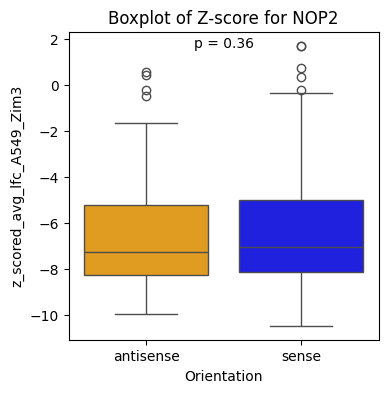

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


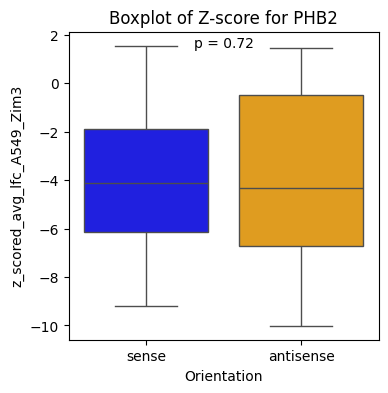

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


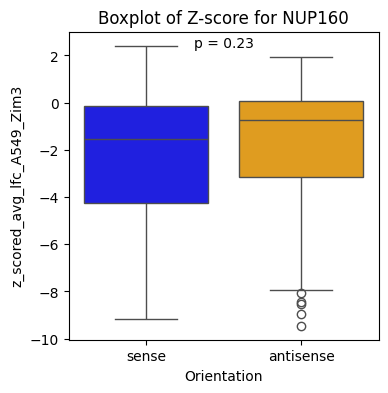

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


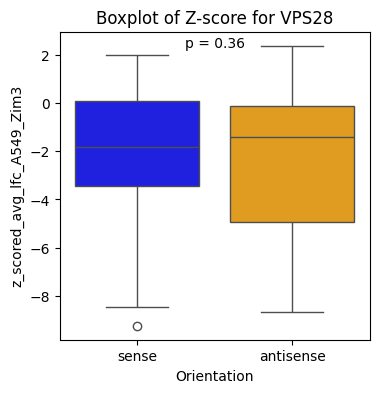

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


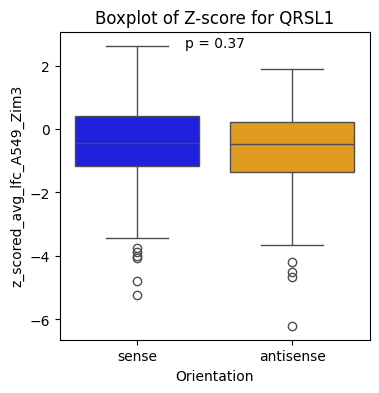

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


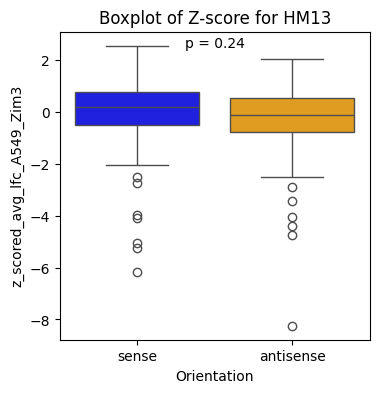

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


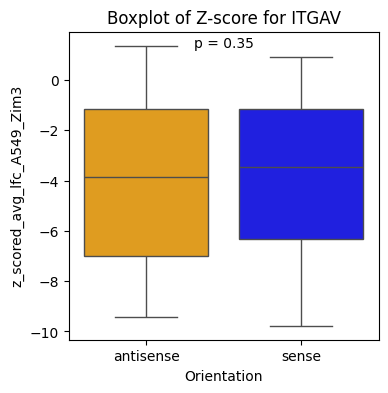

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


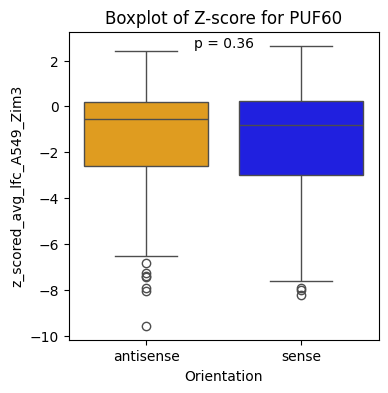

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


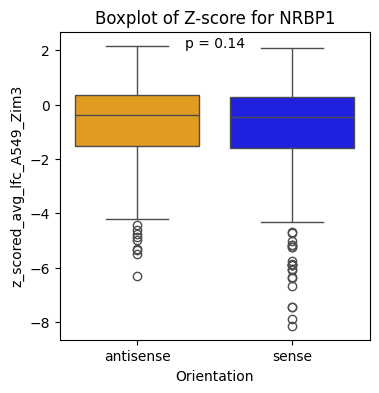

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


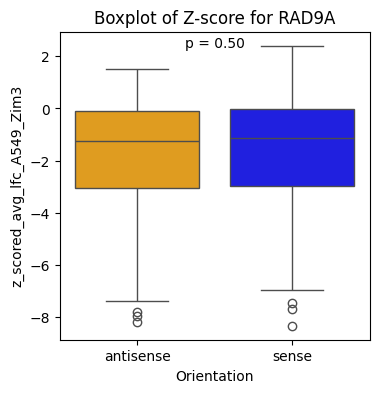

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


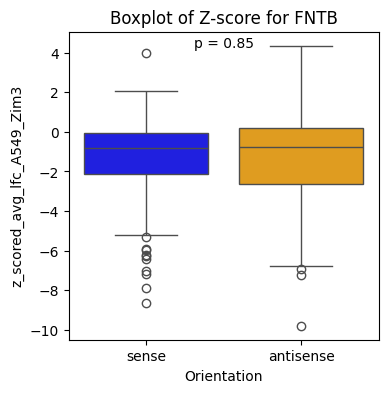

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


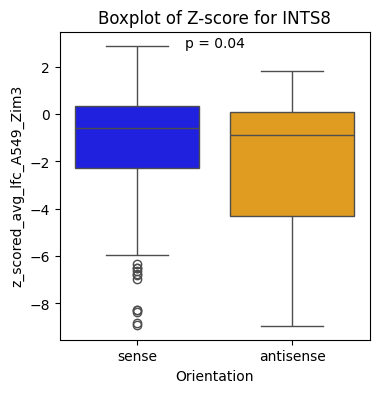

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


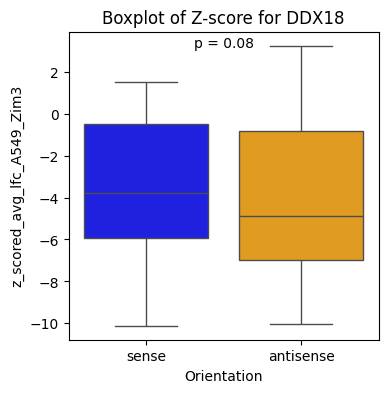

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


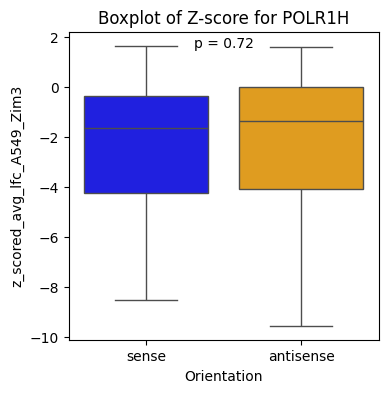

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


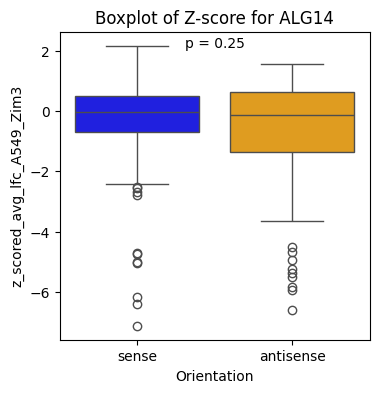

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


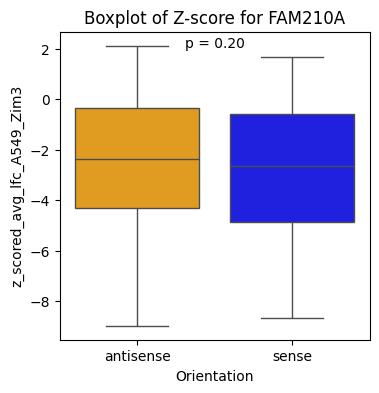

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


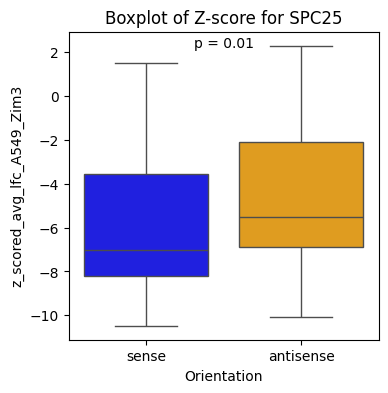

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


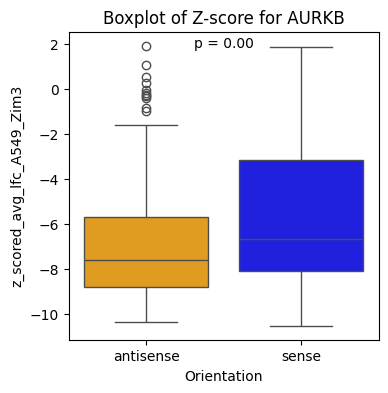

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


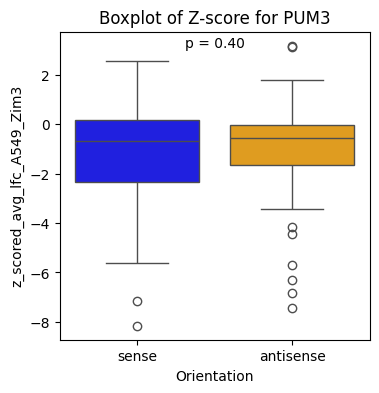

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


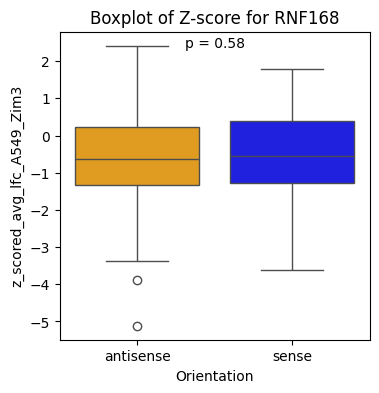

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


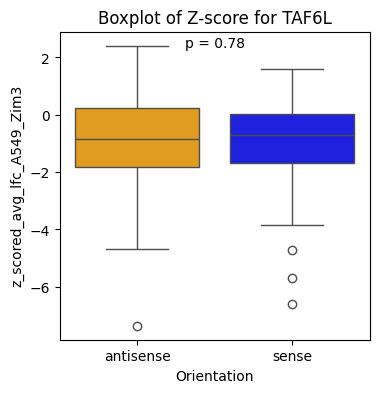

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


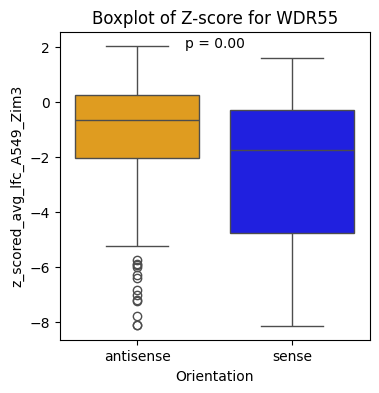

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


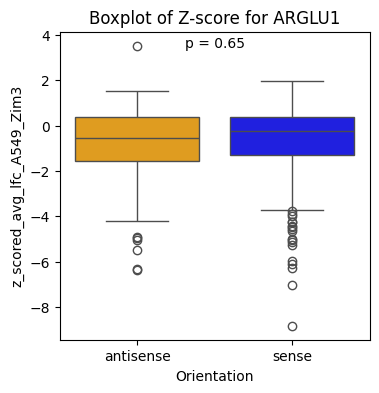

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


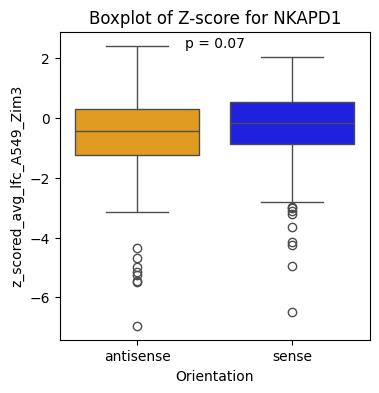

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


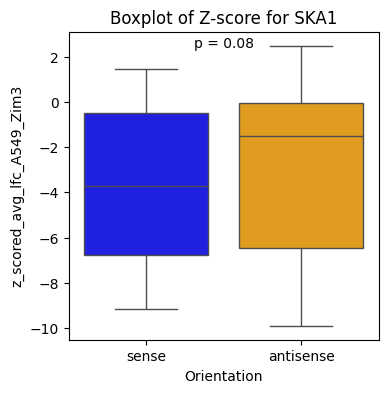

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


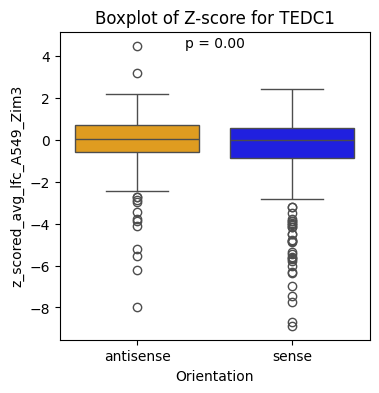

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


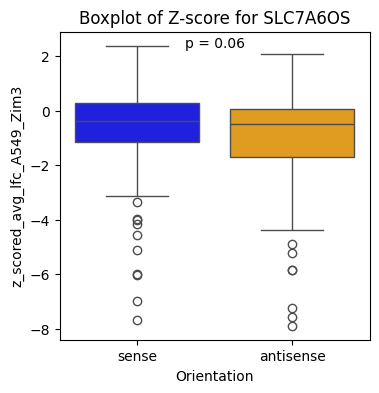

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


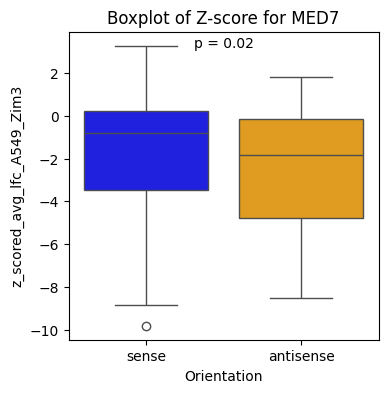

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


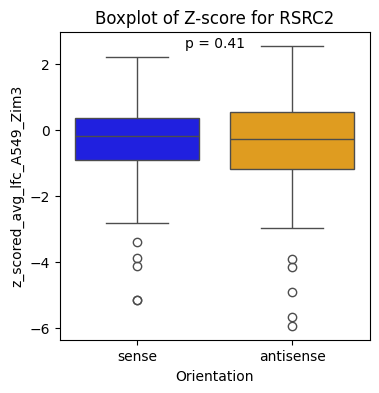

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


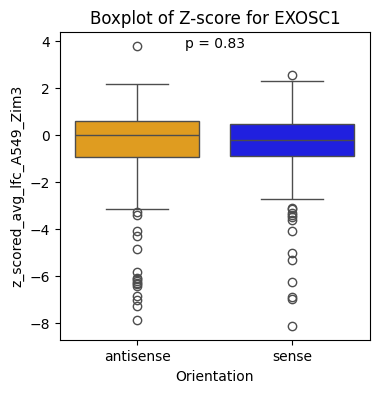

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


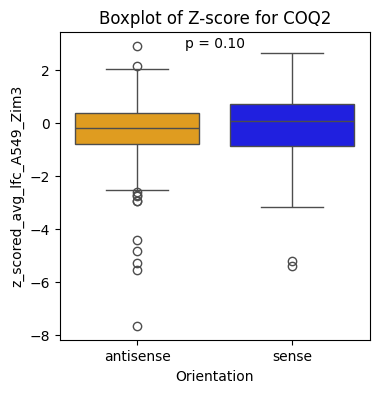

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


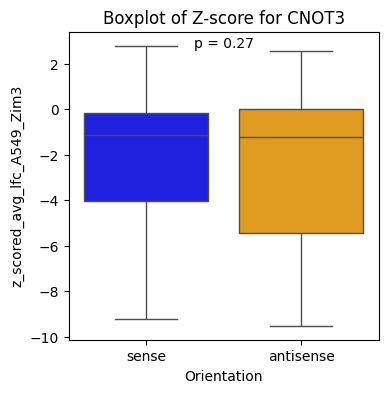

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


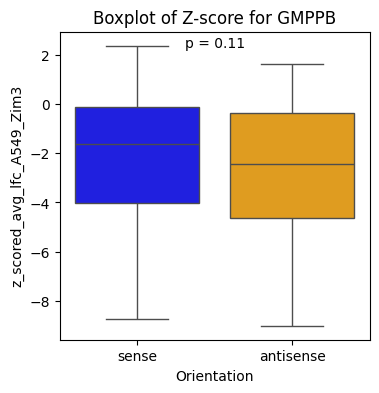

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


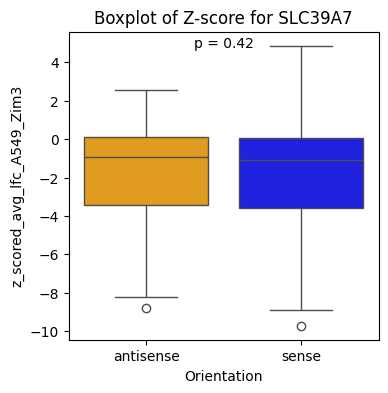

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


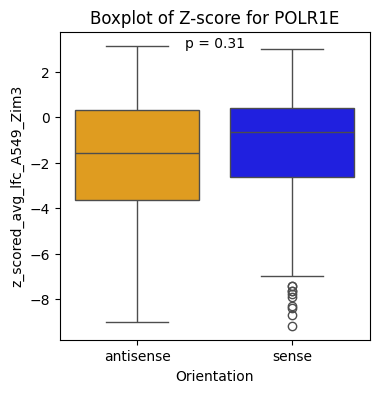

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


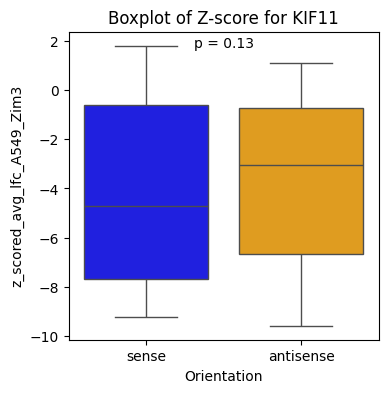

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


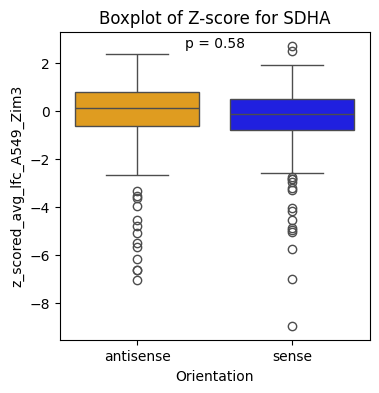

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


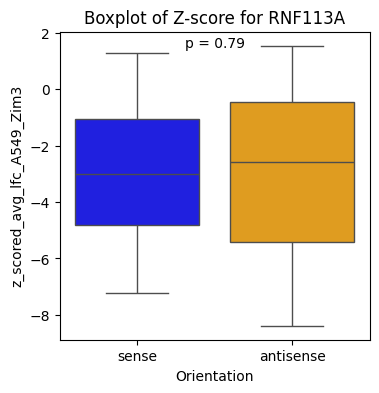

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


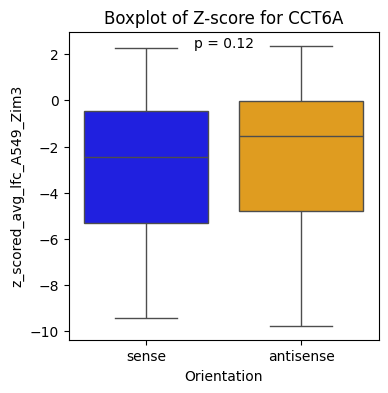

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


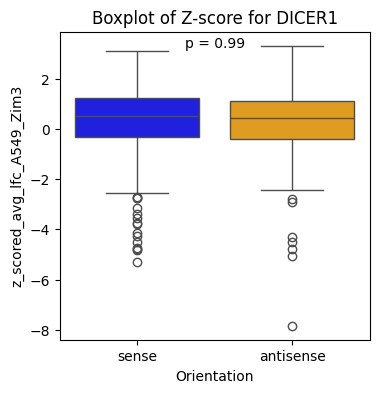

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


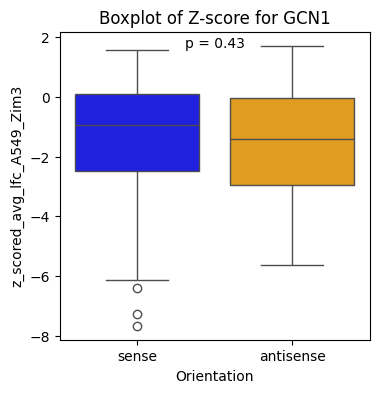

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


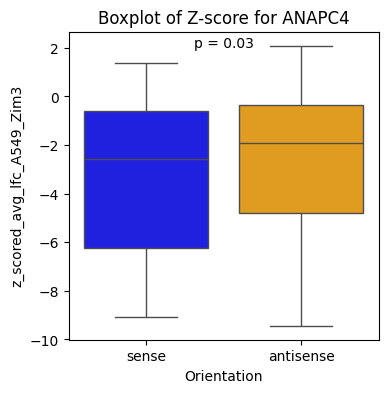

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


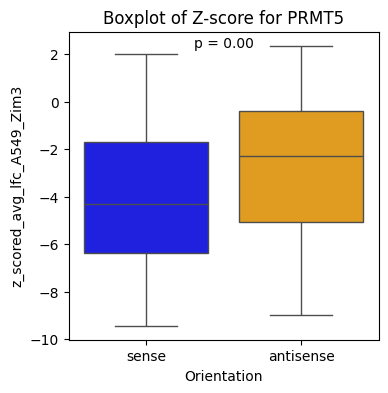

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


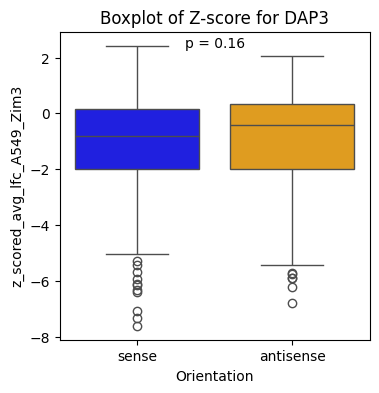

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


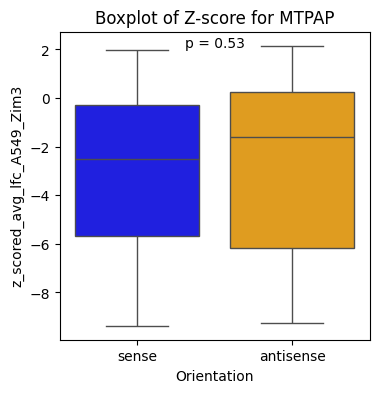

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


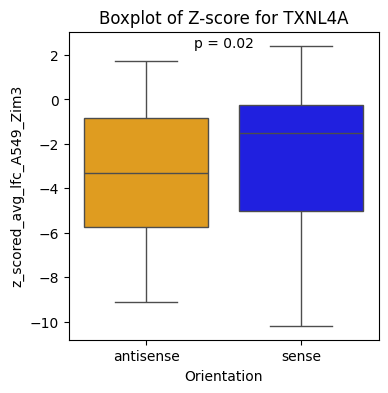

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


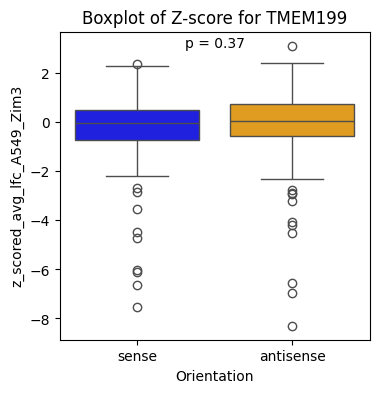

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


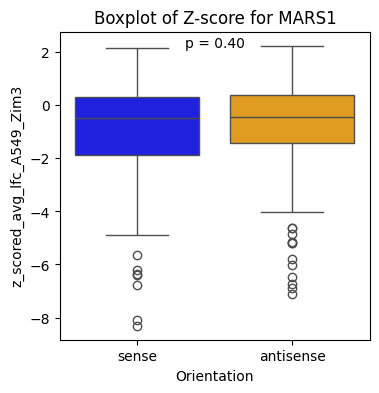

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


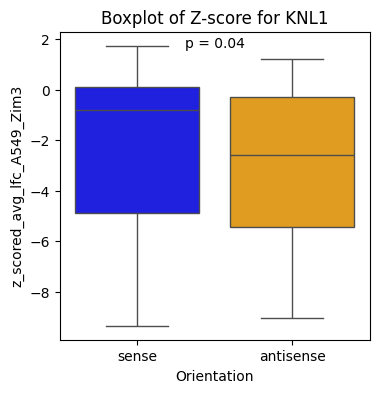

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


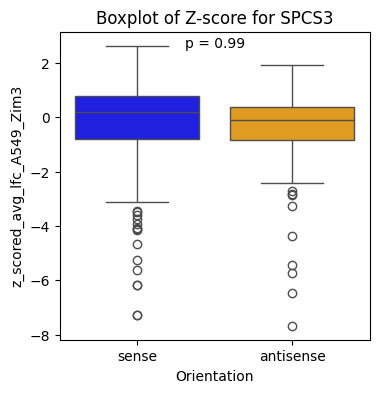

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


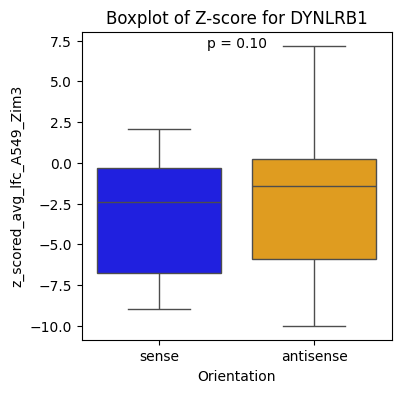

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


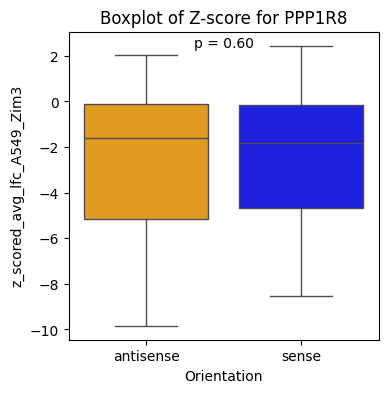

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


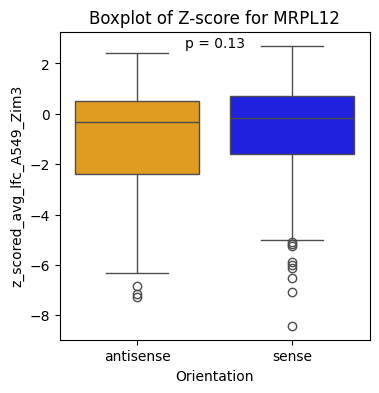

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


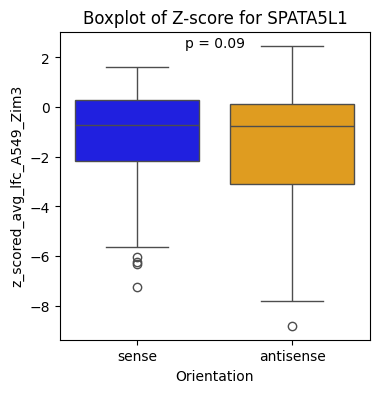

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


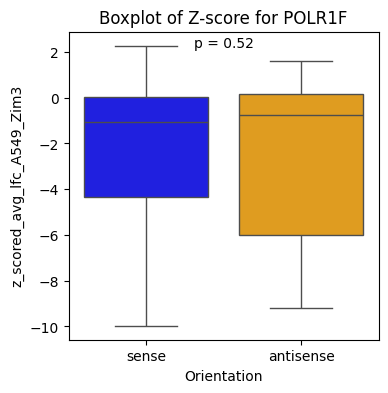

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


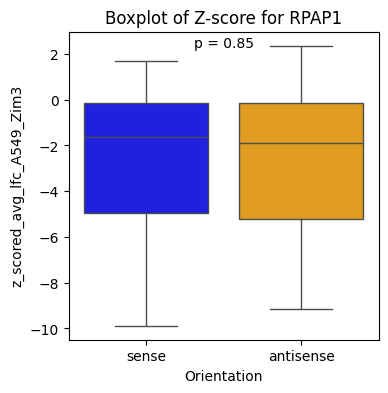

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


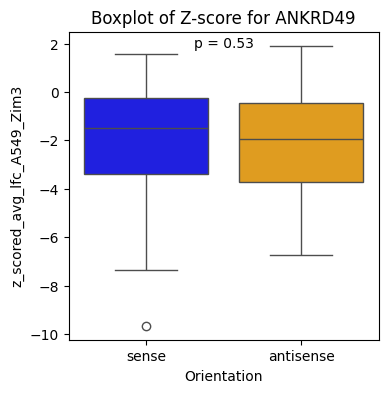

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


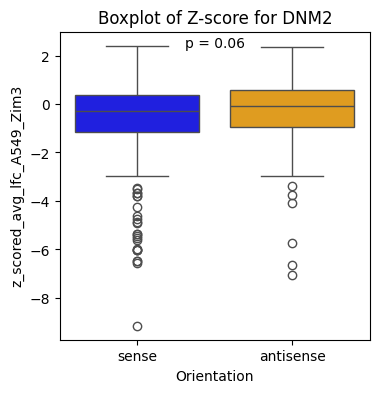

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


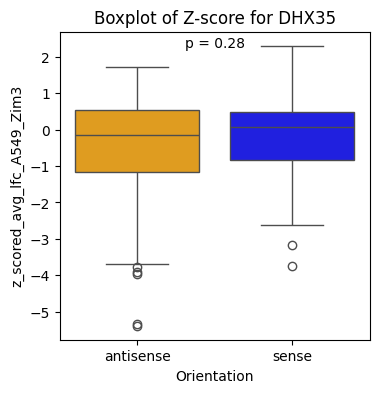

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


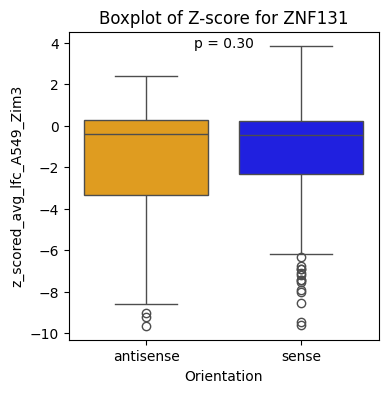

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


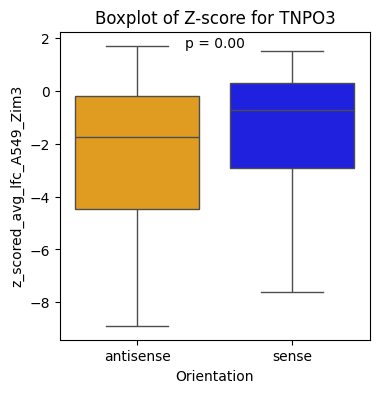

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


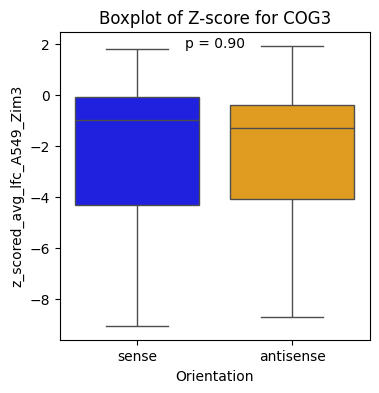

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


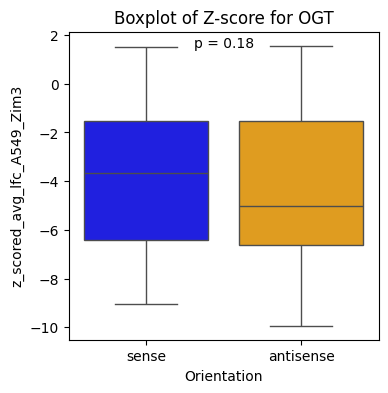

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


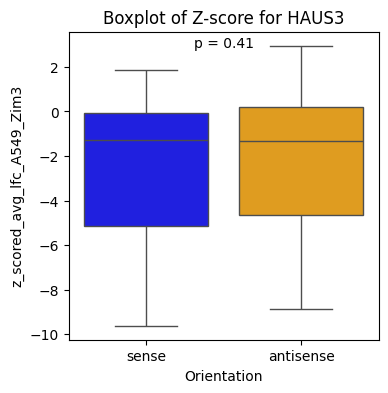

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


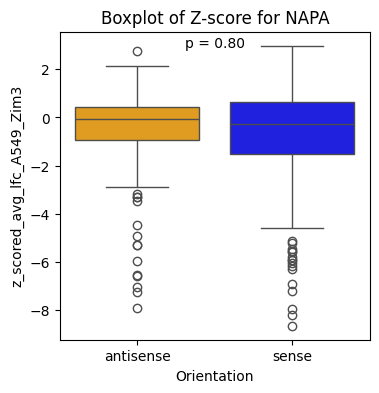

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


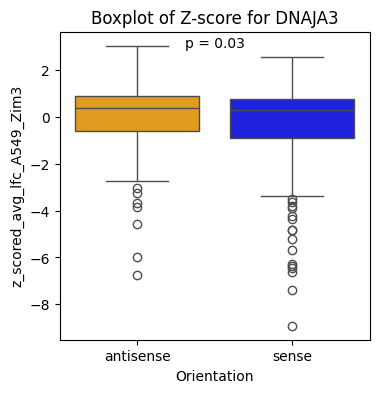

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


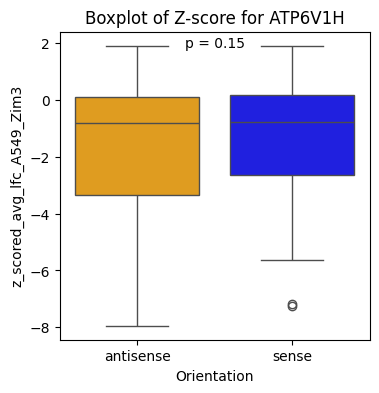

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


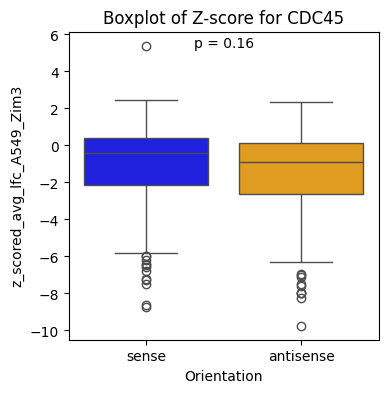

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


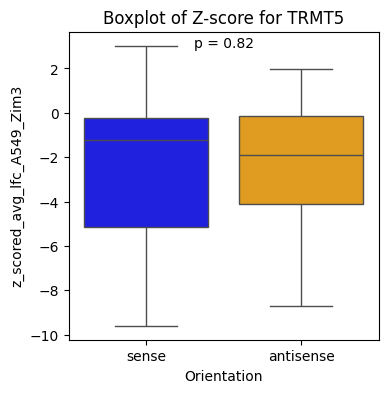

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


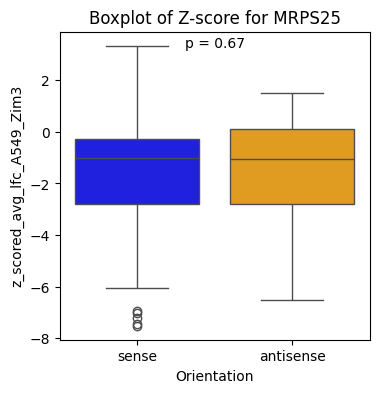

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


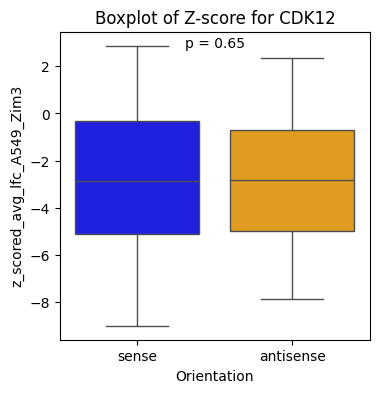

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


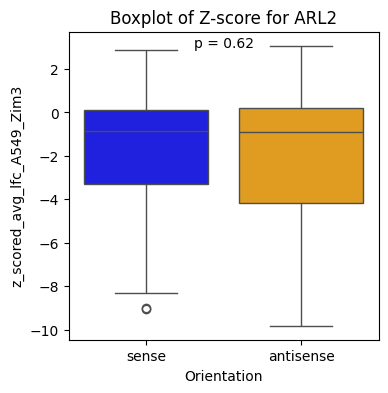

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


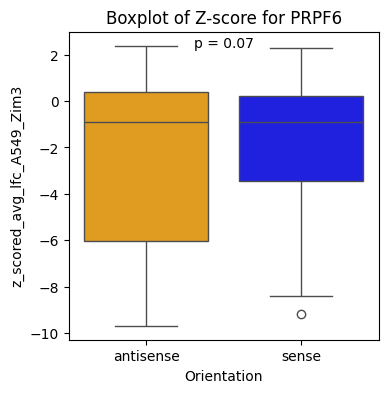

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


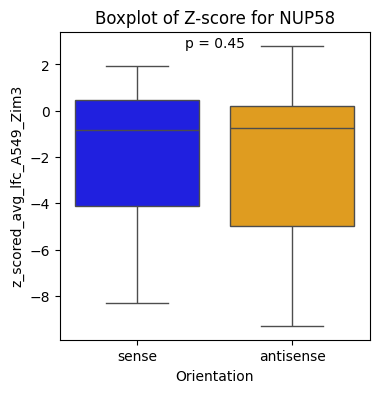

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


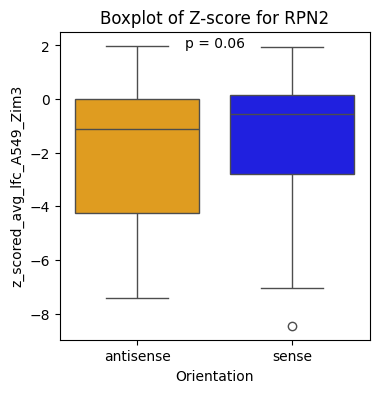

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


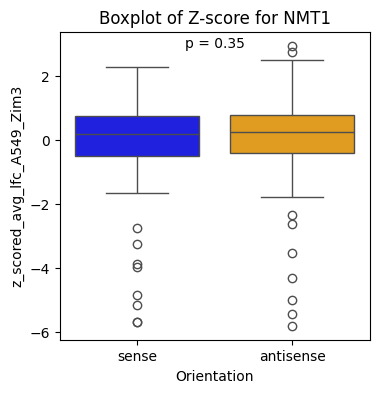

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


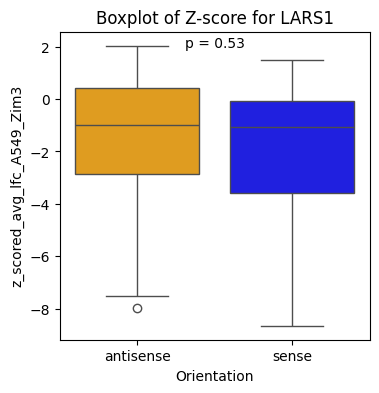

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


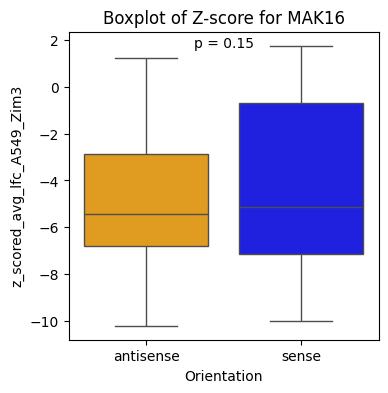

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


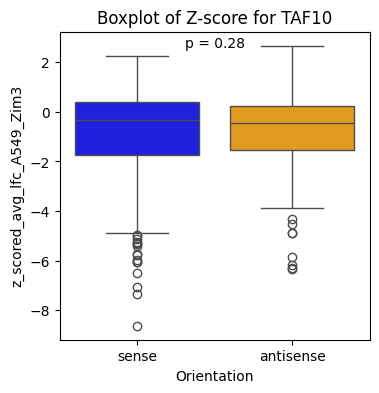

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


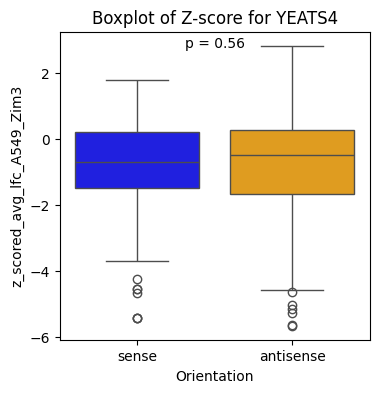

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


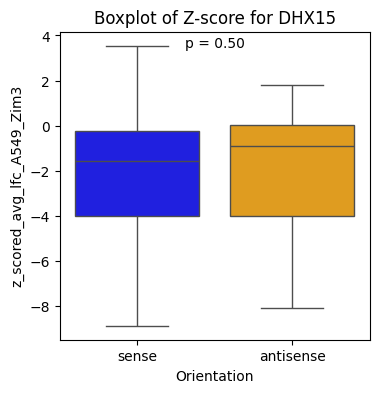

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


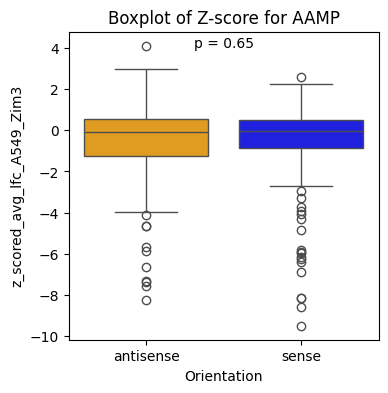

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


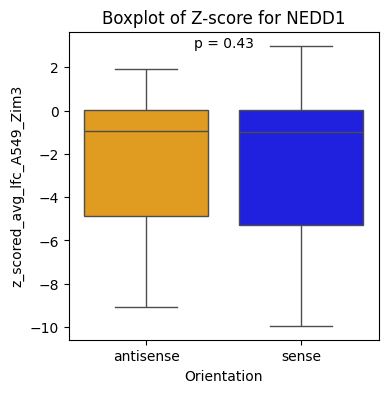

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


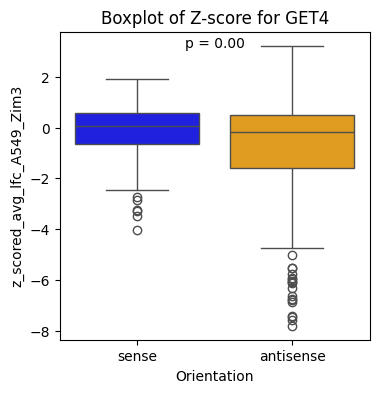

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


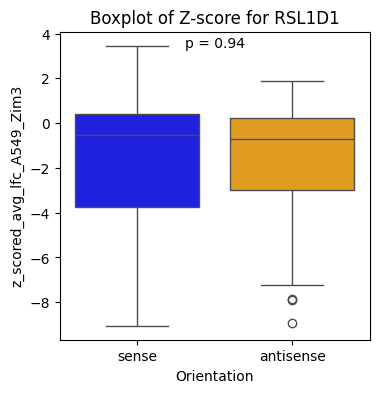

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


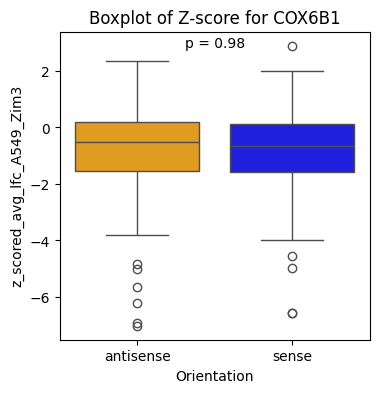

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


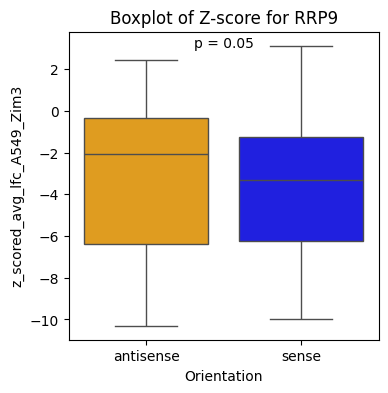

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


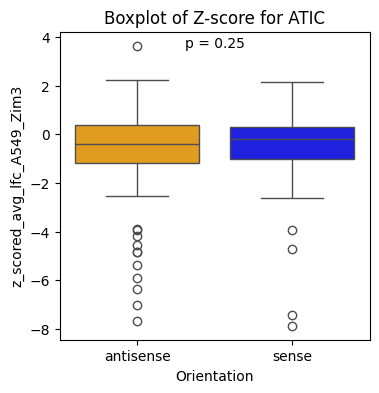

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


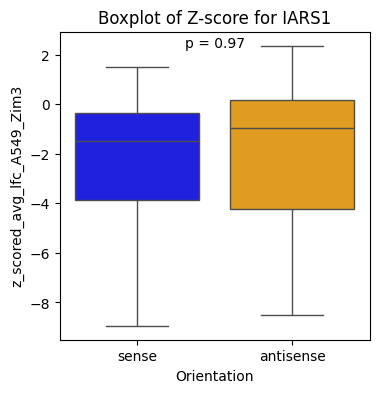

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


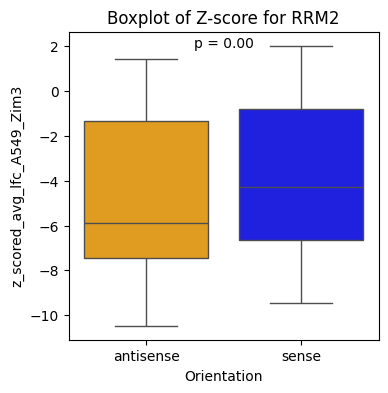

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


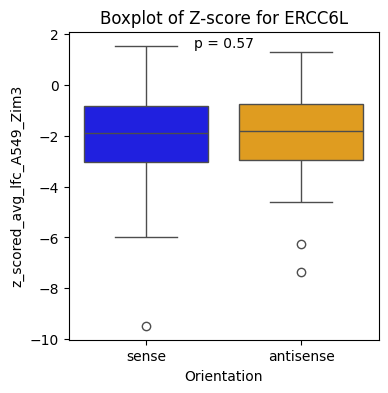

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


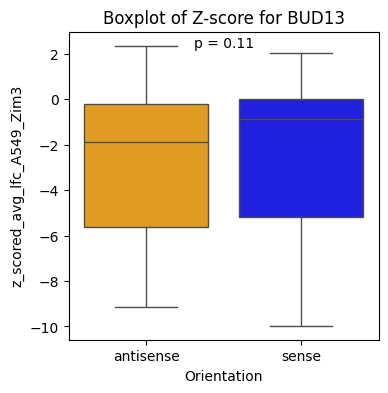

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


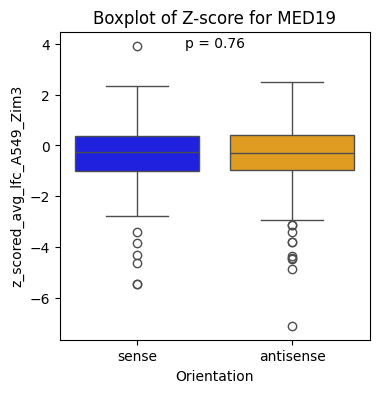

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


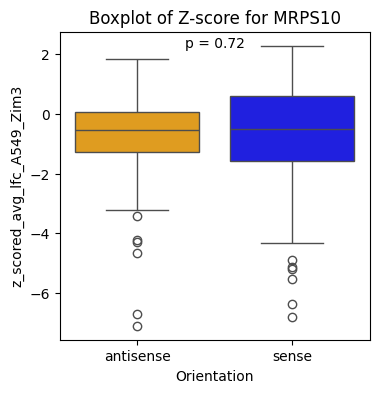

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


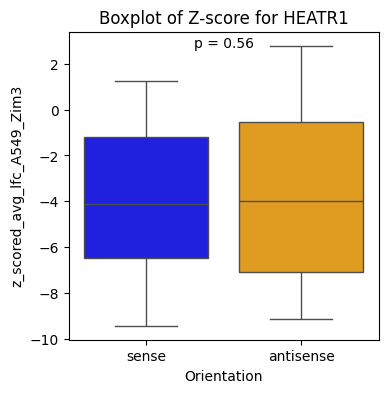

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


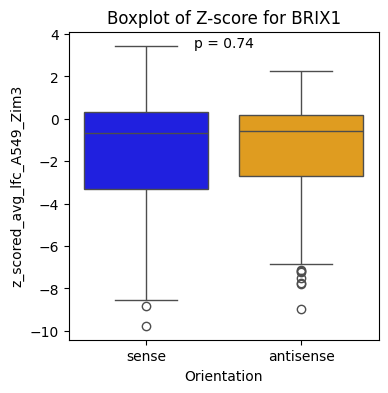

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


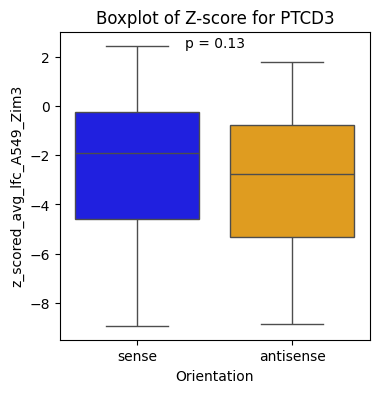

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


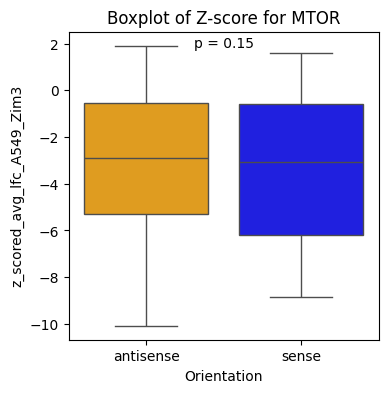

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


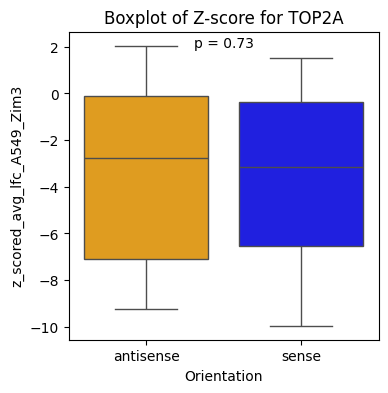

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


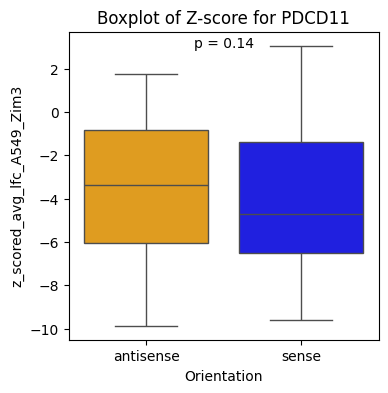

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


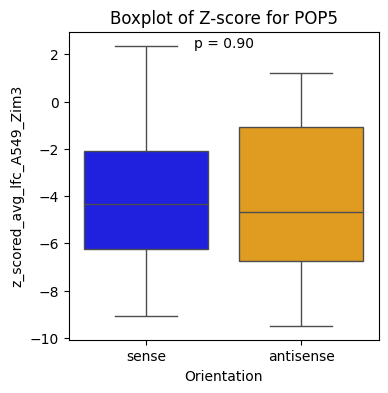

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


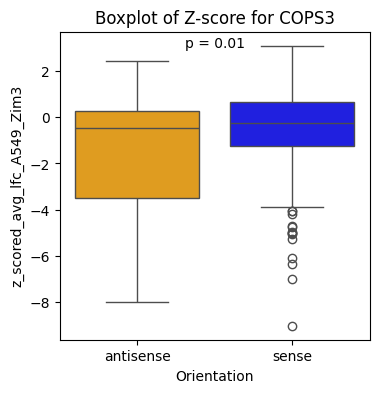

In [12]:
pvalue_A549_Zim3 = orientation_comparison(ess_merged_df_guide_orientation,'z_scored_avg_lfc_A549_Zim3')

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


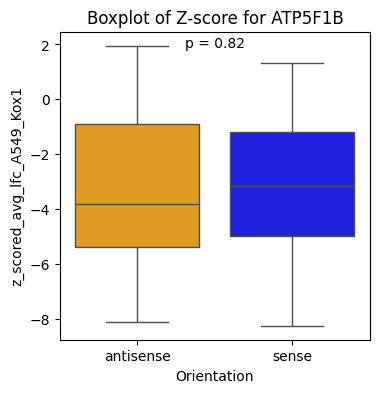

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


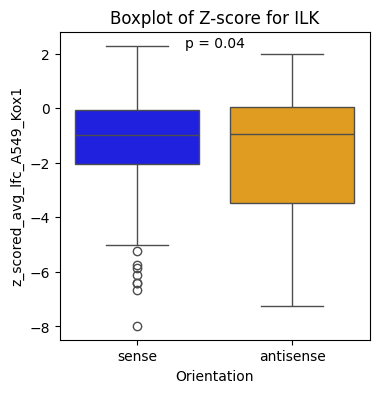

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


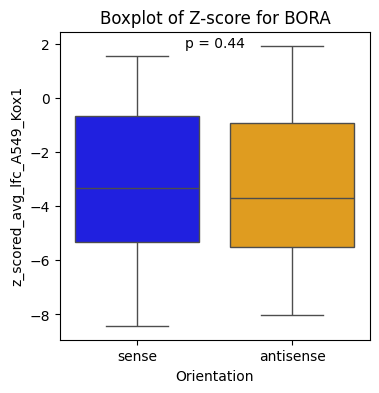

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


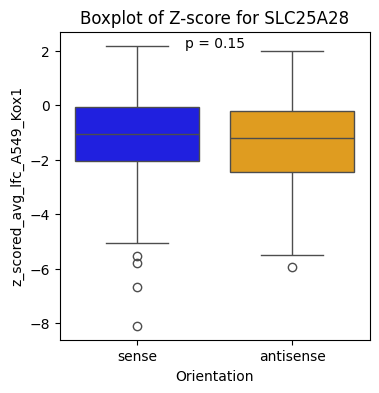

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


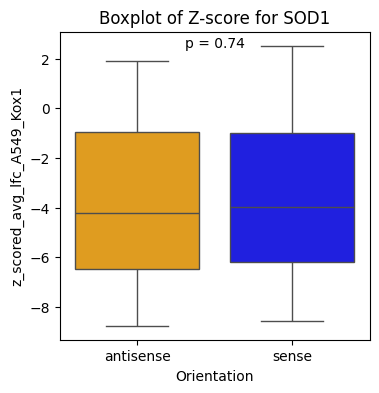

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


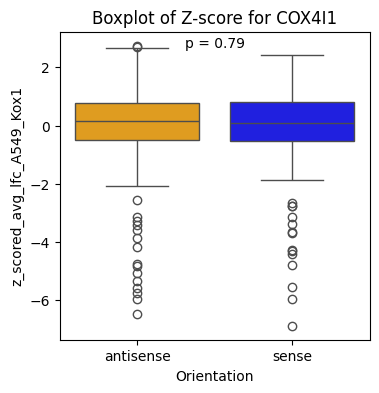

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


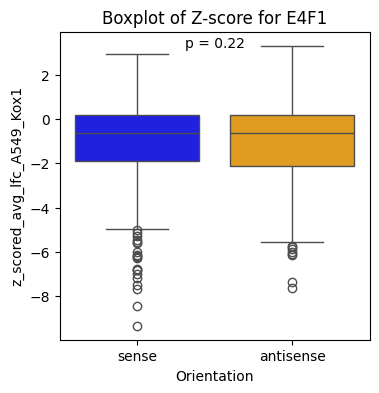

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


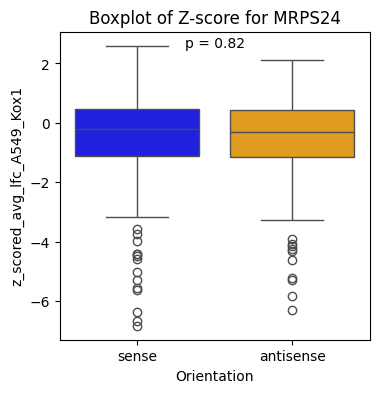

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


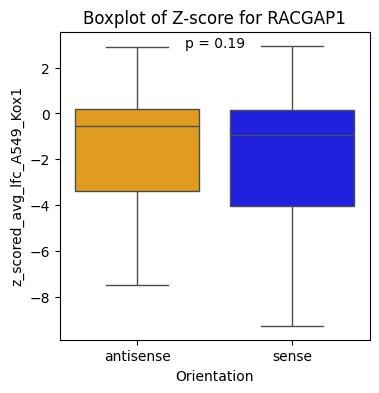

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


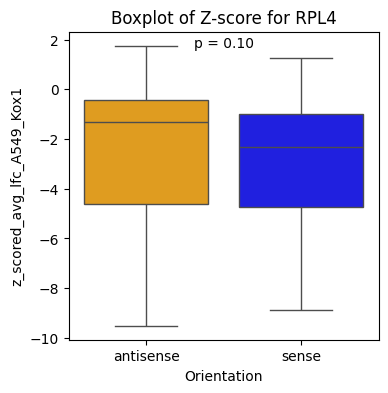

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


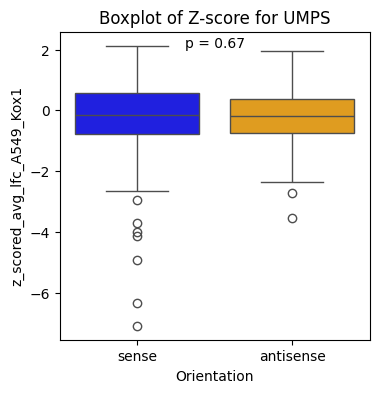

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


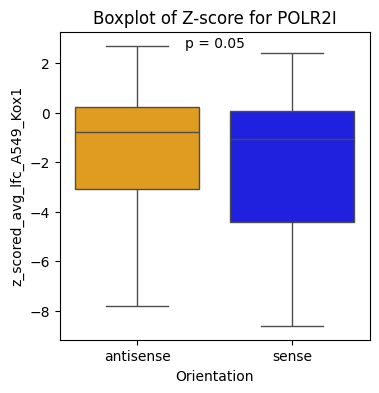

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


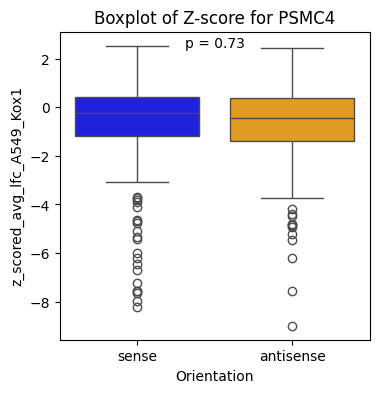

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


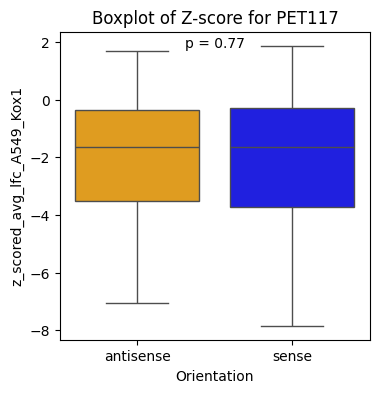

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


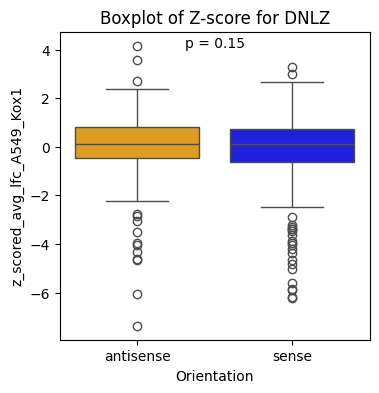

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


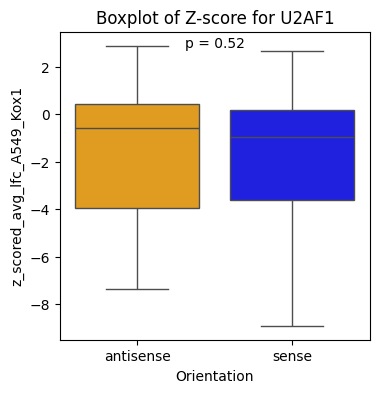

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


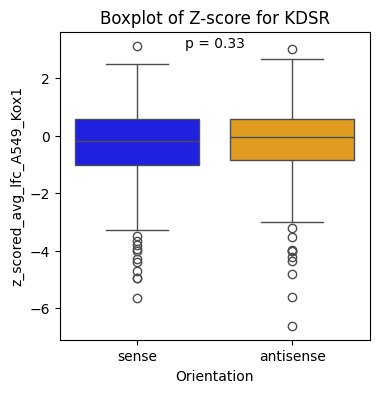

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


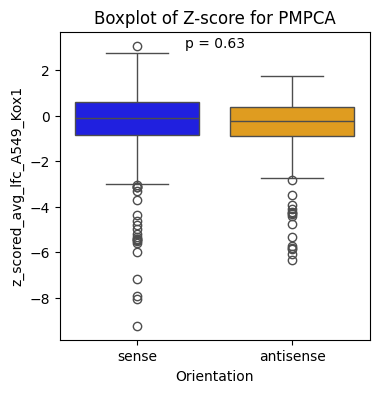

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


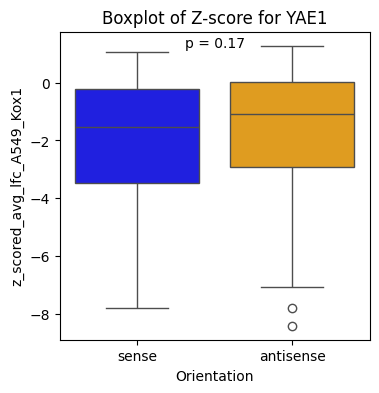

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


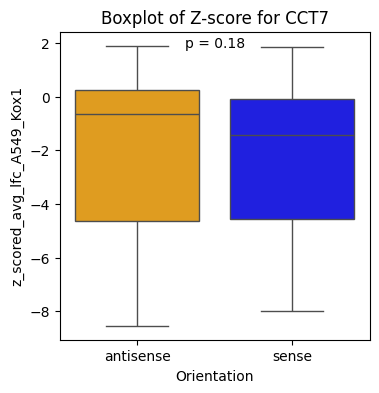

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


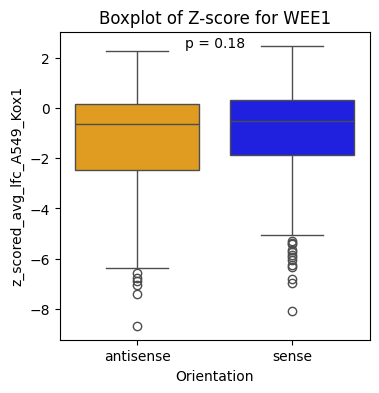

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


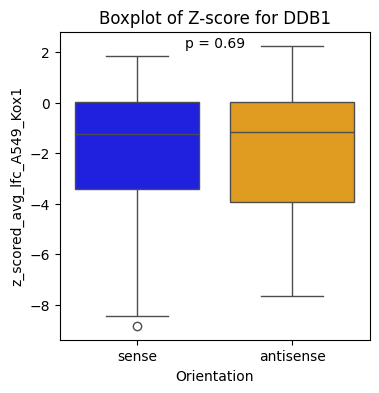

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


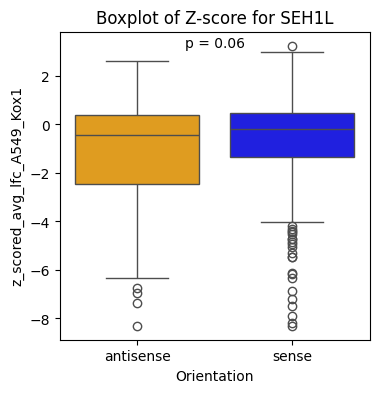

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


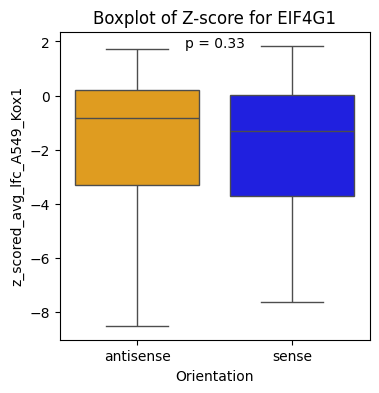

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


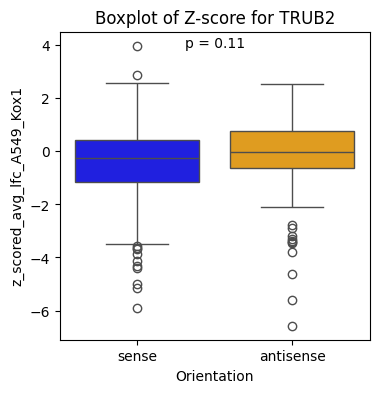

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


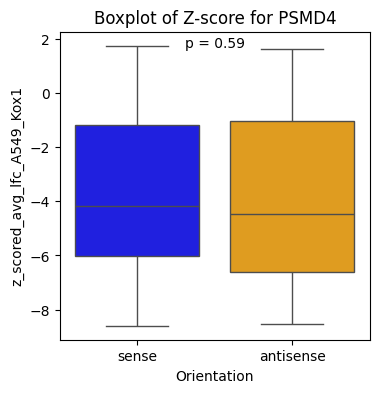

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


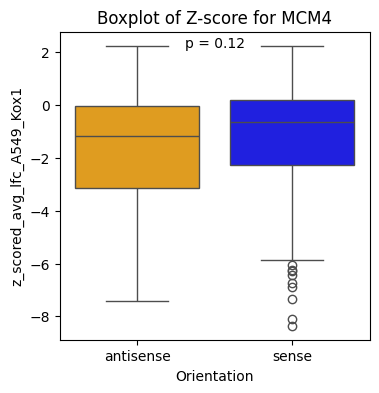

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


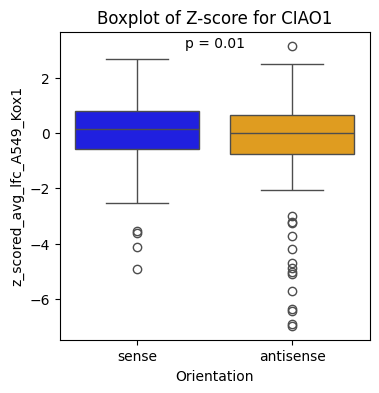

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


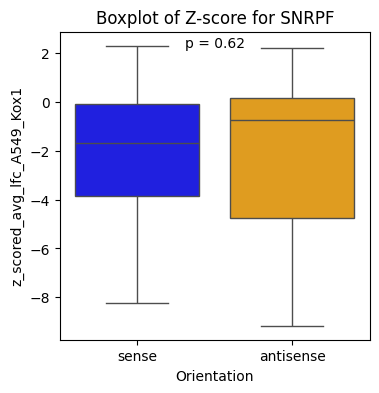

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


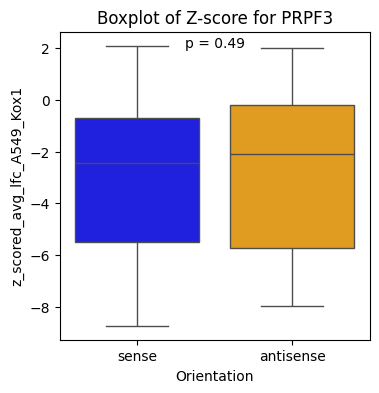

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


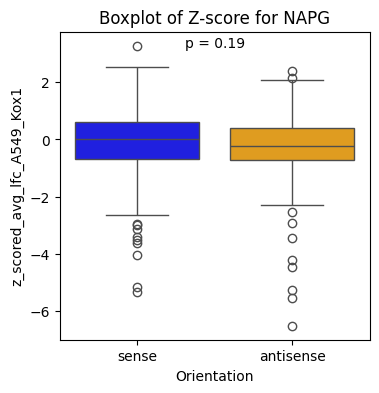

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


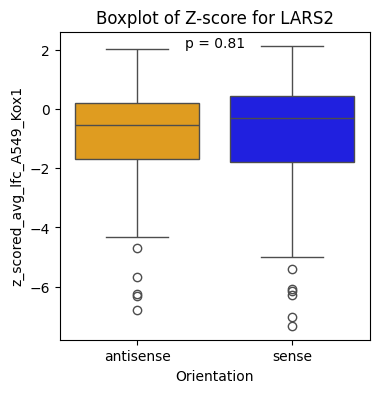

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


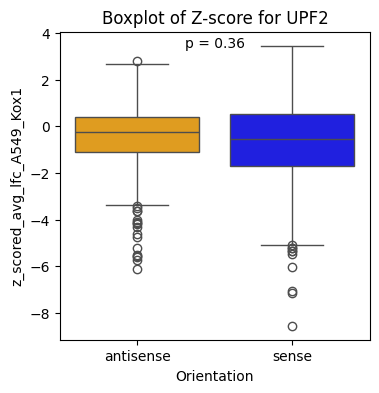

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


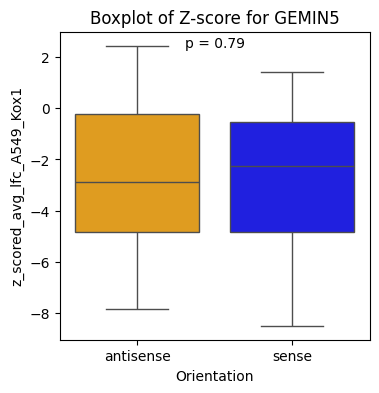

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


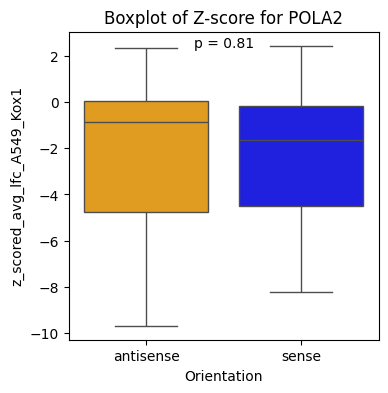

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


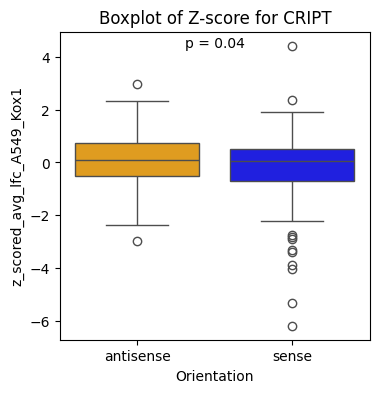

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


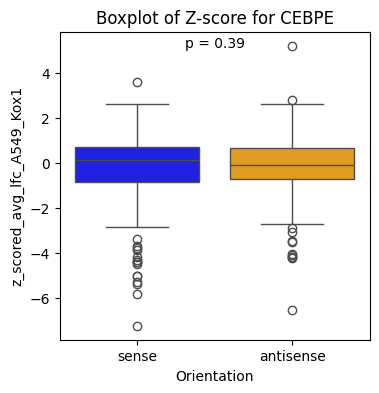

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


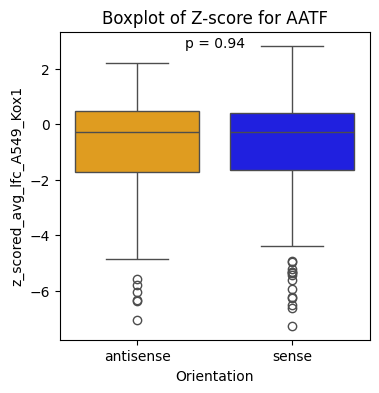

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


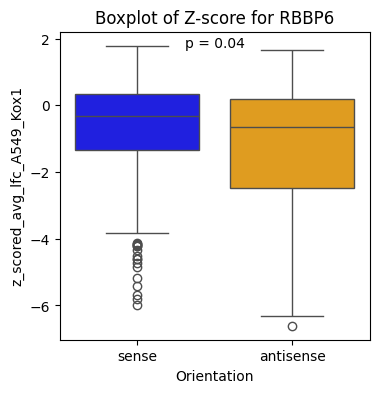

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


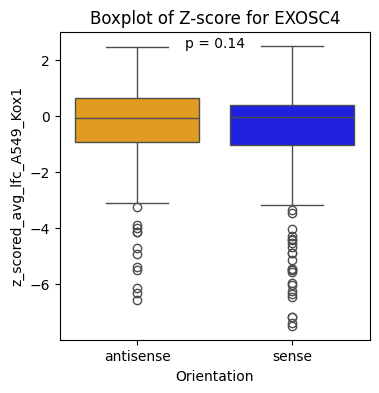

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


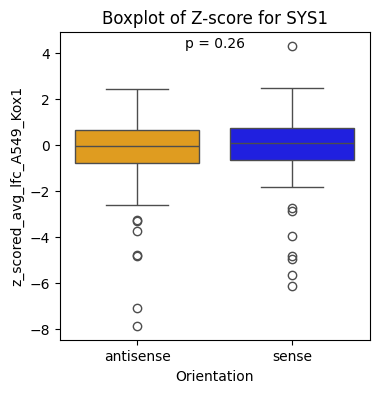

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


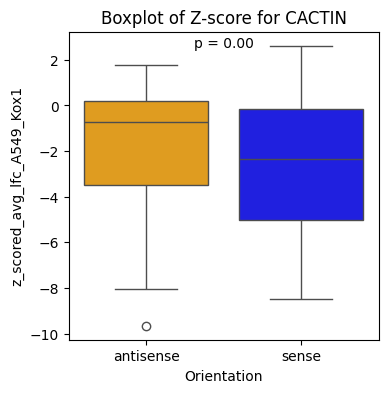

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


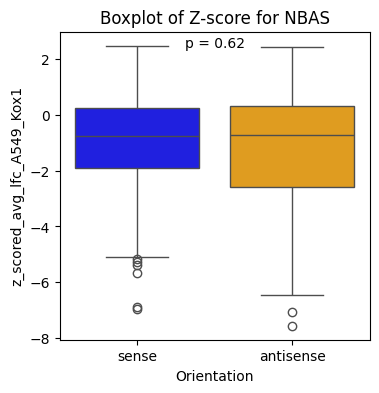

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


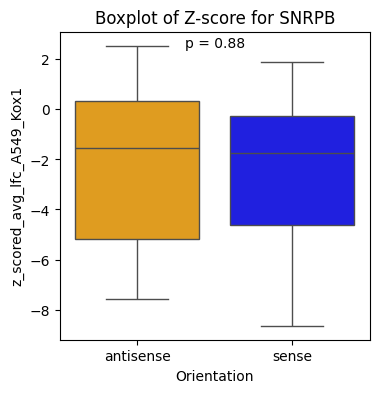

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


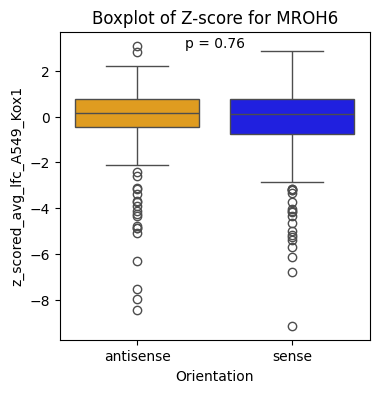

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


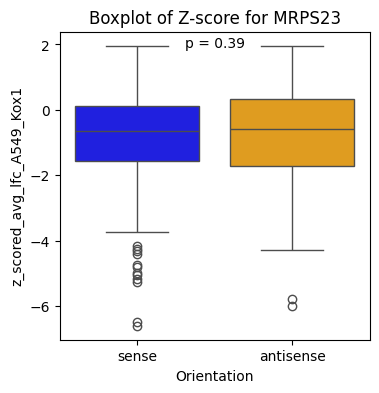

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


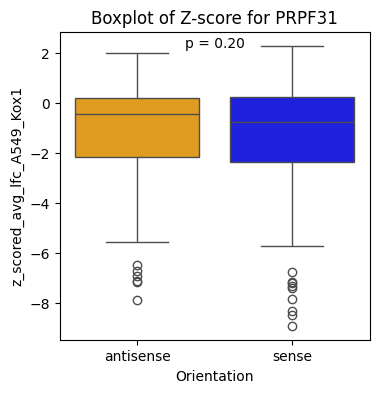

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


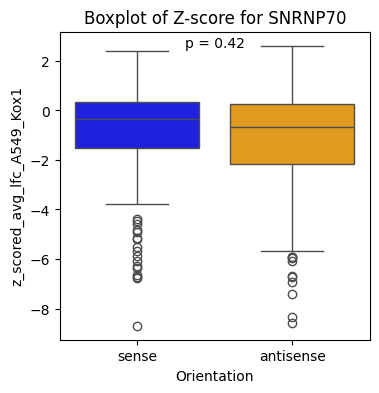

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


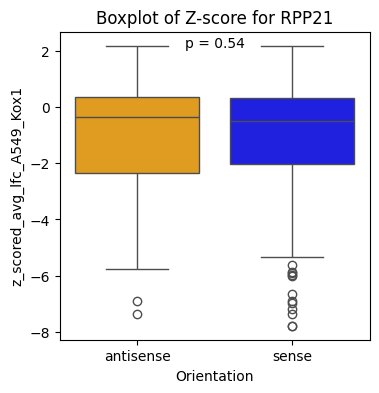

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


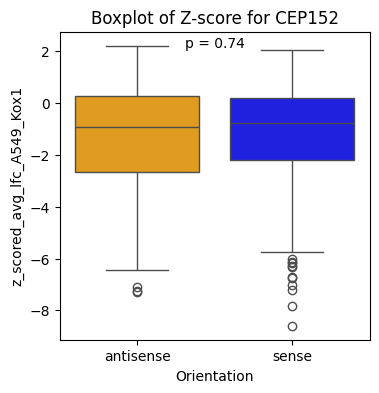

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


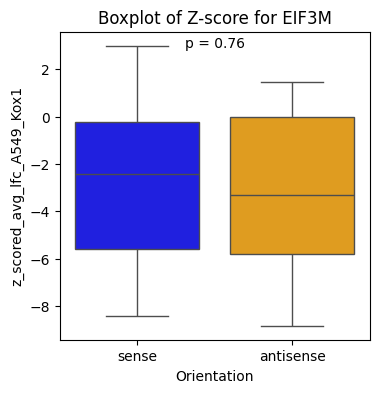

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


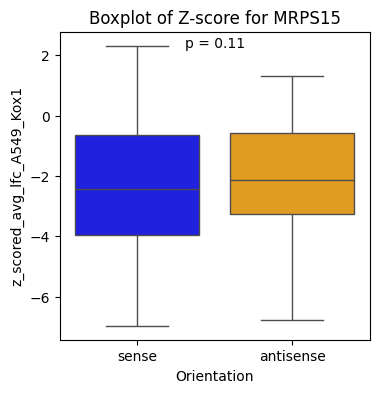

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


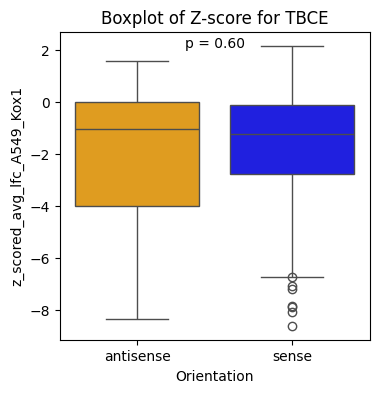

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


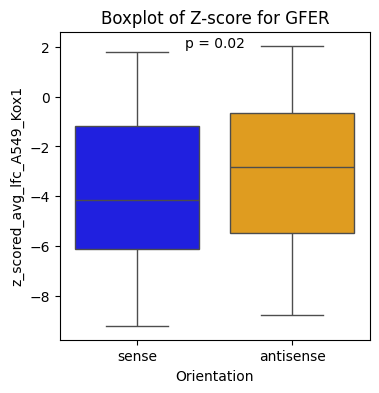

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


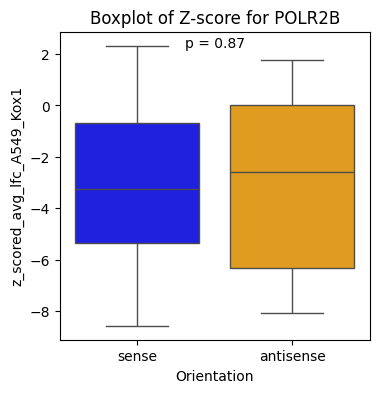

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


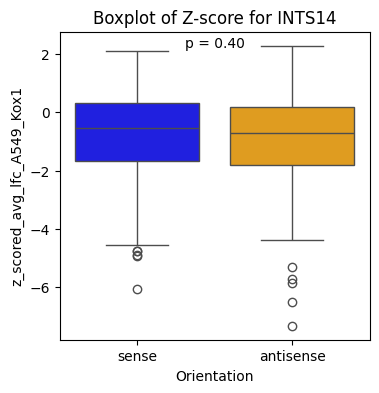

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


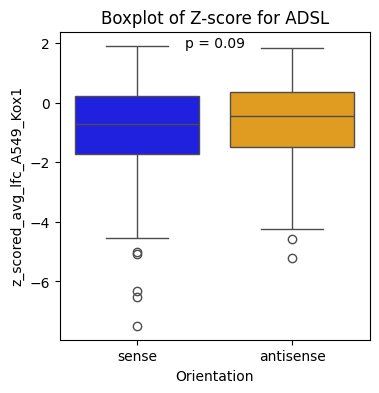

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


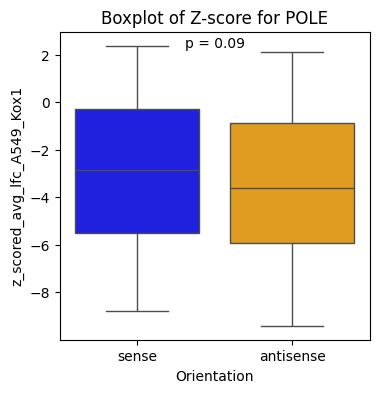

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


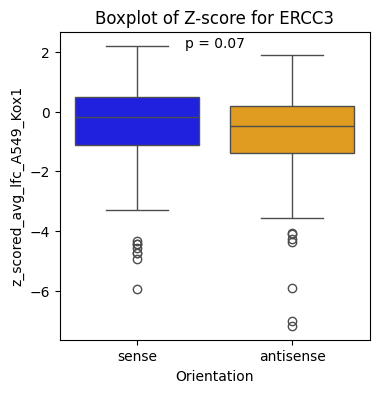

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


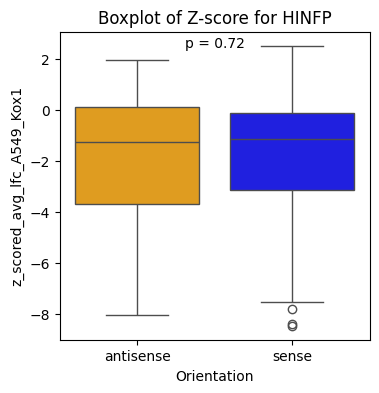

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


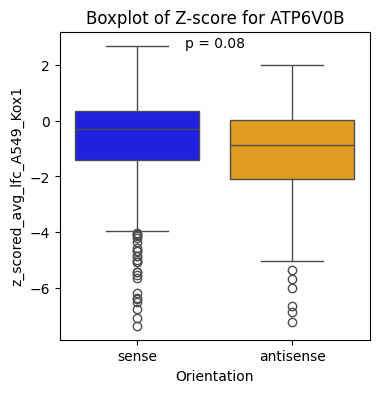

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


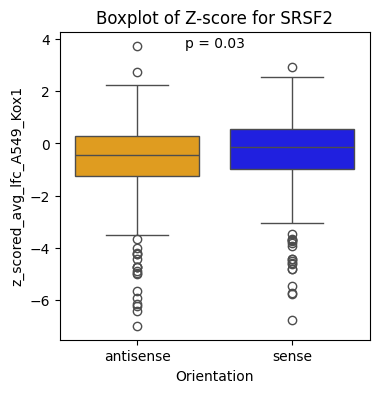

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


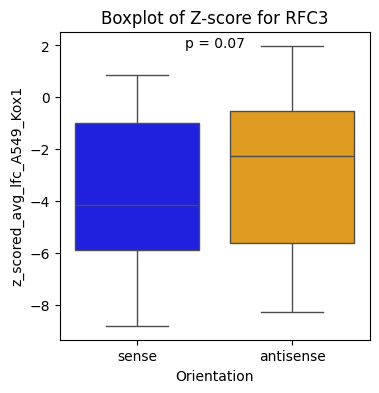

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


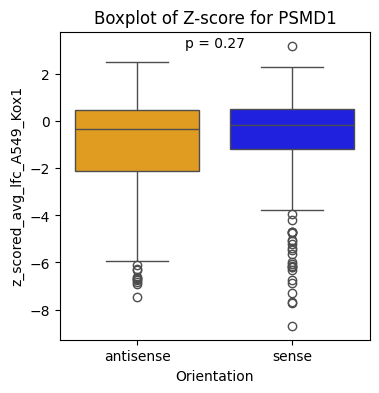

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


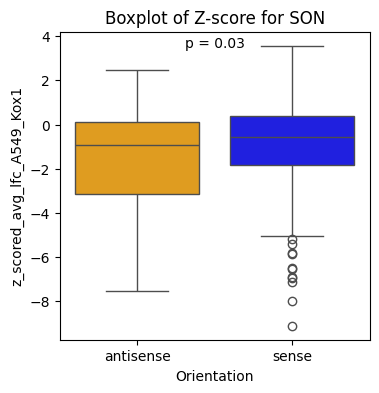

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


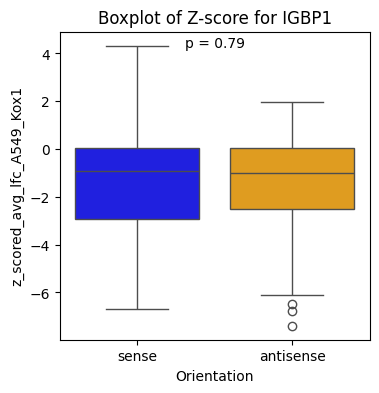

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


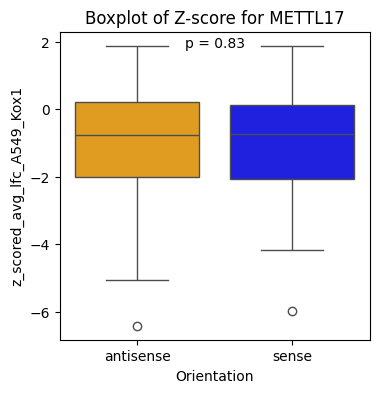

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


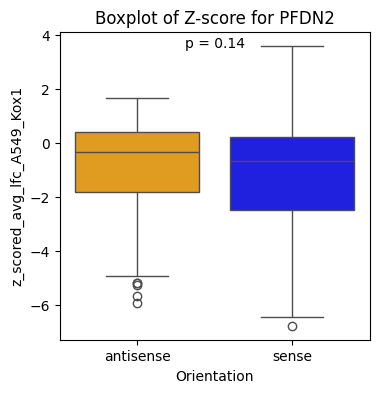

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


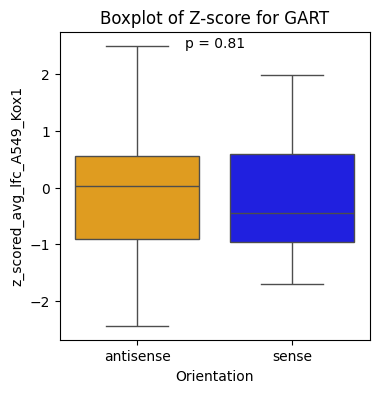

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


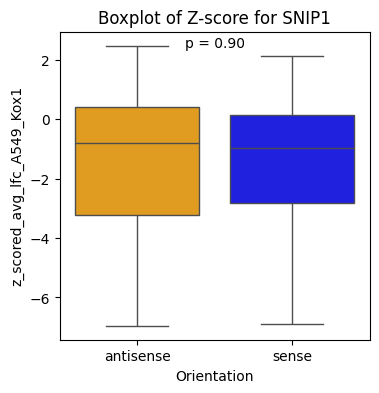

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


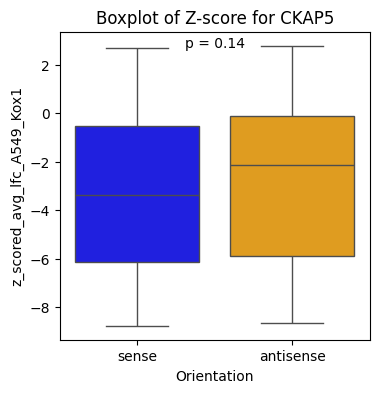

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


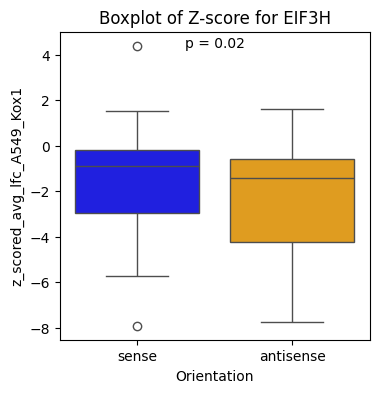

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


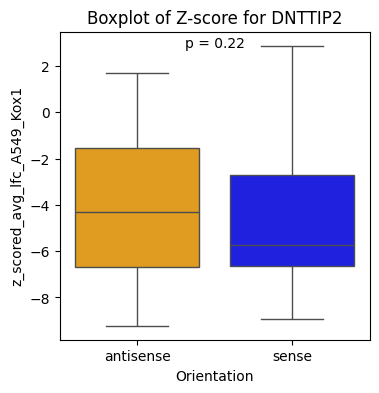

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


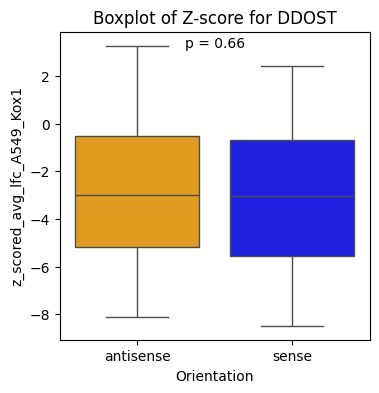

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


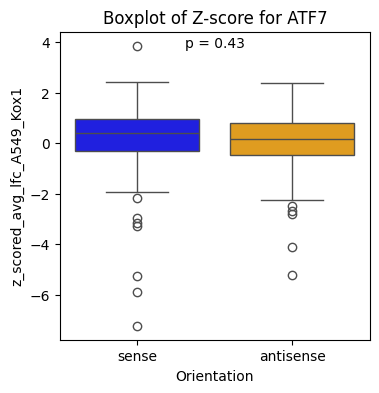

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


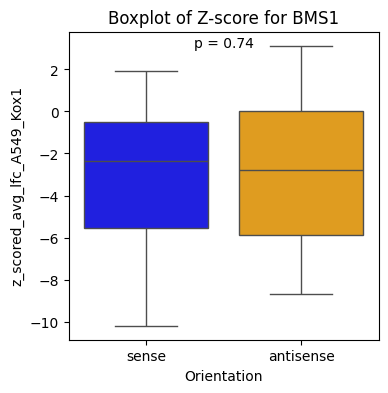

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


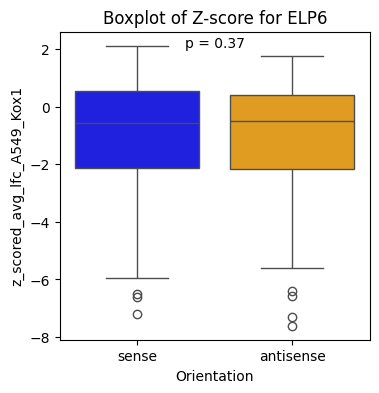

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


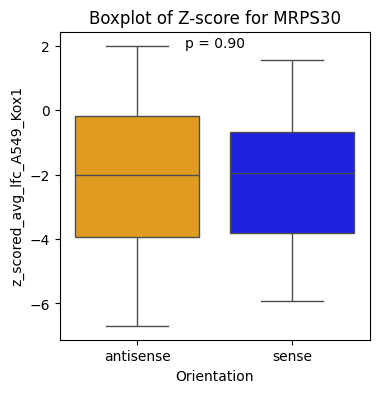

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


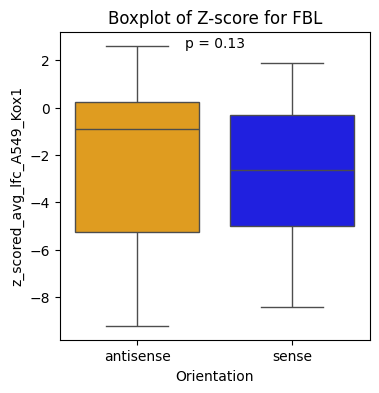

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


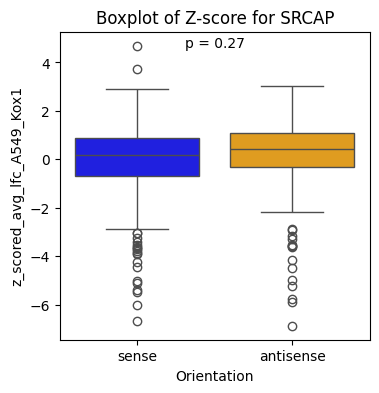

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


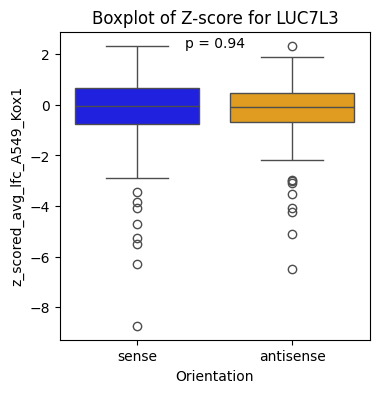

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


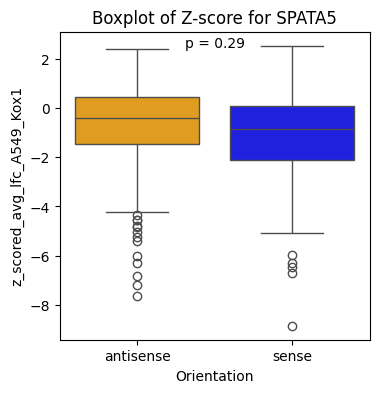

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


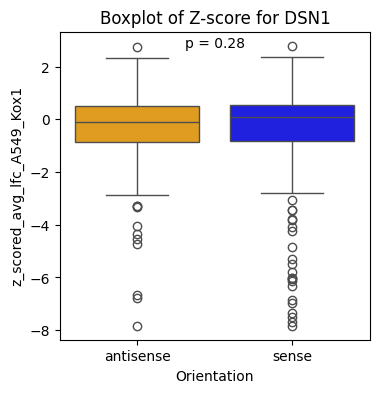

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


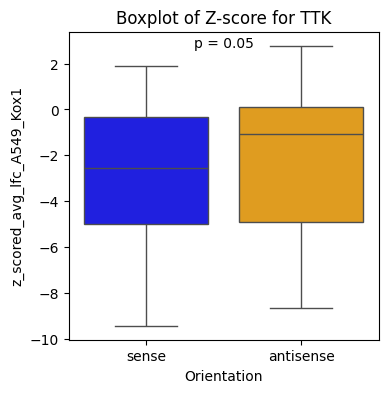

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


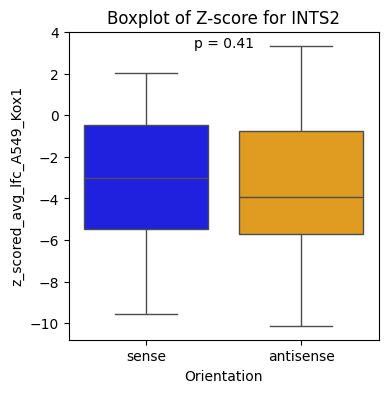

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


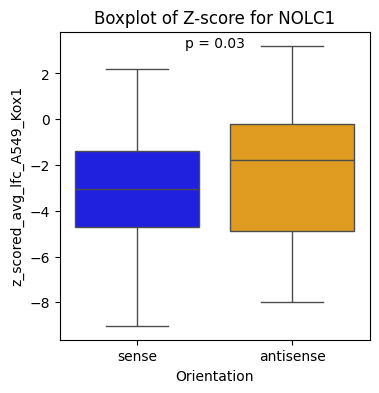

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


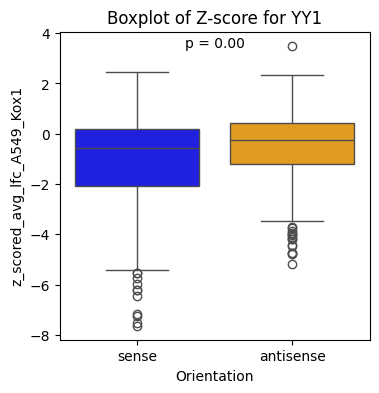

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


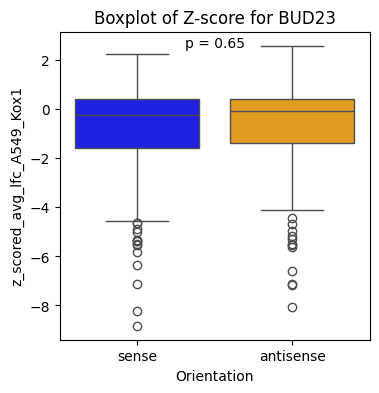

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


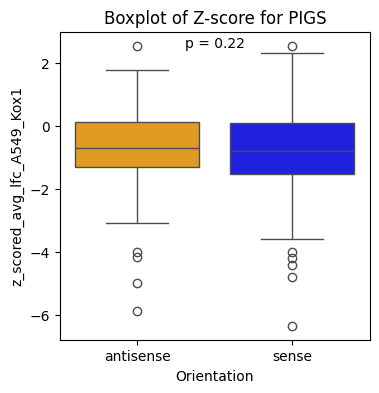

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


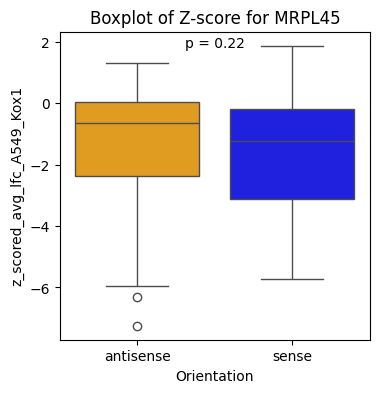

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


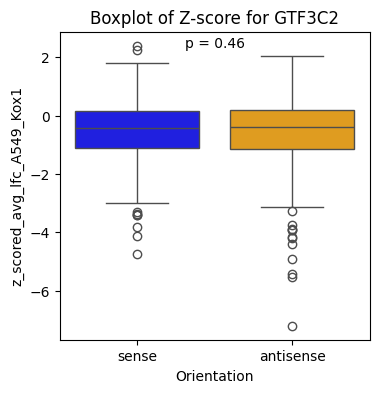

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


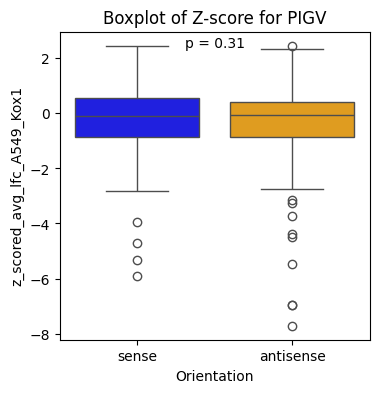

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


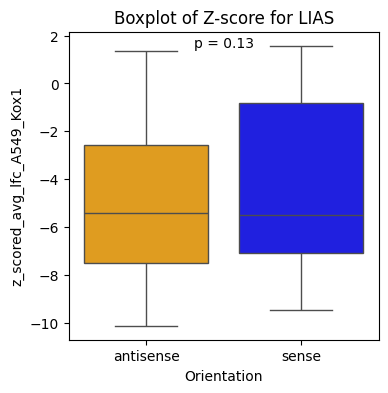

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


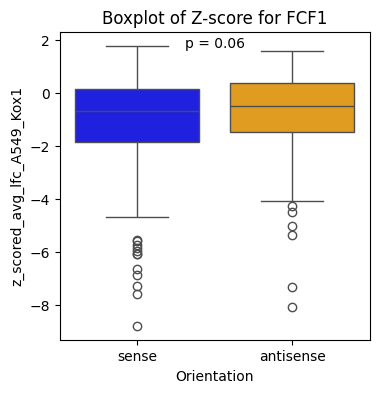

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


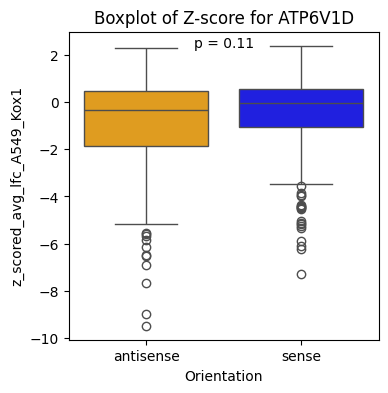

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


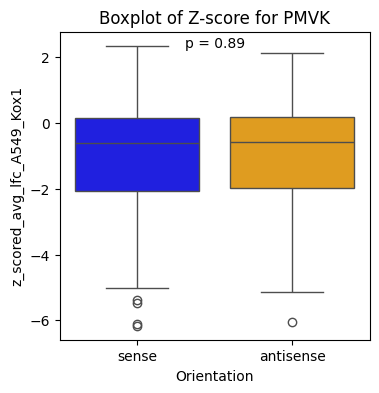

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


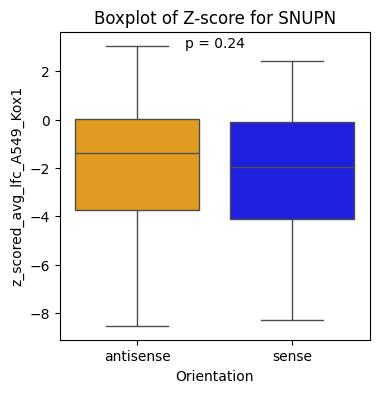

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


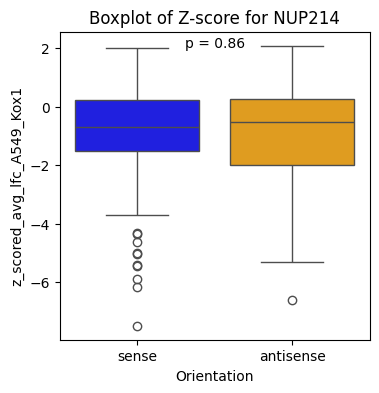

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


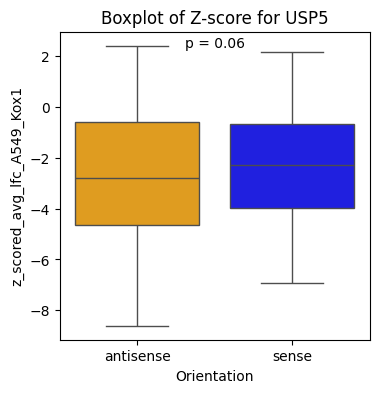

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


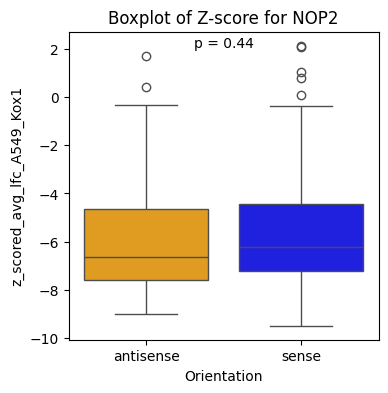

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


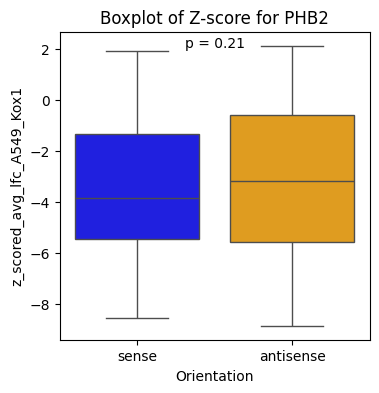

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


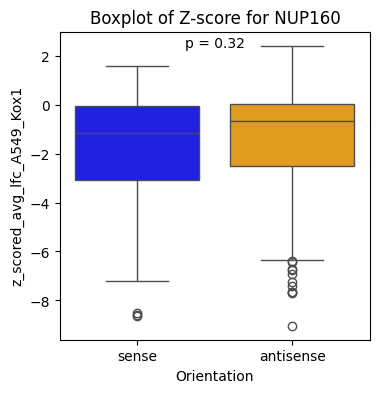

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


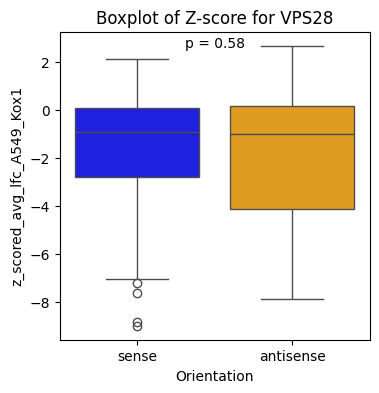

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


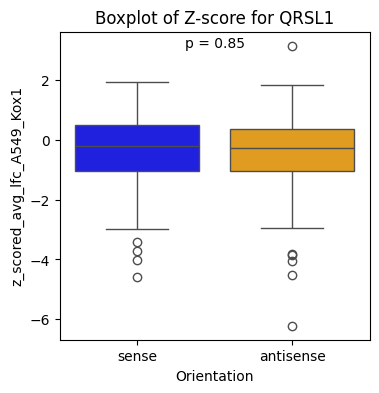

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


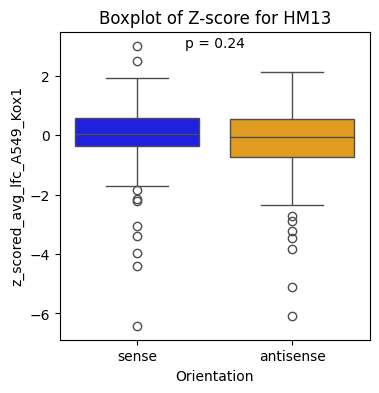

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


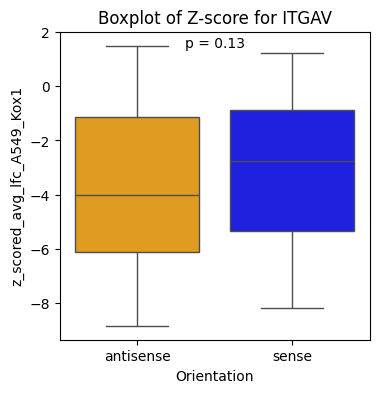

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


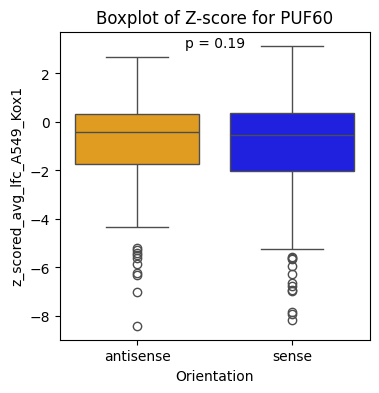

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


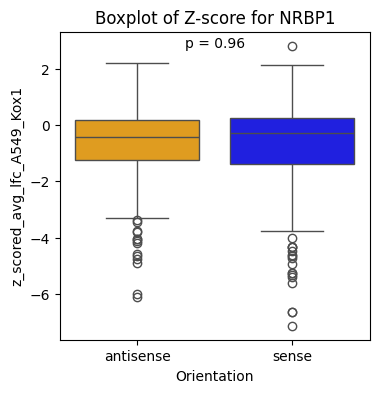

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


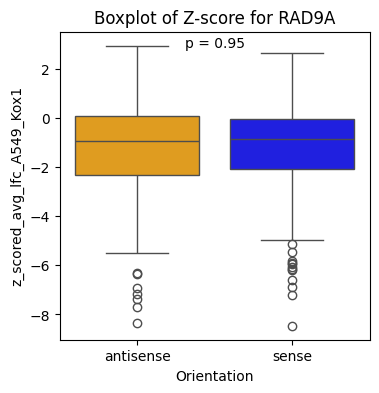

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


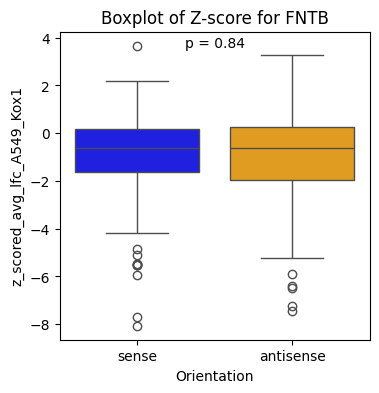

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


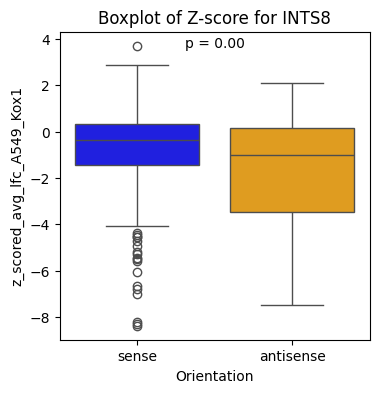

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


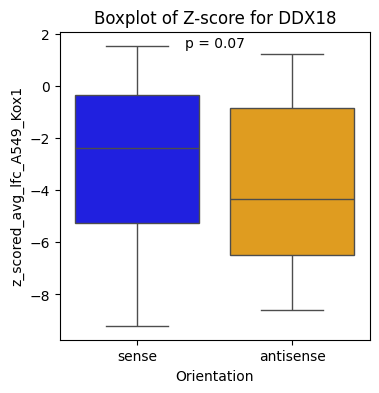

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


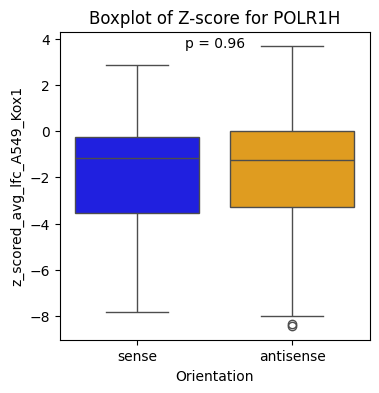

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


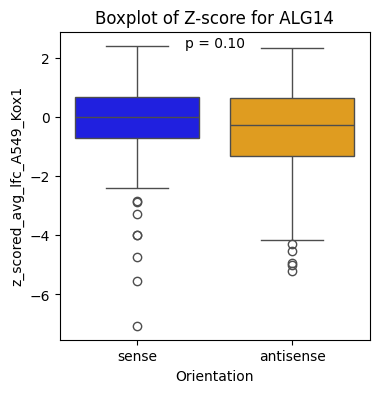

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


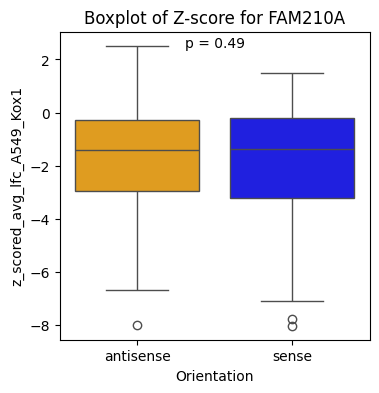

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


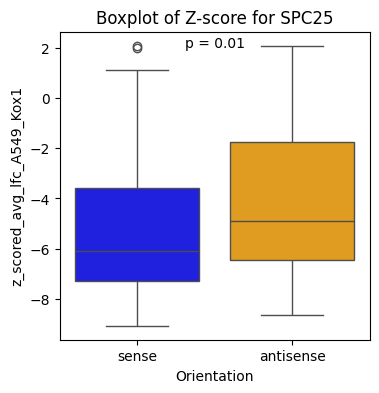

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


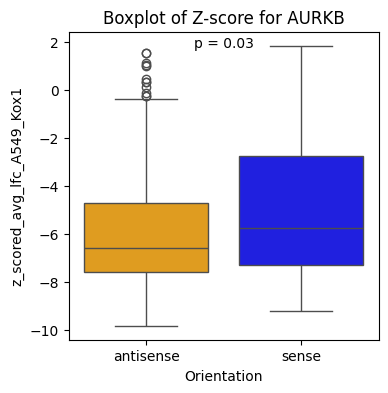

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


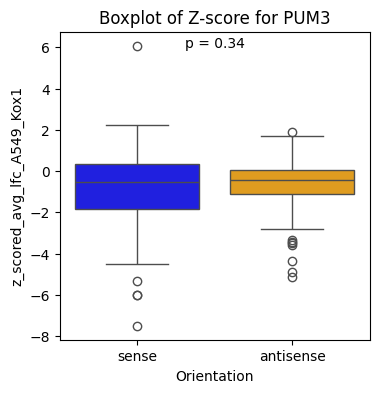

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


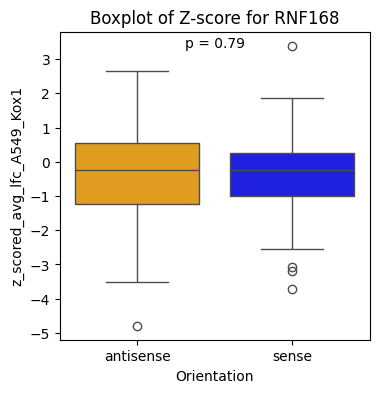

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


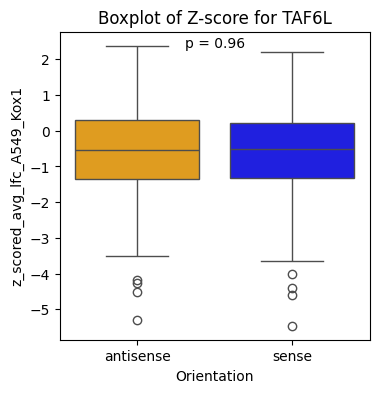

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


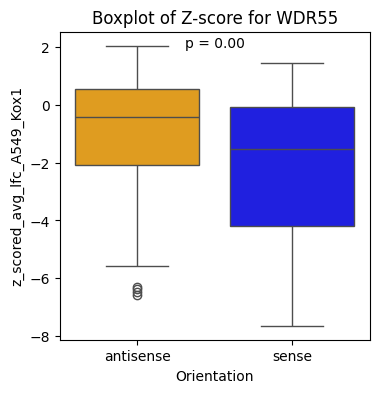

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


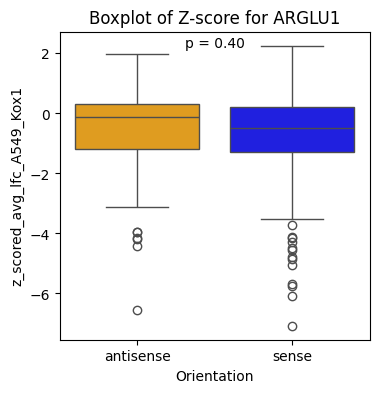

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


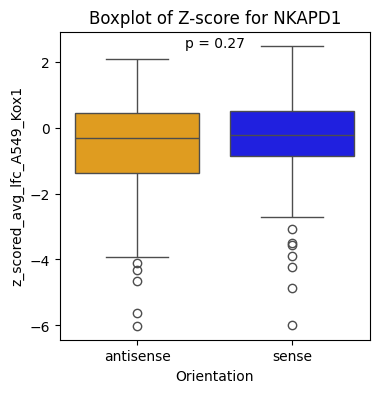

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


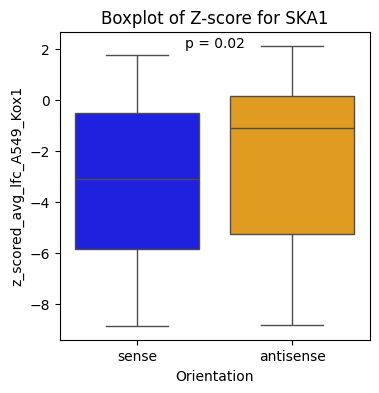

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


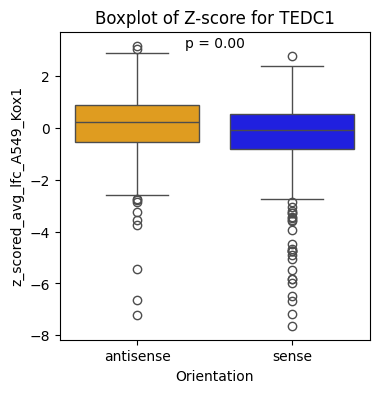

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


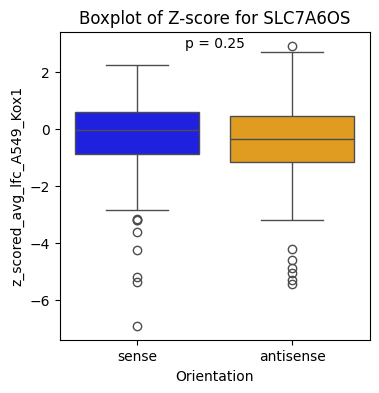

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


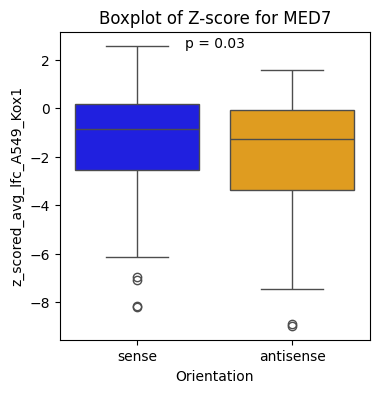

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


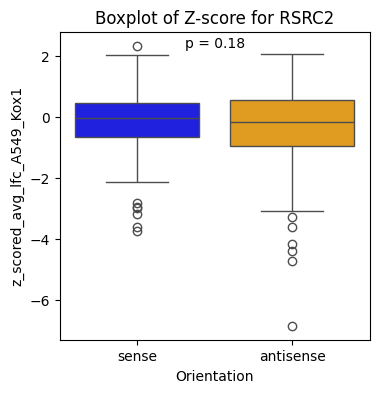

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


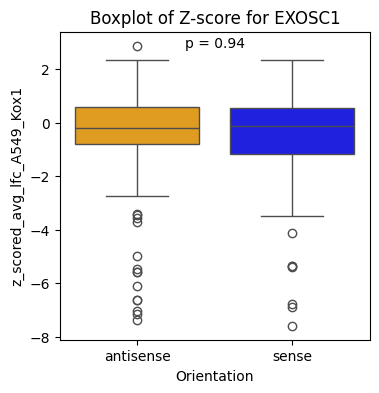

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


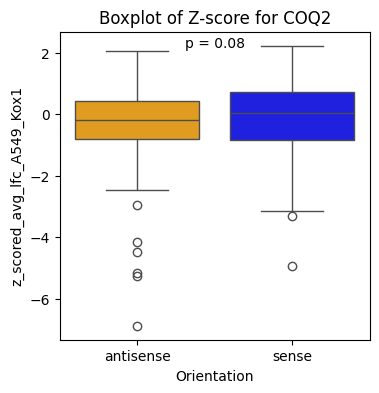

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


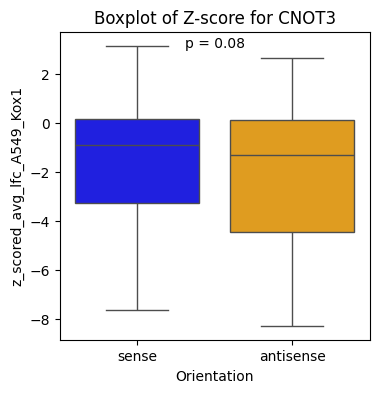

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


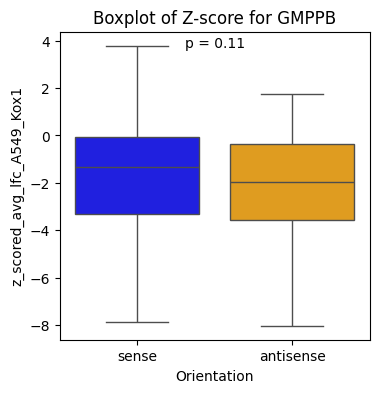

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


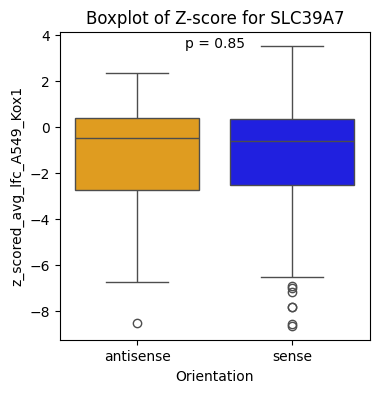

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


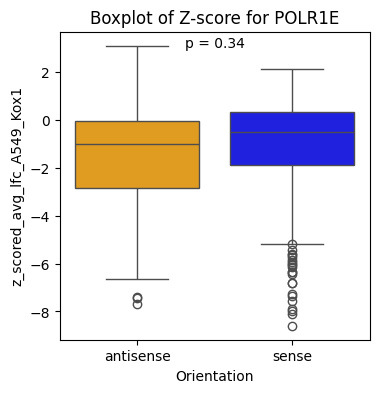

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


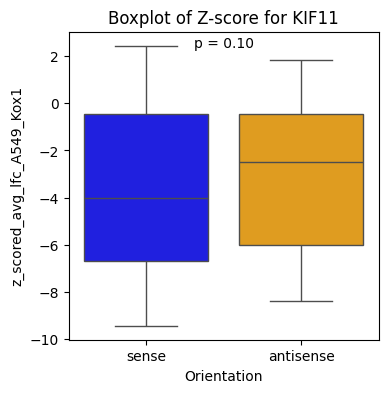

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


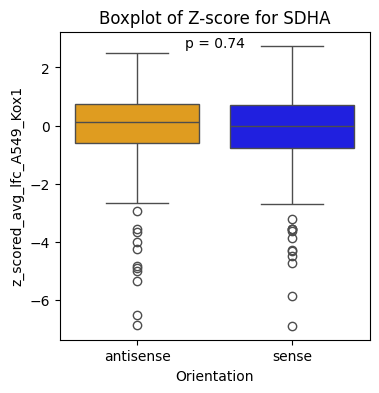

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


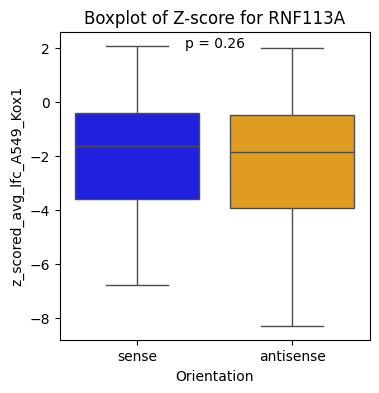

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


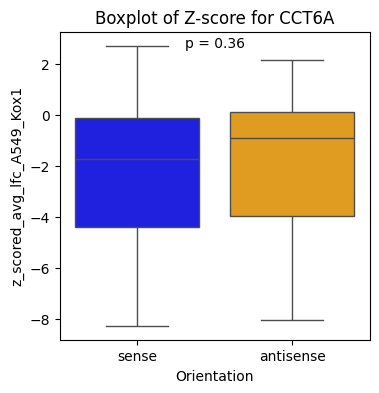

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


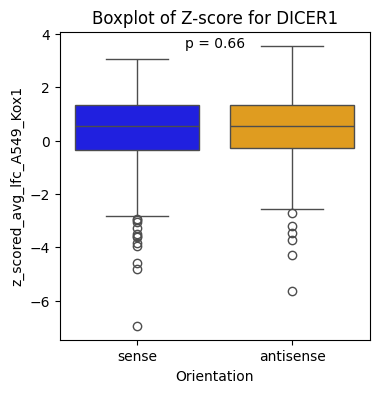

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


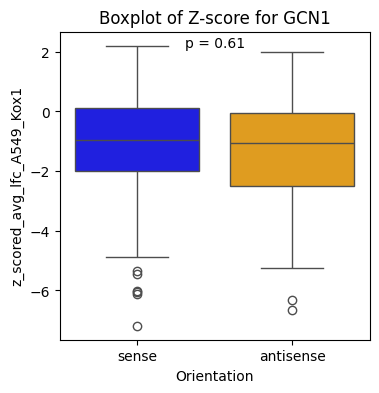

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


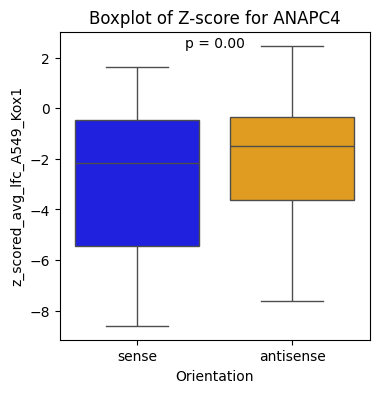

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


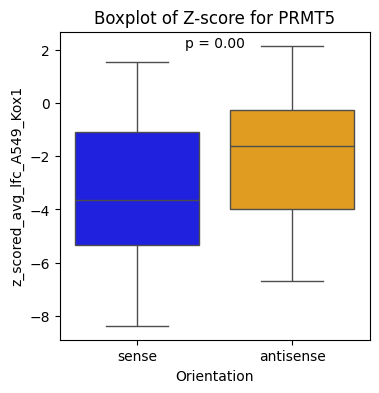

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


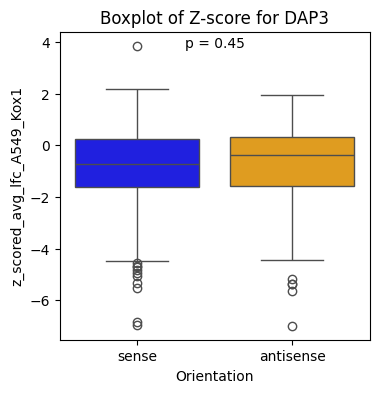

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


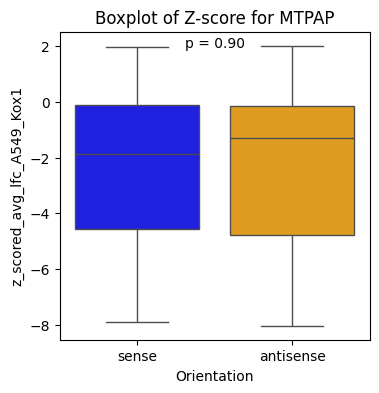

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


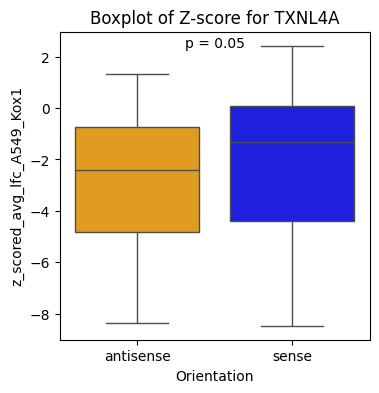

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


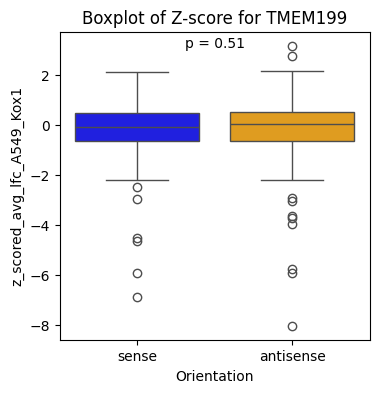

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


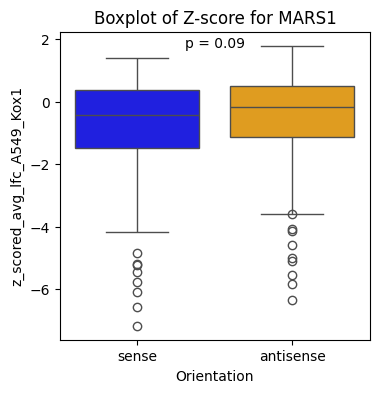

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


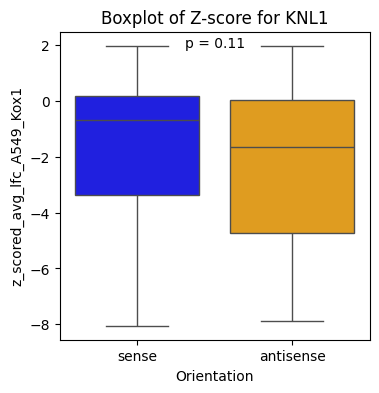

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


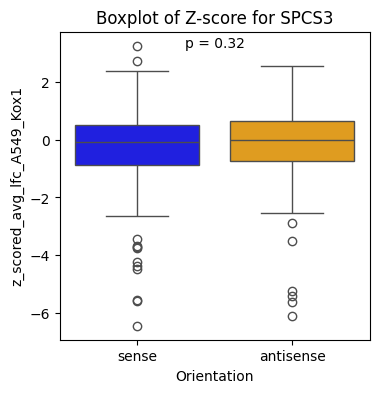

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


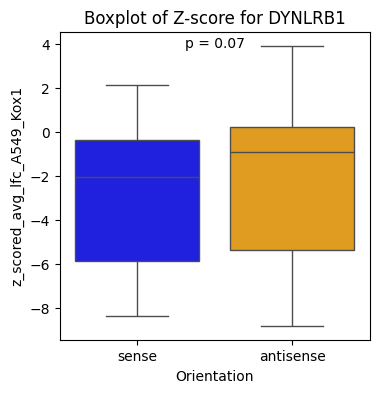

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


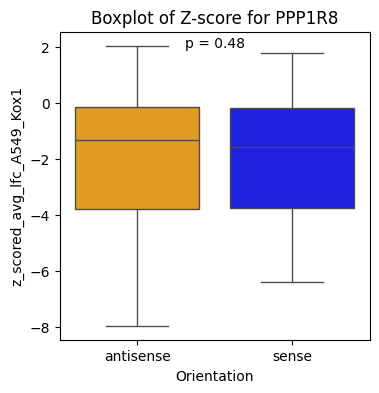

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


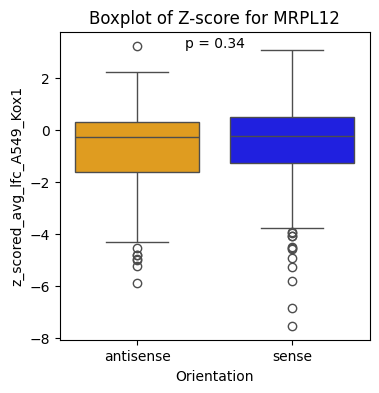

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


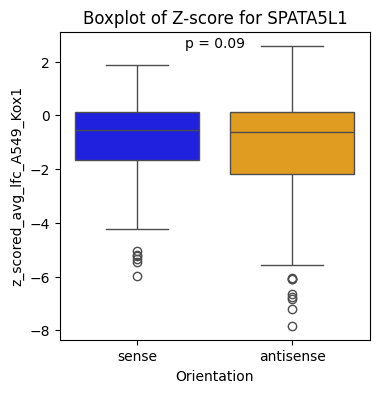

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


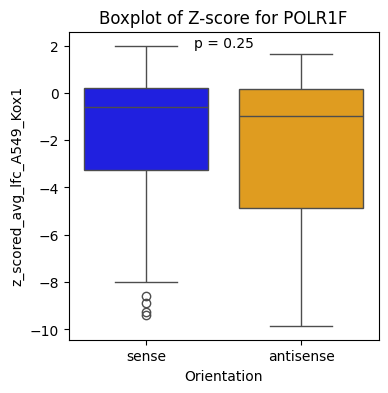

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


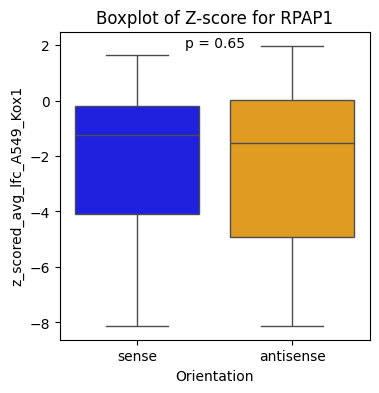

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


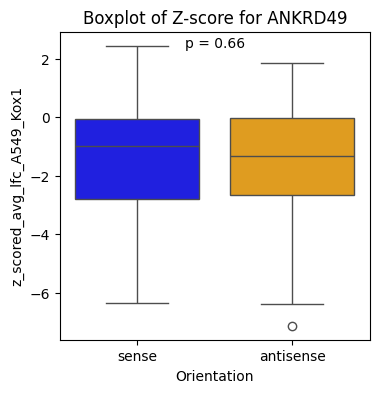

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


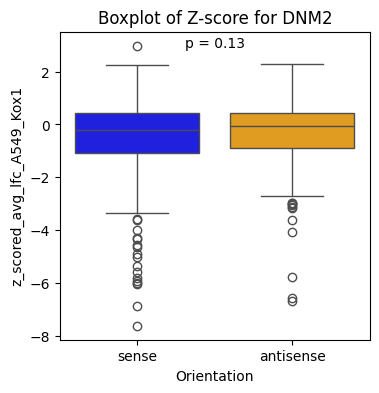

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


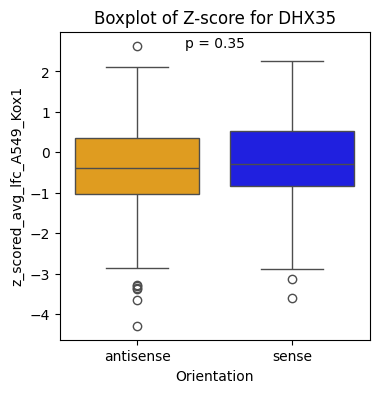

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


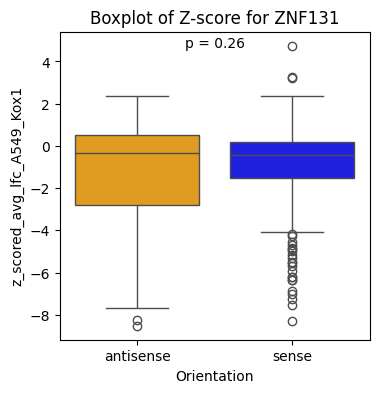

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


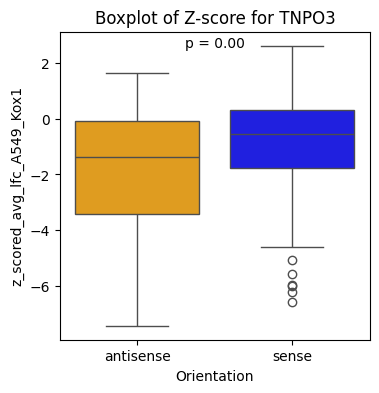

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


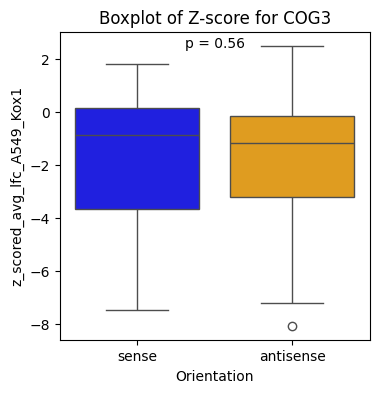

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


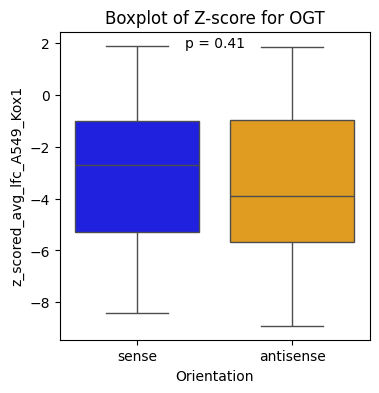

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


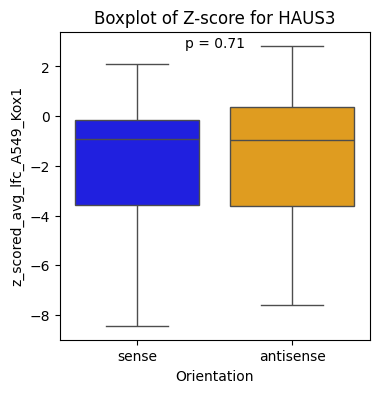

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


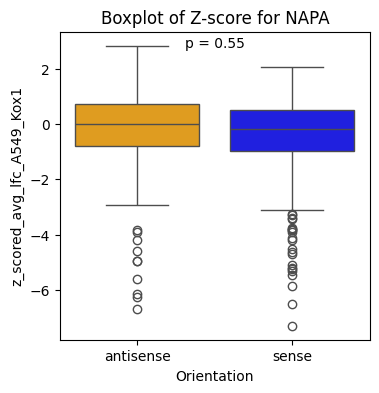

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


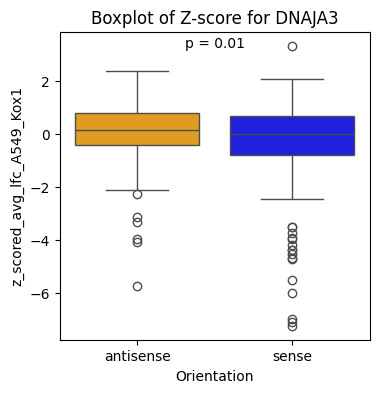

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


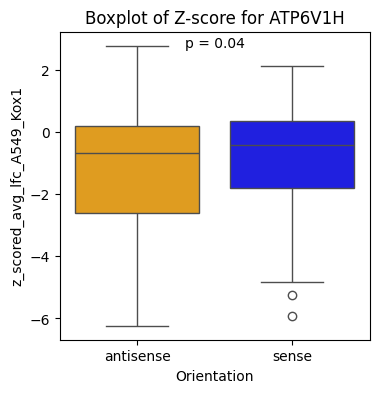

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


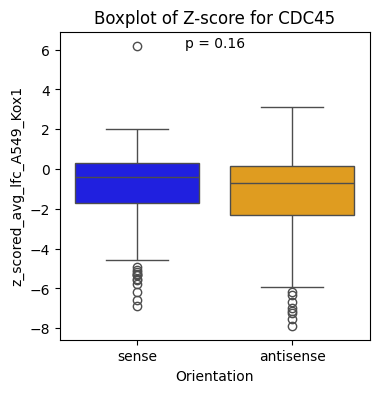

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


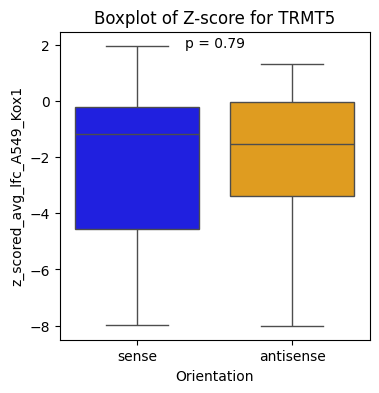

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


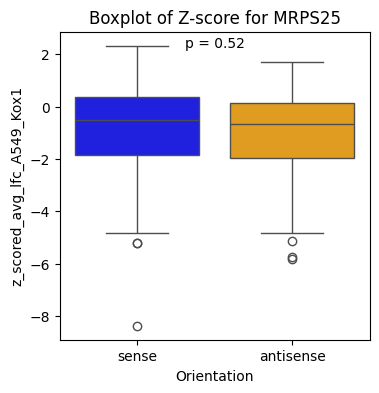

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


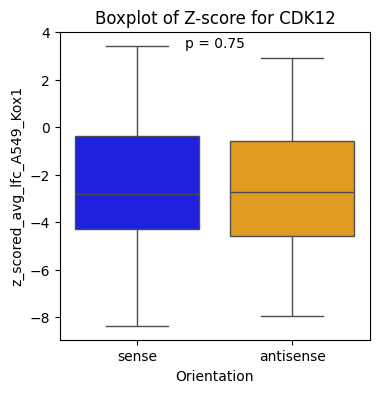

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


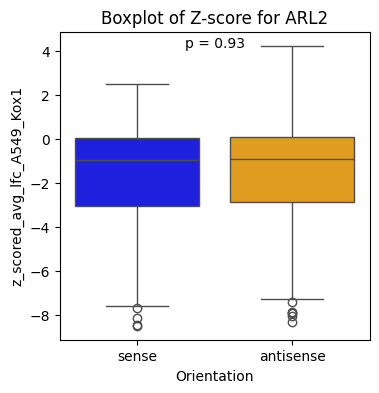

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


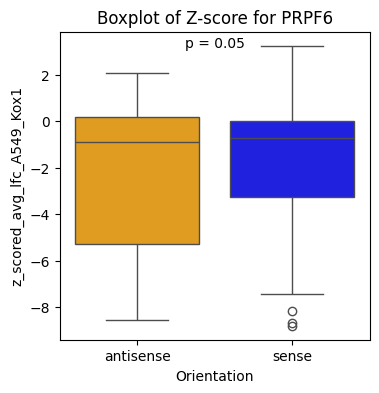

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


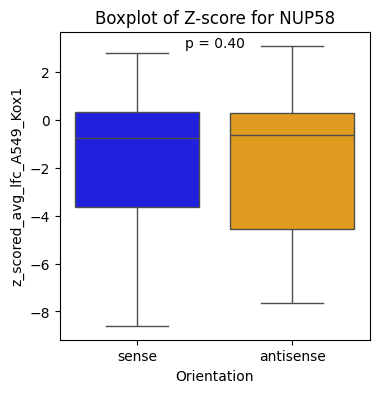

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


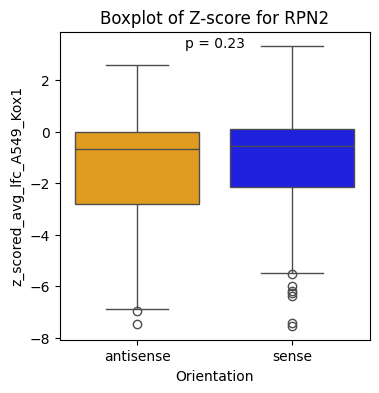

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


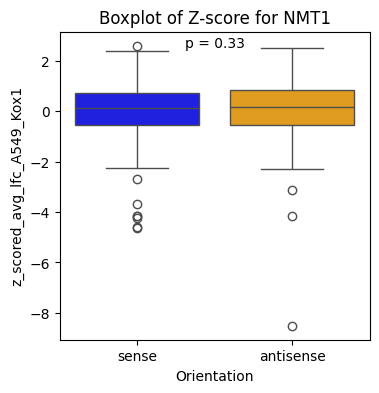

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


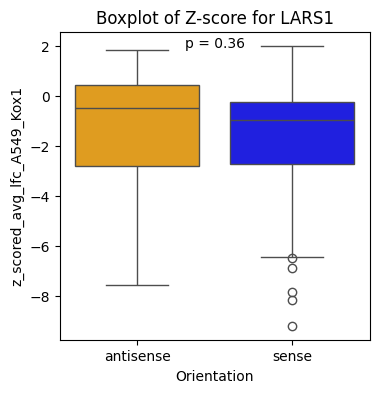

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


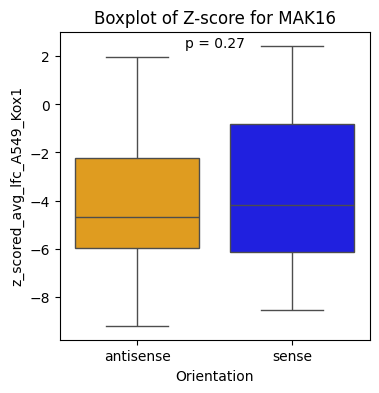

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


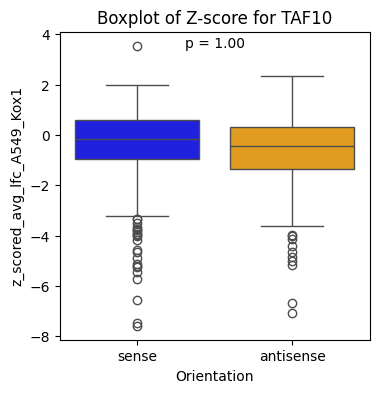

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


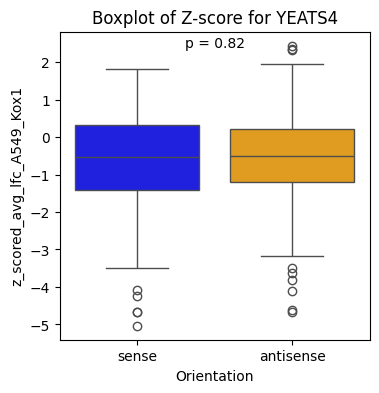

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


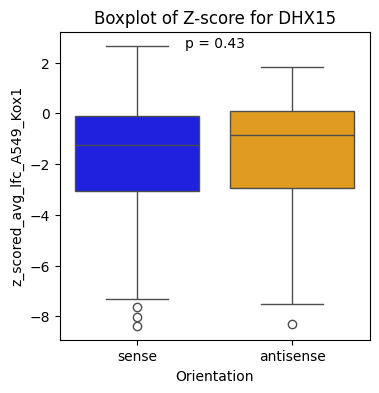

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


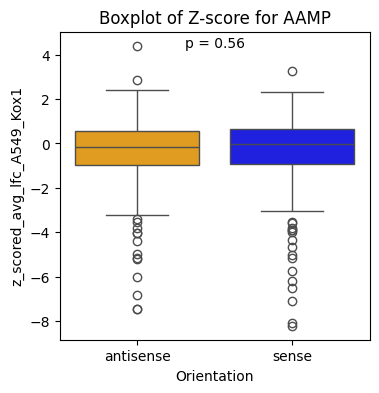

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


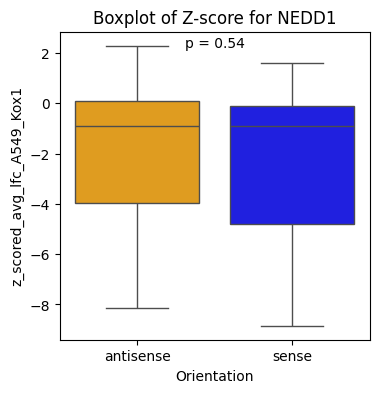

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


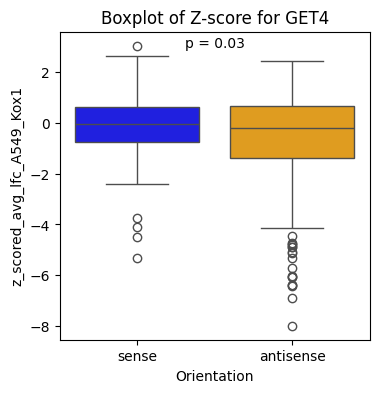

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


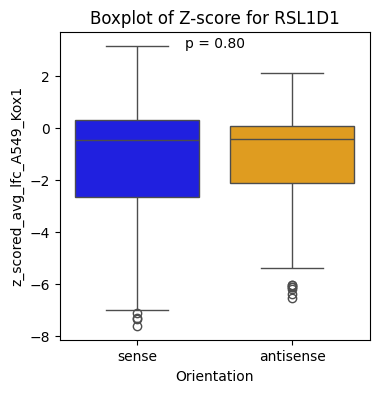

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


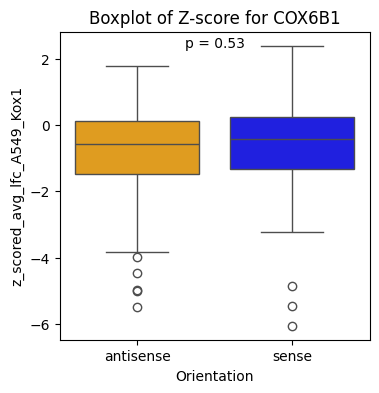

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


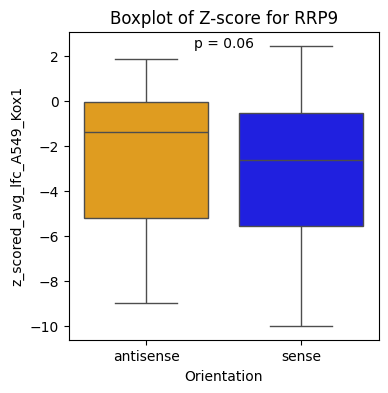

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


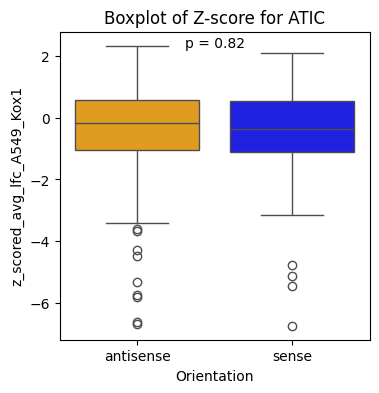

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


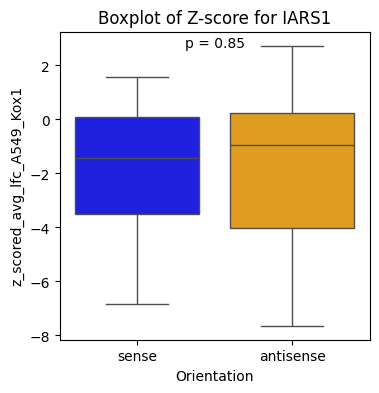

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


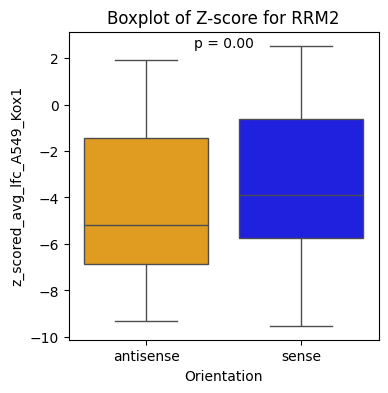

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


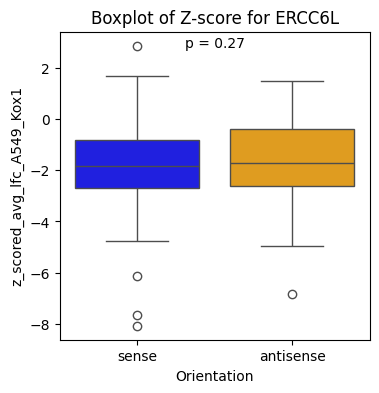

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


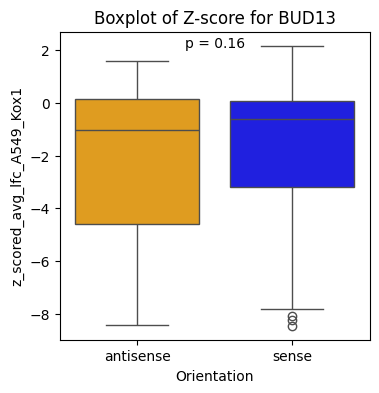

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


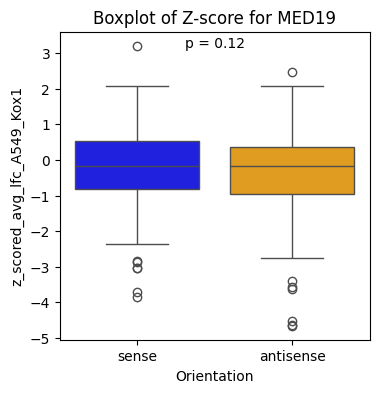

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


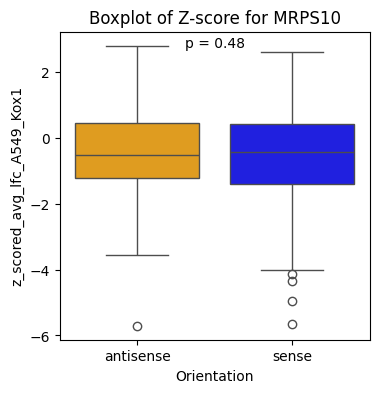

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


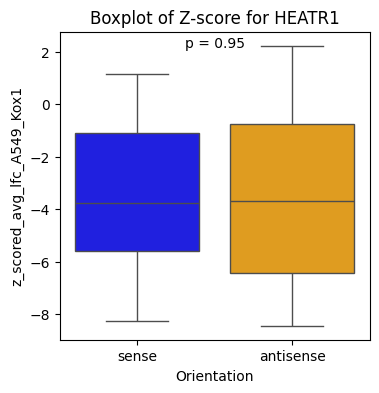

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


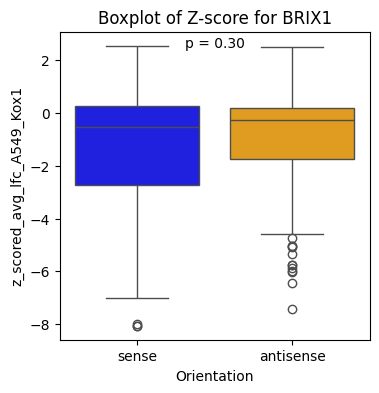

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


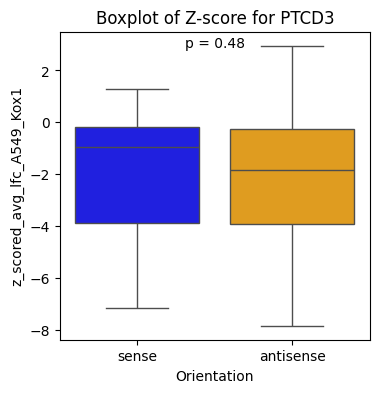

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


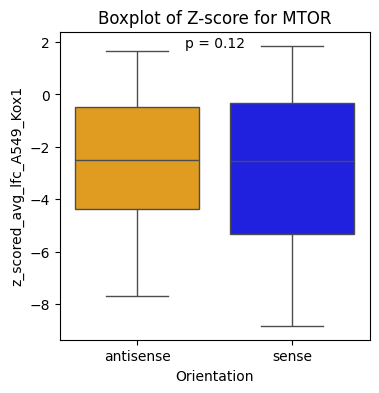

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


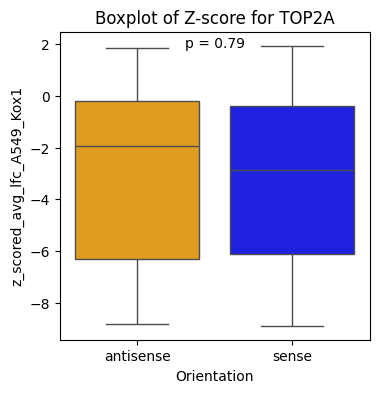

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


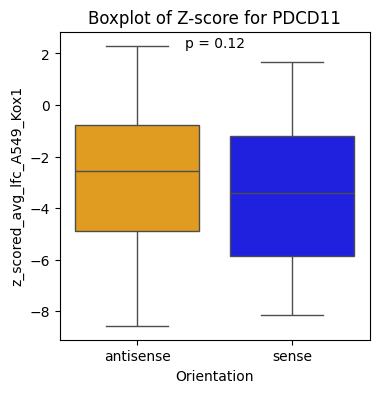

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


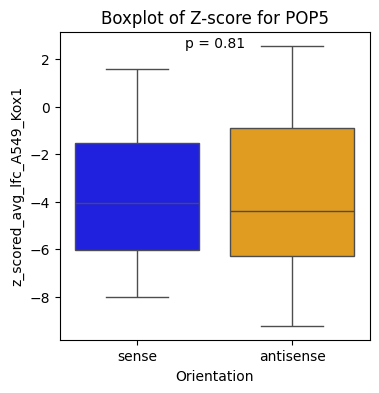

/var/folders/mj/lhpd16ys0cx2wkbhm7s0nfcm0000gp/T/ipykernel_34213/570305281.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orientation', y=phenotype_col, data=subset_df, palette={"sense": "blue", "antisense": "orange"})


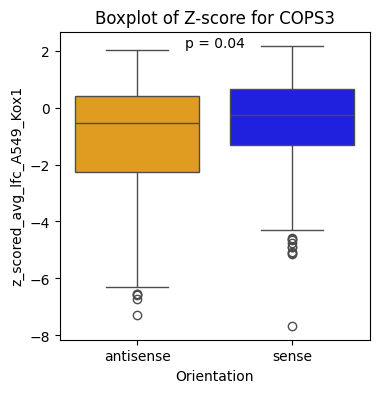

In [13]:
pvalue_A549_Kox1 = orientation_comparison(ess_merged_df_guide_orientation,'z_scored_avg_lfc_A549_Kox1')

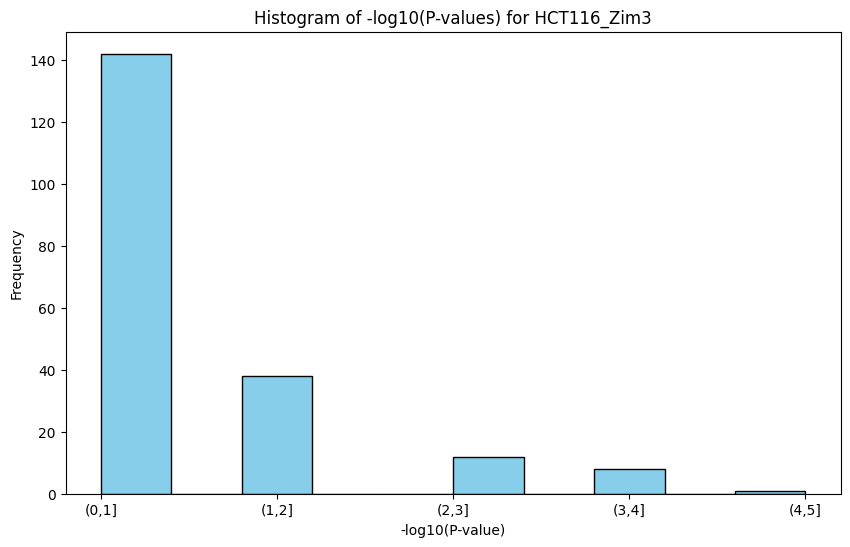

In [14]:
# Plotting histogram of -log10(p-values)
plt.figure(figsize=(10, 6))
plt.hist(pvalue_HCT116_Zim3['Category'], color='skyblue', edgecolor='black')
plt.xlabel('-log10(P-value)')
plt.ylabel('Frequency')
plt.title('Histogram of -log10(P-values) for HCT116_Zim3')
plt.show()


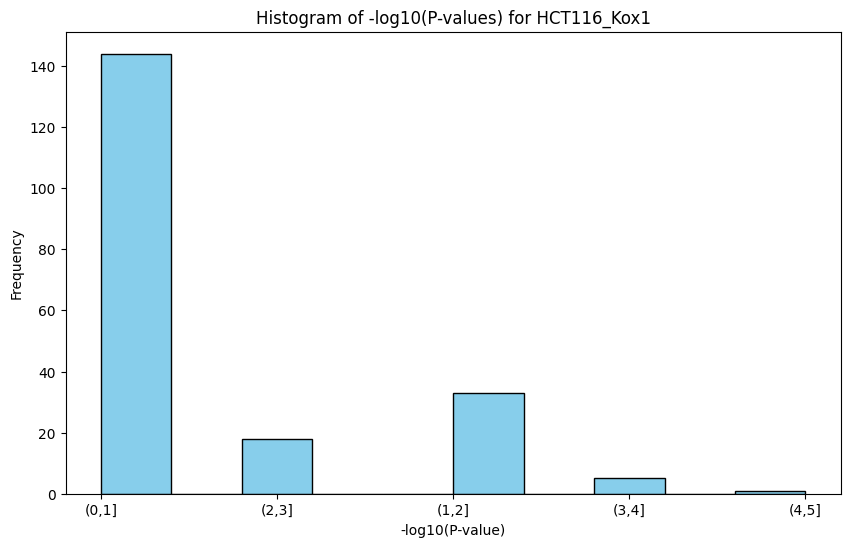

In [15]:
# Plotting histogram of -log10(p-values)
plt.figure(figsize=(10, 6))
plt.hist(pvalue_HCT116_Kox1['Category'], color='skyblue', edgecolor='black')
plt.xlabel('-log10(P-value)')
plt.ylabel('Frequency')
plt.title('Histogram of -log10(P-values) for HCT116_Kox1')
plt.show()


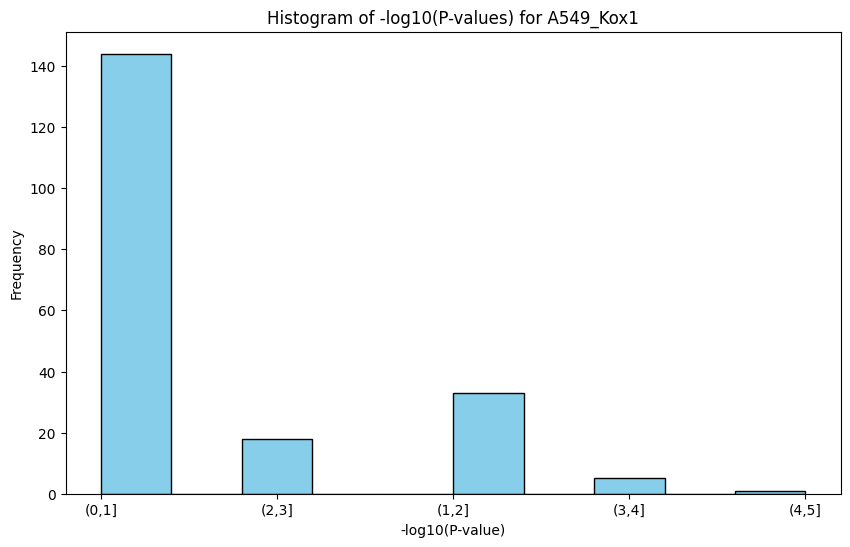

In [16]:
# Plotting histogram of -log10(p-values)
plt.figure(figsize=(10, 6))
plt.hist(pvalue_HCT116_Kox1['Category'], color='skyblue', edgecolor='black')
plt.xlabel('-log10(P-value)')
plt.ylabel('Frequency')
plt.title('Histogram of -log10(P-values) for A549_Kox1')
plt.show()


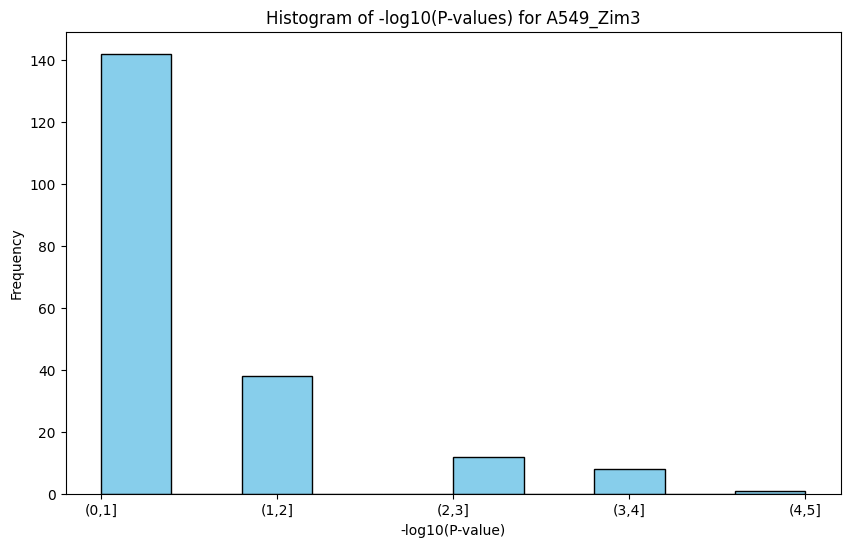

In [17]:
# Plotting histogram of -log10(p-values)
plt.figure(figsize=(10, 6))
plt.hist(pvalue_HCT116_Zim3['Category'], color='skyblue', edgecolor='black')
plt.xlabel('-log10(P-value)')
plt.ylabel('Frequency')
plt.title('Histogram of -log10(P-values) for A549_Zim3')
plt.show()


In [18]:
pvalue_HCT116_Zim3['Type'] = 'HCT116_Zim3'
pvalue_HCT116_Kox1['Type'] = 'HCT116_Kox1'
pvalue_A549_Zim3['Type'] = 'A549_Zim3'
pvalue_A549_Kox1['Type'] = 'A549_Kox1'


In [19]:
pvalue_df = pd.concat([pvalue_HCT116_Zim3, pvalue_HCT116_Kox1, pvalue_A549_Zim3, pvalue_A549_Kox1])



In [20]:
pvalue_df[pvalue_df.Category != '(0,1]'].Type.value_counts()

Type
HCT116_Zim3    59
HCT116_Kox1    57
A549_Zim3      51
A549_Kox1      47
Name: count, dtype: int64

In [21]:
sum(pvalue_df[pvalue_df.Category != '(0,1]'].gene.value_counts() == 4)

23

In [22]:
pvalue_A549_Kox1[pvalue_A549_Kox1.Category != '(0,1]']

,gene,P-value,-log10(P-value),Category,Type
1,ILK,0.036680,1.435569,"(1,2]",A549_Kox1
11,POLR2I,0.052994,1.275774,"(1,2]",A549_Kox1
22,SEH1L,0.057947,1.236966,"(1,2]",A549_Kox1
27,CIAO1,0.006653,2.176975,"(2,3]",A549_Kox1
35,CRIPT,0.039193,1.406794,"(1,2]",A549_Kox1
38,RBBP6,0.043572,1.360797,"(1,2]",A549_Kox1
41,CACTIN,0.002204,2.656753,"(2,3]",A549_Kox1
53,GFER,0.019698,1.705570,"(1,2]",A549_Kox1
56,ADSL,0.090905,1.041414,"(1,2]",A549_Kox1
57,POLE,0.089077,1.050233,"(1,2]",A549_Kox1


In [23]:
pvalue_A549_Zim3[pvalue_A549_Zim3.Category != '(0,1]']

,gene,P-value,-log10(P-value),Category,Type
1,ILK,0.021435,1.668886,"(1,2]",A549_Zim3
8,RACGAP1,0.097913,1.009161,"(1,2]",A549_Zim3
14,DNLZ,0.004582,2.338936,"(2,3]",A549_Zim3
20,WEE1,0.037146,1.430084,"(1,2]",A549_Zim3
22,SEH1L,0.039784,1.400287,"(1,2]",A549_Zim3
26,MCM4,0.061028,1.214472,"(1,2]",A549_Zim3
27,CIAO1,0.004338,2.362713,"(2,3]",A549_Zim3
32,UPF2,0.078320,1.106126,"(1,2]",A549_Zim3
36,CEBPE,0.013748,1.861757,"(1,2]",A549_Zim3
38,RBBP6,0.049147,1.308503,"(1,2]",A549_Zim3


In [24]:
annot_guide_lfcs_A549_Zim3[annot_guide_lfcs_A549_Zim3.Category == 'Non-essential']['Target Gene Symbol'].value_counts()

NameError: name 'annot_guide_lfcs_A549_Zim3' is not defined

# How does Dolcetto guides perform in the CRIPSRi tiling library

In [ ]:
sanson_path = '/Users/fzheng/Library/CloudStorage/GoogleDrive-fzheng@broadinstitute.org/Shared drives/GPP Cloud /R&D/People/Fengyi/rule_set/crispri/data/2023/cleaned_crispri_datasets/'
sanson_path = '../../../../data/2023/cleaned_crispri_datasets/'
combined_cleaned_sanson = pd.read_csv(sanson_path+'sanson_2018_cleaned.csv')

In [ ]:
combined_cleaned_sanson.head()

In [ ]:
combined_cleaned_sanson['condition'].value_counts()

In [ ]:
combined_cleaned_sanson['set'].value_counts()

In [ ]:
len(combined_cleaned_sanson)

In [ ]:
# subset sanson to only reseve sanson genes that are also in cirspri tiling
sanson_essential = combined_cleaned_sanson[combined_cleaned_sanson['Annotated Gene Symbol'].\
                                           isin(ess_merged_df['Target Gene Symbol'])]


In [ ]:
sanson_essential['Annotated Gene Symbol'].nunique()

In [ ]:
ess_merged_df['In Dolcetto']='Unselected CRISPRi tiling guides'

ess_merged_df.loc[ess_merged_df['sgRNA Sequence'].isin(sanson_essential['sgRNA Sequence']),\
                  'In Dolcetto']='Selected in Dolcetto'


In [ ]:
sanson_essential['Target Gene Symbol'].value_counts()>11

In [ ]:
genes_in_ess_merged_df_and_sanson = ess_merged_df[ess_merged_df['In Dolcetto'] == 'Selected in Dolcetto']['Target Gene Symbol'].unique()
len(genes_in_ess_merged_df_and_sanson)


In [ ]:
len(ess_merged_df)

In [ ]:
ess_merged_df_overlap_sanson = ess_merged_df[ess_merged_df['Target Gene Symbol'].isin(genes_in_ess_merged_df_and_sanson)]

In [ ]:
ess_merged_df_overlap_sanson['In Dolcetto'].value_counts()

In [ ]:
graph_out = 'Your Path'

sns.boxplot(ess_merged_df_overlap_sanson['In Dolcetto'], ess_merged_df_overlap_sanson['z_scored_avg_lfc_HCT116_Kox1'])
plt.title(f'Guides Targeting Essential Genes')
plt.ylabel('z-score HCT116 Kox1')
plt.xlabel('')
# plt.savefig(f'{graph_out}Dolcetto in CRISPRi boxplot.png',
#                dpi=300, bbox_inches='tight')

In [ ]:
len(ess_merged_df_overlap_sanson['Target Gene Symbol'].unique())

In [ ]:
palette ={"Selected in Dolcetto": "red", "Selected by RS3": "blue",'Unselected CRISPRi tiling guides': "grey"}

# for gene in ess_merged_df_overlap_sanson['Target Gene Symbol'].unique():
#     selected_gene =  ess_merged_df[ess_merged_df['Target Gene Symbol'] == gene].sort_values('On-Target Efficacy Score' ).copy()
#     gene_num = len(selected_gene[selected_gene['In Dolcetto'] == 'Selected in Dolcetto'])
#     if gene_num == 0:
#         pass
#     else:
#         top_gene = selected_gene.tail(gene_num)

#         selected_gene.loc[top_gene.index, 'In Dolcetto'] = 'Selected by RS3'
#         ess_merged_df_overlap_sanson.loc[top_gene.index, 'In Dolcetto'] = 'Selected by RS3'
#         plt.figure(figsize=(8, 4))
        
#         ax=sns.scatterplot(selected_gene['sgRNA \'Cut\' Site TSS Offset'], selected_gene['z_scored_avg_lfc_HCT116_Kox1'], 
#                            hue =selected_gene['In Dolcetto'], palette = palette)
#         ax.axhline(y=0, linewidth=2, color='red', ls='-')
#         ax.set(ylim=(-10, 10))
#         plt.title(gene)

#         plt.show()

        
palette ={"Selected in Dolcetto": "red", 
          "Selected by RS3": "blue",
          'Unselected CRISPRi tiling guides': "grey",
         'Both': 'green'}        
for gene in ess_merged_df_overlap_sanson['Target Gene Symbol'].unique():#'AAMP',
    selected_gene =  ess_merged_df_overlap_sanson[ess_merged_df_overlap_sanson['Target Gene Symbol'] == gene].\
    sort_values('On-Target Efficacy Score' ,ascending = True).copy()
    
    
    gene_num = len(selected_gene[selected_gene['In Dolcetto'] == 'Selected in Dolcetto'])
    print(gene_num)
    if gene_num == 0:
        pass
    else:
        top_gene = selected_gene.tail(gene_num)
        print(len(top_gene))
        for index in top_gene.index:
            if selected_gene.at[index, 'In Dolcetto'] == 'Selected in Dolcetto':
                selected_gene.at[index, 'In Dolcetto'] = 'Both'
                ess_merged_df_overlap_sanson.at[index, 'In Dolcetto'] = 'Both'
            else:
                selected_gene.at[index, 'In Dolcetto'] = 'Selected by RS3'
                ess_merged_df_overlap_sanson.at[index, 'In Dolcetto'] = 'Selected by RS3'

        plt.figure(figsize=(8, 4))
        
        ax=sns.scatterplot(selected_gene['sgRNA \'Cut\' Site TSS Offset'], selected_gene['z_scored_avg_lfc_HCT116_Kox1'], 
                           hue =selected_gene['In Dolcetto'], palette = palette)
        ax.axhline(y=0, linewidth=2, color='red', ls='-')
        ax.set(ylim=(-10, 10))
        plt.title(gene)
        plt.legend().set_title('')
        plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        plt.show()

In [ ]:
palette ={"Selected in Dolcetto": "red", 
          "Selected by RS3": "blue",
          'Unselected CRISPRi tiling guides': "grey",
         'Both': 'green'}

for gene in ['ATF7','AAMP']:#'AAMP',
    selected_gene =  ess_merged_df[ess_merged_df['Target Gene Symbol'] == gene].\
    sort_values('On-Target Efficacy Score' ,ascending = True).copy()
    
    
    gene_num = len(selected_gene[selected_gene['In Dolcetto'] == 'Selected in Dolcetto'])
    print(gene_num)
    if gene_num == 0:
        pass
    else:
        top_gene = selected_gene.tail(gene_num)
        print(len(top_gene))
        for index in top_gene.index:
            if selected_gene.at[index, 'In Dolcetto'] == 'Selected in Dolcetto':
                selected_gene.at[index, 'In Dolcetto'] = 'Both'
            else:
                selected_gene.at[index, 'In Dolcetto'] = 'Selected by RS3'
        plt.figure(figsize=(8, 4))
        
        ax=sns.scatterplot(selected_gene['sgRNA \'Cut\' Site TSS Offset'], selected_gene['z_scored_avg_lfc_HCT116_Kox1'], 
                           hue =selected_gene['In Dolcetto'], palette = palette)
        ax.axhline(y=0, linewidth=2, color='red', ls='-')
        ax.set(ylim=(-10, 10))
        plt.title(gene)
        plt.legend().set_title('')
        plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        plt.show()

In [ ]:
palette ={"Selected in Dolcetto": "red", 
          "Selected by RS3": "blue",
          'Unselected CRISPRi tiling guides': "grey",
         'Both': 'green'}

for gene in ['ATF7','AAMP']:#'AAMP',
    selected_gene =  ess_merged_df[ess_merged_df['Target Gene Symbol'] == gene].\
    sort_values('On-Target Efficacy Score' ,ascending = True).copy()
    
    
    gene_num = len(selected_gene[selected_gene['In Dolcetto'] == 'Selected in Dolcetto'])
    print(gene_num)
    if gene_num == 0:
        pass
    else:
        top_gene = selected_gene.tail(gene_num)
        print(len(top_gene))
        for index in top_gene.index:
            if selected_gene.at[index, 'In Dolcetto'] == 'Selected in Dolcetto':
                selected_gene.at[index, 'In Dolcetto'] = 'Both'
            else:
                selected_gene.at[index, 'In Dolcetto'] = 'Selected by RS3'
        plt.figure(figsize=(8, 4))
        
        ax=sns.scatterplot(selected_gene['sgRNA \'Cut\' Site TSS Offset'], selected_gene['z_scored_avg_lfc_HCT116_Kox1'], 
                           hue =selected_gene['In Dolcetto'], palette = palette)
        ax.axhline(y=0, linewidth=2, color='red', ls='-')
        ax.set(ylim=(-10, 10))
        plt.title(gene)
        plt.legend().set_title('')
        plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        plt.show()

In [ ]:
ess_merged_df_overlap_sanson['In Dolcetto'].value_counts()

In [ ]:
sns.boxplot(ess_merged_df_overlap_sanson['In Dolcetto'], 
            ess_merged_df_overlap_sanson['z_scored_avg_lfc_HCT116_Kox1'],
           order=['Unselected CRISPRi tiling guides','Selected by RS3', 'Selected in Dolcetto','Both'])
plt.title(f'Guides Targeting Essential Genes')
plt.ylabel('z-score HCT116 Kox1')
plt.xlabel('')
plt.xticks(rotation=90)
# plt.savefig(f'{graph_out}Dolcetto in CRISPRi boxplot.png',
#                dpi=300, bbox_inches='tight')

In [ ]:
ess_merged_df[ess_merged_df['Target Gene Symbol'] == gene].sort_values('On-Target Efficacy Score' ,ascending = True)



In [ ]:
from copy import deepcopy

In [ ]:
#To achieve the task of duplicating rows with the category 'both A and D' and then assigning 'A' to one duplicate and 'D' to the other, you can follow these steps using pandas. This involves:


# Find rows with 'both A and D'
both_rows = deepcopy(ess_merged_df_overlap_sanson[ess_merged_df_overlap_sanson['In Dolcetto'] == 'Both'])

# Create two copies: one for 'A' and one for 'D'
a_rows = deepcopy(both_rows)
d_rows = deepcopy(both_rows)


# Assign 'A' to one set and 'D' to the other
a_rows['In Dolcetto'] = 'Selected in Dolcetto'
d_rows['In Dolcetto'] = 'Selected by RS3'

# Remove original 'both A and D' rows from df
new_df = deepcopy(ess_merged_df_overlap_sanson[ess_merged_df_overlap_sanson['In Dolcetto'] != 'Both'])

# Append modified duplicates back to the dataframe
new_df = pd.concat([new_df, a_rows, d_rows])

# Optional: Reset index
new_df.reset_index(drop=True, inplace=True)

In [ ]:
new_df['In Dolcetto'].value_counts()

In [ ]:
sns.boxplot(new_df['In Dolcetto'], 
            new_df['z_scored_avg_lfc_HCT116_Kox1'],
           order=['Unselected CRISPRi tiling guides','Selected by RS3', 'Selected in Dolcetto'])
plt.title(f'Guides Targeting Essential Genes')
plt.ylabel('z-score HCT116 Kox1')
plt.xlabel('')
plt.xticks(rotation=90)
# plt.savefig(f'{graph_out}Dolcetto and RS3 in CRISPRi boxplot.png',
#                dpi=300, bbox_inches='tight')